# Setup

In [111]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [200]:
def calculate_change(column):
    i = 0
    j = 1
    end = []
    while j < len(column):
        try:
            end.append((column[j] - column[i]) / column[i])
        except:
            end.append(1)
        i += 1
        j += 1
    end.append(0)
    return end

def create_plots(index):
    subdf = pd.DataFrame(df.iloc[:, index])
    subdf['change'] = calculate_change(df.iloc[:, index])
    
    plt.subplot(2, 1, 1)
    plt.plot(np.arange(35, len(subdf)-1), subdf.change[35:-1])
    plt.title("Rate of Change of {} confirmed cases".format(subdf.columns[0]))
#     plt.xlabel("Days since 1/22")
    plt.ylabel("Rate of Daily Change, %")

    plt.grid()
    plt.ylim(-0.05, 1.05)
    
    plt.subplot(2, 1, 2)
    plt.plot(np.arange(0, len(subdf)), subdf.iloc[:, 0])
#     plt.title("Log scale of {} confirmed cases".format(subdf.columns[0]))
    plt.xlabel("Days since 1/22")
    plt.ylabel("Number of Confirmed Cases, {}".format(subdf.columns[0]))

    plt.yscale('log')
    plt.grid()
    plt.xlim(35, 134)
    plt.ylim(1, 200000)

def create_roc_and_new_case_numbers(col, name):
    new = col
    new_df = pd.DataFrame(new)
    new_df['change'] = calculate_change(new)

    plt.plot(np.arange(35, len(new_df)-1), new_df.change[35:-1])
    plt.plot(np.arange(35, len(new_df)-1), [.01]*len(new_df.change[35:-1]), linestyle='dashed')
    plt.title("Rate of Change of {} confirmed cases".format(name))
    plt.xlabel("Days since 1/22")
    plt.ylabel("Rate of Daily Change, %")

    plt.grid()
    # plt.ylim(-0.05, 1.05)
    plt.ylim(-0.005, .15)
    plt.show()
    plt.close()

    new_new_cases = new.values[1:] - new.values[:-1]

    # print(mchenry)
    plt.plot(np.arange(35, len(new_new_cases)), new_new_cases[35:])
    plt.title("{} New Cases, Absolute".format(name))
    plt.grid()
    plt.show()
    plt.close()
    return new_df, new_new_cases

def create_roc_graphs(col, name):
    new = col
    new_df = pd.DataFrame(new)
    new_df['change'] = calculate_change(new)

    plt.plot(np.arange(35, len(new_df)-1), new_df.change[35:-1])
    plt.plot(np.arange(35, len(new_df)-1), [.01]*len(new_df.change[35:-1]), linestyle='dashed')
    plt.title("Rate of Change of {} confirmed cases".format(name))
    plt.xlabel("Days since 1/22")
    plt.ylabel("Rate of Daily Change, %")

    plt.grid()
    # plt.ylim(-0.05, 1.05)
    plt.ylim(-0.005, .15)

def create_new_case_graphs(col, name):
    new = col
    new_new_cases = new.values[1:] - new.values[:-1]

    # print(mchenry)
    plt.plot(np.arange(35, len(new_new_cases)), new_new_cases[35:])
    plt.title("{} New Cases, Absolute".format(name))
    plt.grid()
    
def detect_consecutive_decline(threshold, smooth_factor, data):
    data = data.rolling(smooth_factor).mean()
    data_bool = data[1:].reset_index(drop=True) < data[:-1]
    
    return data_bool.rolling(threshold).sum()
#     return data.reset_index(drop=True)

def detect_consecutive_decline(threshold, smooth_factor, data):
    data = data.rolling(smooth_factor).mean()
    data_bool = data[1:].reset_index(drop=True) < data[:-1].reset_index(drop=True)
    while data_bool.rolling(threshold).sum().max() < threshold:
        threshold -= 1
    return data_bool.rolling(threshold).sum(), threshold
#     return data.reset_index(drop=True)

def aggregate_region(state_list):
    counties_data = []
    for state in state_list:
        for county in state_col[state_col == state].index:
            if type(df[county]) != pd.core.series.Series:
                x = df[county].iloc[:, np.where(state_col[county] == state)[0][0]]
            else:
                x = df[county]
            counties_data.append(x)
    y = pd.concat(counties_data, axis=1)
    return y

def single_state(state):
    counties_data = []
    for county in state_col[state_col == state].index:
        if type(df[county]) != pd.core.series.Series:
            x = df[county].iloc[:, np.where(state_col[county] == state)[0][0]]
        else:
            x = df[county]
        counties_data.append(x)
    y = pd.concat(counties_data, axis=1)
    return y

def create_classes(state_list):
    arbitrary_start = 61
    d_states = {"good": [], "bad": [], "neutral": [], "k_good": [], "k_bad": [], }


    d_ratios = {"neg_diff": [], "pos_diff": [], "neg": [], "pos": [], "neutral_diff": [], "neutral": [], }


    for state in state_list:
        y = single_state(state)
        new_col = [x[1].sum() for x in y.iterrows()]
        df['{}_agg'.format(state)] = new_col
        x = create_roc_and_new_case_numbers(df['{}_agg'.format(state)], '{} Agg'.format(state))
        first_pptn = 0.1
        thresh_date = x[0]['{}_agg'.format(state)][x[0]['{}_agg'.format(state)] > x[0]['{}_agg'.format(state)].iloc[-1] * first_pptn].index[0]
        thresh_idx = list(df.index).index(thresh_date)
        mid = thresh_idx + (df.shape[0] - thresh_idx) // 2
        lHalf = x[1][thresh_idx:mid].sum()
        rHalf = x[1][mid:].sum()

        
        if abs(rHalf - lHalf) < x[1][arbitrary_start:].sum() * .05:
            print("{} is neutral".format(state))
            d_states['neutral'].append(state)
            d_ratios['neutral_diff'].append(abs(lHalf - rHalf))
            if lHalf > rHalf:
                d_ratios['neutral'].append(lHalf / rHalf)
            else:
                d_ratios['neutral'].append(rHalf / lHalf.sum())
        elif rHalf > x[1][arbitrary_start:midpoint].sum():
#             if np.percentile(np.array(all_ratios2), 50) < rHalf / lHalf:
            if True:
                print("{} is a mess".format(state))
                d_states['bad'].append(state)
                d_ratios['neg_diff'].append(rHalf - lHalf)
                d_ratios['neg'].append(rHalf / lHalf)
            else:
                print("{} is kinda bad".format(state))
                d_states['k_bad'].append(state)
                d_ratios['neg_diff'].append(rHalf - lHalf)
                d_ratios['neg'].append(rHalf / lHalf)
        else:
#             if np.percentile(np.array(all_ratios2), 50) < lHalf / rHalf:
            if True:
                print("{} is a do-gooder".format(state))
                d_states['good'].append(state)
                d_ratios['pos_diff'].append(lHalf - rHalf)
                d_ratios['pos'].append(lHalf / rHalf)
            else:
                print("{} is kinda good".format(state))
                d_states['k_good'].append(state)
                d_ratios['pos_diff'].append(lHalf - rHalf)
                d_ratios['pos'].append(lHalf / rHalf)
    return d_states, d_ratios

def create_classes2(state_list):
    arbitrary_start = 61
    d_states = {"good": [], "bad": [], "neutral": [], "k_good": [], "k_bad": [], }


    d_ratios = {"neg_diff": [], "pos_diff": [], "neg": [], "pos": [], "neutral_diff": [], "neutral": [], }


    for state in state_list:
        y = single_state(state)
        new_col = [x[1].sum() for x in y.iterrows()]
        df['{}_agg'.format(state)] = new_col
        x = create_roc_and_new_case_numbers(df['{}_agg'.format(state)], '{} Agg'.format(state))
        first_pptn = 0.1
        thresh_date = x[0]['{}_agg'.format(state)][x[0]['{}_agg'.format(state)] > x[0]['{}_agg'.format(state)].iloc[-1] * first_pptn].index[0]
        thresh_idx = list(df.index).index(thresh_date)
        mid = thresh_idx + (df.shape[0] - thresh_idx) // 2
        lHalf = x[1][thresh_idx:mid].sum()
        rHalf = x[1][mid:].sum()

        
        if abs(rHalf - lHalf) < x[1][arbitrary_start:].sum() * .05:
            print("{} is neutral".format(state))
            d_states['neutral'].append(state)
            d_ratios['neutral_diff'].append(abs(lHalf - rHalf))
            if lHalf > rHalf:
                d_ratios['neutral'].append(lHalf / rHalf)
            else:
                d_ratios['neutral'].append(rHalf / lHalf.sum())
        elif rHalf > x[1][arbitrary_start:midpoint].sum():
            if np.percentile(np.array(all_ratios2), 50) < rHalf / lHalf:
    #         if True:
                print("{} is a mess".format(state))
                d_states['bad'].append(state)
                d_ratios['neg_diff'].append(rHalf - lHalf)
                d_ratios['neg'].append(rHalf / lHalf)
            else:
                print("{} is kinda bad".format(state))
                d_states['k_bad'].append(state)
                d_ratios['neg_diff'].append(rHalf - lHalf)
                d_ratios['neg'].append(rHalf / lHalf)
        else:
            if np.percentile(np.array(all_ratios2), 50) < lHalf / rHalf:
    #         if True:
                print("{} is a do-gooder".format(state))
                d_states['good'].append(state)
                d_ratios['pos_diff'].append(lHalf - rHalf)
                d_ratios['pos'].append(lHalf / rHalf)
            else:
                print("{} is kinda good".format(state))
                d_states['k_good'].append(state)
                d_ratios['pos_diff'].append(lHalf - rHalf)
                d_ratios['pos'].append(lHalf / rHalf)
    return d_states, d_ratios

def normalize(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

def create_new_case_graphs_colored(col, name, color, smoothing_factor=7):
    new = col
    new_new_cases = new.values[1:] - new.values[:-1]

    # print(mchenry)
#     smoothing_factor = 4
#     plt.plot(np.arange(35, len(new_new_cases)), normalize(pd.Series(new_new_cases[35:]).rolling(smoothing_factor).mean()), color=color, label=name)
    plt.plot(np.arange(35, len(new_new_cases)), (pd.Series(new_new_cases[35:]).rolling(smoothing_factor).mean()), color=color, label=name)
    plt.title("{} New Cases, Absolute".format(name))
    plt.grid()


### Data is from USAFacts

In [110]:
filepath = "C:/Users/Thalo/Downloads/covid_confirmed_usafacts.csv"
df = pd.read_csv(filepath)
df.head()

,countyFIPS,County Name,State,stateFIPS,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,Unnamed: 165
0,0,Statewide Unallocated,AL,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,NaN
1,1001,Autauga County,AL,1,0,0,0,0,0,0,...,442,453,469,479,488,498,503,527,537,NaN
2,1003,Baldwin County,AL,1,0,0,0,0,0,0,...,437,450,464,477,515,555,575,643,680,NaN
3,1005,Barbour County,AL,1,0,0,0,0,0,0,...,277,280,288,305,312,317,317,322,325,NaN
4,1007,Bibb County,AL,1,0,0,0,0,0,0,...,129,135,141,149,153,161,162,165,170,NaN


In [113]:
# Preprocess the data

df = df.set_index("County Name").T
df.drop(["countyFIPS", "State", "stateFIPS"], inplace=True)

df.drop(df.index[df.index.str.contains("Unnamed")], inplace=True)

In [122]:
# Exploring how to delimit county categories:
start = len(df) - 90
df.shape[0] - start
midpoint = start + (df.shape[0] - start) // 2
midpoint

116

In [ ]:
filepath = "C:/Users/Thalo/Downloads/covid_county_population_usafacts.csv"
df3 = pd.read_csv(filepath)

df3 = df3.set_index("County Name").T
df3.drop(["countyFIPS"], inplace=True)

df3.drop("Statewide Unallocated", axis=1, inplace=True)

# df / df3
# Wade Hampton Census Area
# Grand Princess Cruise Ship
# New York City Unallocated
unpopulated = ["Wade Hampton Census Area", "Grand Princess Cruise Ship", "New York City Unallocated"]
df3.drop(unpopulated, axis=1, inplace=True)

df5 = df3.T
for key in cross_dict.keys():
    df5[key] = df5['State'].isin(cross_dict[key])

# df5[df5.good_loose]
state_pops = df5.groupby('State')['population'].sum()


91      9.0
92      8.0
93      7.0
94      7.0
95      8.0
96      8.0
97      9.0
98      9.0
99      9.0
100    10.0
101    11.0
102    10.0
103    11.0
104    11.0
105    11.0
106    12.0
107    13.0
108    13.0
109    13.0
110    13.0
111    13.0
112    13.0
113    13.0
114    13.0
115    13.0
116    14.0
117    13.0
118    13.0
119    12.0
120    11.0
121    11.0
122    11.0
123    10.0
124     9.0
125     8.0
126     7.0
127     6.0
128     5.0
129     4.0
130     3.0
dtype: float64
92     1292.000000
93     1315.000000
94     1398.857143
95     1343.857143
96     1304.000000
97     1186.857143
98     1107.857143
99     1045.285714
100     957.428571
101     845.000000
102     771.142857
103     836.285714
104     811.857143
105     772.428571
106     725.428571
107     686.428571
108     643.142857
109     617.714286
110     514.000000
111     483.000000
112     466.428571
113     415.000000
114     379.571429
115     354.142857
116     337.857143
117     323.857143
118     324

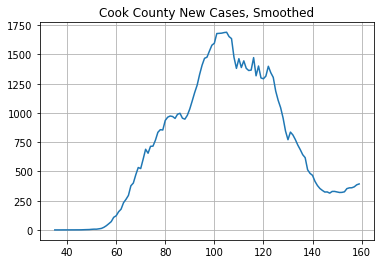

In [17]:

num_days = 7

print(detect_consecutive_decline(14, num_days, pd.Series(cook_new_cases[35-num_days:]))[-40:])

print(pd.Series(cook_new_cases[35-num_days:]).rolling(num_days).mean()[-40:])

plt.plot(np.arange(35, len(cook_new_cases)), pd.Series(cook_new_cases[35-num_days:]).rolling(num_days).mean()[num_days:])
plt.title("Cook County New Cases, Smoothed")
plt.grid()

In [18]:


# illinois = single_state("IL").sum(axis=1)[1:].reset_index(drop=True) - single_state("IL").sum(axis=1)[:-1].reset_index(drop=True)

# num_days = 2
# threshold = 14

# result = detect_consecutive_decline(threshold, num_days, illinois[35-num_days:])
# print(result[0][-40:], result[1], sep="\n")

# # print(illinois[35-num_days:].rolling(num_days).mean()[-40:])

# plt.plot(np.arange(35, len(cook_new_cases)), illinois[35-num_days:].rolling(num_days).mean()[num_days:])
# plt.title("IL New Cases, Smoothed")
# plt.grid()

# # print(single_state("IL").sum(axis=1))

# Visualizing Entire USA

In [26]:
# df.iterrows().apply(lambda row: row.sum())

new_col = [x[1].sum() for x in df.iterrows()]
df['Country_Agg'] = new_col

In [27]:
country = df['Country_Agg']
country_df = pd.DataFrame(country)
country_df['change'] = calculate_change(country)
country_df

,Country_Agg,change
1/22/20,1,0.000000
1/23/20,1,1.000000
1/24/20,2,0.000000
1/25/20,2,1.500000
1/26/20,5,0.200000
...,...,...
6/26/20,2451171,0.017257
6/27/20,2493470,0.015983
6/28/20,2533323,0.015419
6/29/20,2572385,0.018050


(-0.005, 0.3)

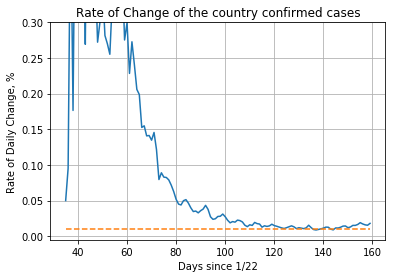

In [28]:
plt.plot(np.arange(35, len(country_df)-1), country_df.change[35:-1])
plt.plot(np.arange(35, len(country_df)-1), [.01]*len(country_df.change[35:-1]), linestyle='dashed')
plt.title("Rate of Change of the country confirmed cases")
plt.xlabel("Days since 1/22")
plt.ylabel("Rate of Daily Change, %")

plt.grid()
# plt.ylim(-0.05, 1.05)
plt.ylim(-0.005, .3)

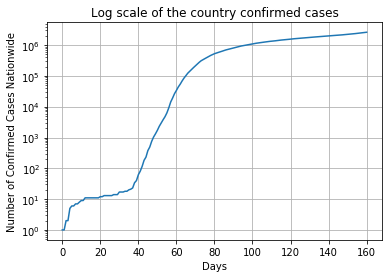

In [29]:
plt.plot(np.arange(0, len(country_df)), country_df['Country_Agg'])
plt.title("Log scale of the country confirmed cases")
plt.xlabel("Days")
plt.ylabel("Number of Confirmed Cases Nationwide")

plt.yscale('log')
plt.grid()
# plt.xlim(50, 134)
# plt.ylim(1, 50000)

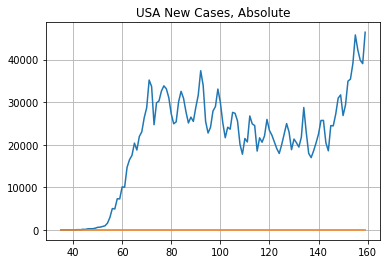

In [30]:
country_new_cases = country_df.values[1:] - country_df.values[:-1]

# print(will)
plt.plot(np.arange(35, len(country_new_cases)), country_new_cases[35:])
plt.title("USA New Cases, Absolute")
plt.grid()

# Plot Big Cities

Some of the counties do not have unique names. To plot them, you must index the DataFrame by that county's name, then take the index of that county in the correct state.

In [130]:
# Example of taking the index of a county in the correct state
# Using Middlesex County, MA as an example
print(state_col[state_col.index == 'Middlesex County'])
df['Middlesex County'].iloc[:, 1]

County Name
Middlesex County    CT
Middlesex County    MA
Middlesex County    NJ
Middlesex County    VA
Name: State, dtype: object


1/22/20        0
1/23/20        0
1/24/20        0
1/25/20        0
1/26/20        0
           ...  
6/26/20    23786
6/27/20    23859
6/28/20    23915
6/29/20    23946
6/30/20    23962
Name: Middlesex County, Length: 161, dtype: object

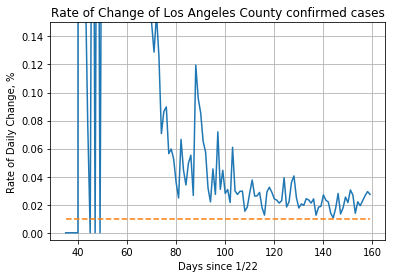

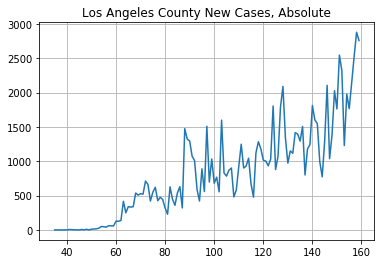

(        Los Angeles County    change
 1/22/20                  0  1.000000
 1/23/20                  0  1.000000
 1/24/20                  0  1.000000
 1/25/20                  0  1.000000
 1/26/20                  1  0.000000
 ...                    ...       ...
 6/26/20              93232  0.022943
 6/27/20              95371  0.026455
 6/28/20              97894  0.029399
 6/29/20             100772  0.027359
 6/30/20             103529  0.000000
 
 [161 rows x 2 columns],
 array([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 4, 2,
        1, 0, 6, 0, 9, 0, 11, 13, 16, 25, 50, 46, 41, 61, 59, 58, 127, 126,
        137, 417, 249, 339, 332, 338, 537, 507, 527, 521, 711, 663, 420,
        550, 620, 425, 475, 443, 319, 228, 627, 449, 358, 537, 630, 320,
        1475, 1324, 1295, 1073, 1009, 590, 421, 889, 559, 1509, 697, 1033,
        679, 768, 555, 1598, 829, 783, 869, 901, 480, 581, 922, 1248, 90

In [126]:
create_roc_and_new_case_numbers(df['Los Angeles County'], 'Los Angeles')

(40, 134)

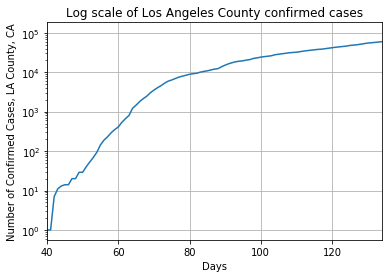

In [40]:
plt.plot(np.arange(0, len(la_df)), la_df['Los Angeles County'])
plt.title("Log scale of Los Angeles County confirmed cases")
plt.xlabel("Days")
plt.ylabel("Number of Confirmed Cases, LA County, CA")

plt.yscale('log')
plt.grid()
plt.xlim(40, 134)

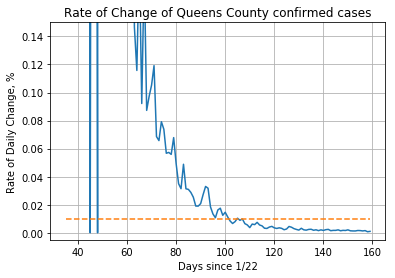

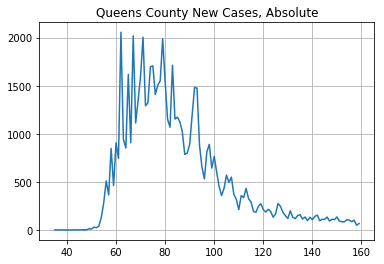

(        Queens County    change
 1/22/20             0  1.000000
 1/23/20             0  1.000000
 1/24/20             0  1.000000
 1/25/20             0  1.000000
 1/26/20             0  1.000000
 ...               ...       ...
 6/26/20         65089  0.001321
 6/27/20         65175  0.001550
 6/28/20         65276  0.000751
 6/29/20         65325  0.001010
 6/30/20         65391  0.000000
 
 [161 rows x 2 columns],
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        1, 0, 1, 2, 0, 13, 9, 29, 23, 40, 130, 285, 509, 364, 848, 461,
        906, 743, 2056, 942, 852, 1617, 906, 2019, 1113, 1348, 1602, 2004,
        1291, 1322, 1697, 1707, 1408, 1504, 1551, 1988, 1544, 1150, 1068,
        1712, 1153, 1173, 1125, 1021, 786, 799, 891, 1191, 1483, 1474, 884,
        654, 530, 812, 890, 643, 765, 601, 450, 358, 432, 570, 494, 549,
        369, 318, 211, 357, 336, 432, 325, 291, 192, 184, 2

In [51]:
create_roc_and_new_case_numbers(df['Queens County'], 'Queens')

(40, 134)

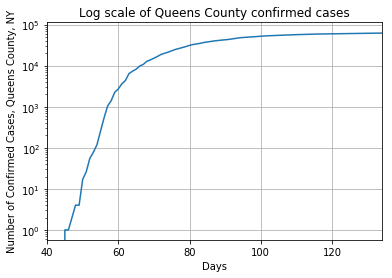

In [125]:
plt.plot(np.arange(0, len(df)), df['Queens County'])
plt.title("Log scale of Queens County confirmed cases")
plt.xlabel("Days")
plt.ylabel("Number of Confirmed Cases, Queens County, NY")

plt.yscale('log')
plt.grid()
plt.xlim(40, 134)

In [131]:
# Lists of several large counties, broken down by geographic north/south

southern = ["Los Angeles", "San Bernardino", "Riverside", "San Diego", "Orange", "Maricopa", 
        "Dallas", "Harris", "Miami-Dade", "Clark", "Broward", "Palm Beach"]
south2 = [df['Los Angeles County'], df['San Bernardino County'], df['Riverside County'],
         df['San Diego County'], df['Los Angeles County'], df['Maricopa County'], 
         df['Dallas County'].iloc[:,4], df['Harris County'].iloc[:,1], df['Miami-Dade County'],
         df['Clark County'].iloc[:,7], df['Broward County'], df['Palm Beach County']]

northern = ["King", "Yakima", "Cook", "Wayne", "Prince George's", "Fairfax", "Montgomery", 
        "Middlesex", "Union", "Essex", "Hudson", "Passaic", "Bergen", "Kings", "Queens",
        "Nassau", "Suffolk", "Westchester", "Fairfield", "Middlesex"]

north2 = [df['King County'].iloc[:,1], df['Yakima County'], df['Cook County'].iloc[:,1],
         df['Riverside County'], df['Wayne County'].iloc[:,5], df['Prince George\'s County'],
         df['Fairfax County'], df['Montgomery County'].iloc[:,8], df['Riverside County'],
         df['Middlesex County'].iloc[:,2], df['Union County'].iloc[:,8], 
         df['Essex County'].iloc[:,1], df['Hudson County'], df['Passaic County'],
         df['Bergen County'], df['Kings County'].iloc[:,1], df['Queens County'],
         df['Nassau County'].iloc[:,1], df['Suffolk County'].iloc[:,1], 
         df['Westchester County'], df['Fairfield County'].iloc[:,0],
         df['Middlesex County'].iloc[:,1] ]

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


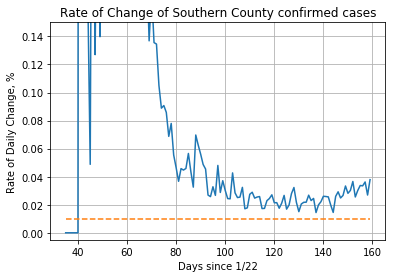

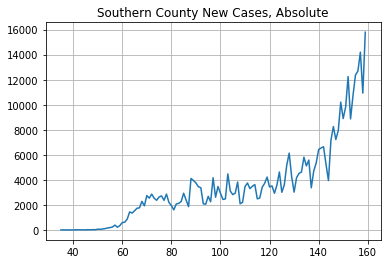

(         South_Agg    change
 1/22/20          0       NaN
 1/23/20          0       NaN
 1/24/20          0       NaN
 1/25/20          0       inf
 1/26/20          3  0.000000
 ...            ...       ...
 6/26/20     379196  0.033463
 6/27/20     391885  0.036233
 6/28/20     406084  0.026908
 6/29/20     417011  0.037862
 6/30/20     432800  0.000000
 
 [161 rows x 2 columns],
 array([    0,     0,     0,     3,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     1,     0,     1,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,    12,    12,     6,     6,
            2,    20,     8,    22,    13,    58,    50,    73,   105,
          155,   185,   232,   385,   215,   343,   588,   614,   857,
         1439,  1344,  1527,  1732,  1764,  2282,  1923,  2744,  2538,
         2860,  2532,  2368,  2632,  2716,  2

In [66]:
new_col = [x[1].sum() for x in pd.concat(south2, axis=1).iterrows()]
df['South_Agg'] = new_col

create_roc_and_new_case_numbers(df['South_Agg'], 'Southern')

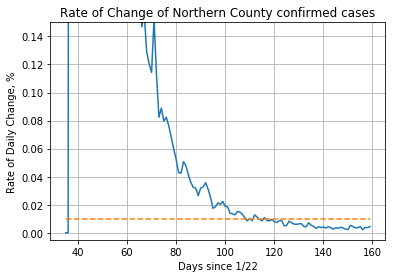

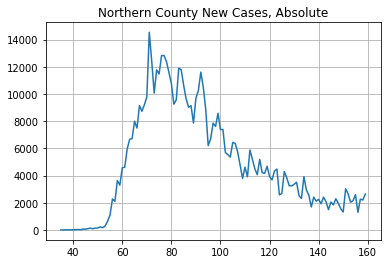

(         North_Agg    change
 1/22/20          1  0.000000
 1/23/20          1  1.000000
 1/24/20          2  0.000000
 1/25/20          2  0.000000
 1/26/20          2  0.000000
 ...            ...       ...
 6/26/20     594720  0.002176
 6/27/20     596014  0.003802
 6/28/20     598280  0.003676
 6/29/20     600479  0.004388
 6/30/20     603114  0.000000
 
 [161 rows x 2 columns],
 array([    0,     1,     0,     0,     0,     0,     0,     0,     1,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     5,     4,     6,     8,    19,    33,    12,    60,
           53,    97,   130,    86,   134,   143,   224,   165,   283,
          632,  1091,  2275,  2105,  3629,  3292,  4566,  4612,  5948,
         6661,  6722,  7990,  7490,  9140,  8727,  9200,  9779, 14538,
        12387, 10067, 11767, 11472, 12818, 12

In [67]:
new_col = [x[1].sum() for x in pd.concat(north2, axis=1).iterrows()]
df['North_Agg'] = new_col

create_roc_and_new_case_numbers(df['North_Agg'], 'Northern')

In [199]:
pd.DataFrame(state_col[1:]).groupby("State").groups.keys()

southwest = ["AZ", "NM", "TX", "OK"]
west = ["WA", "OR", "CA", "NV", "ID", "UT", "MT", "WY", "CO"]
midwest = ["ND", "SD", "NE", "KS", "MN", "IA", "MO", "WI", "IL", "MI", "IN", "OH"]
southeast = ["AR", "LA", "KY", "TN", "MS", "AL", "GA", "WV", "VA", "NC", "SC", "FL"]
northeast = ["ME", "NH", "VT", "MA", "RI", "CT", "NY", "NJ", "PA", "DE", "MD", "DC"]



# Classify States

In [61]:
df2 = pd.read_csv(filepath)
df2.head()
df2 = df2.set_index("County Name").T
df2.drop(["countyFIPS", "stateFIPS"], inplace=True)

In [62]:
state_col = df2.iloc[0]
df2.drop("State", inplace=True)
# df2['State'] = state_col


## Classifying states based on having more cases since the midpoint (day 106 - 151) or before the midpoint (day 61 - 106)

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


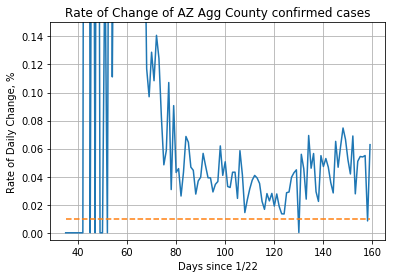

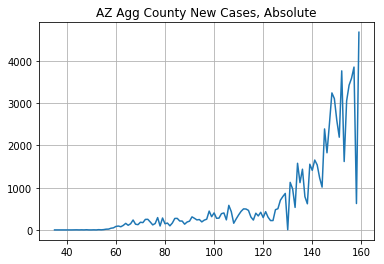

65278
13703
AZ is a mess


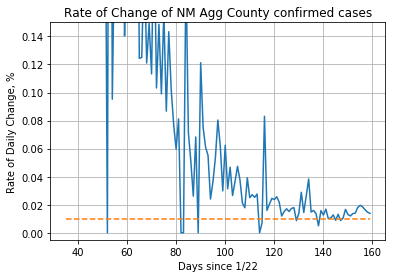

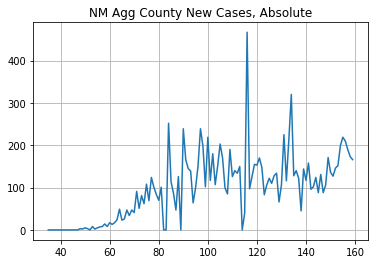

6524
5541
NM is a mess


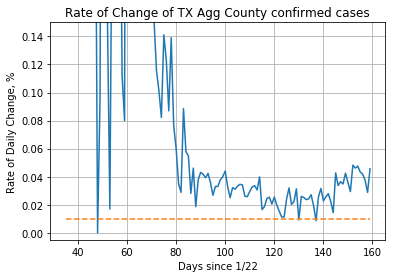

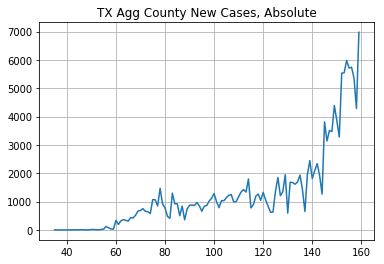

112299
46985
TX is a mess


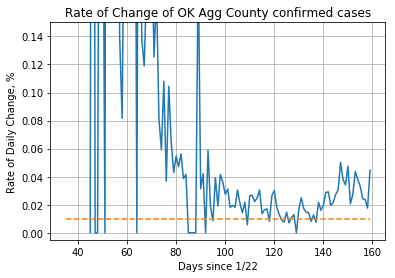

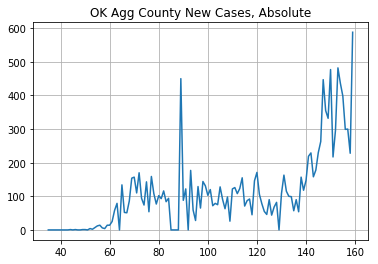

8450
5227
OK is a mess


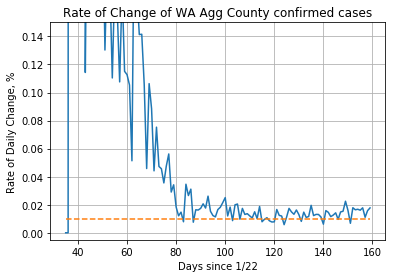

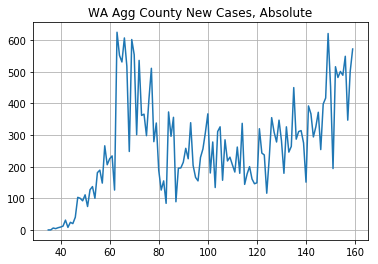

14393
16210
WA is a do-gooder


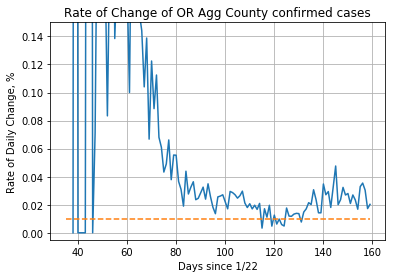

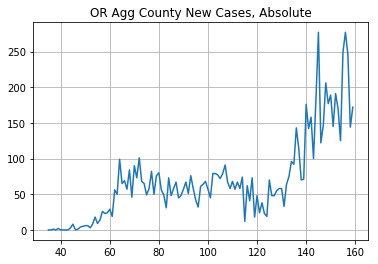

5038
3428
OR is a mess


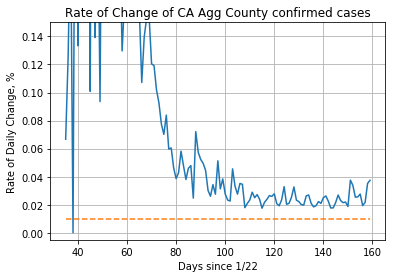

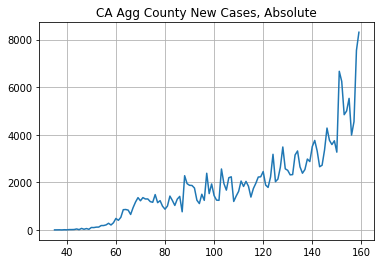

150185
77588
CA is a mess


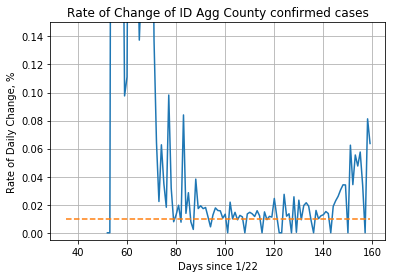

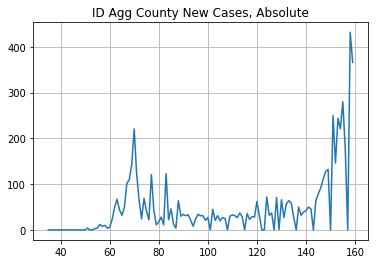

3699
2367
ID is a mess


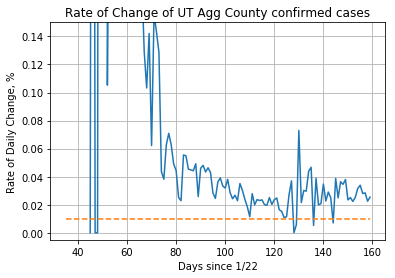

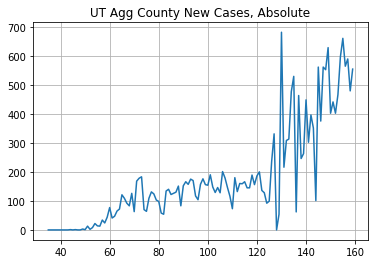

15082
6982
UT is a mess


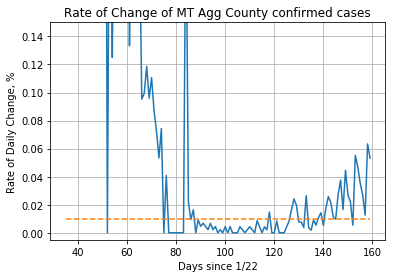

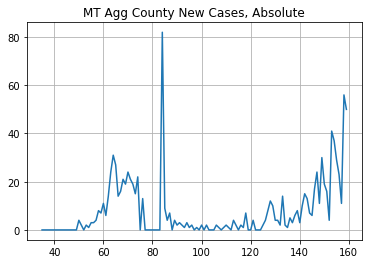

521
424
MT is a mess


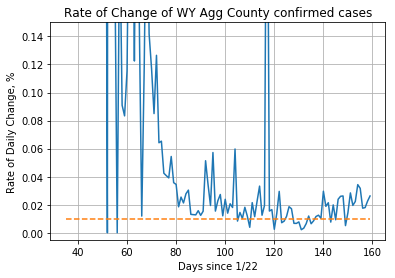

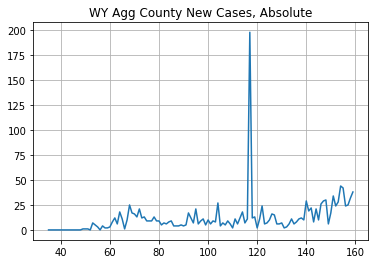

921
537
WY is a mess


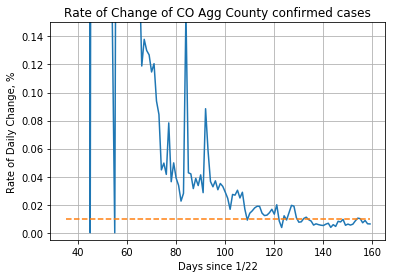

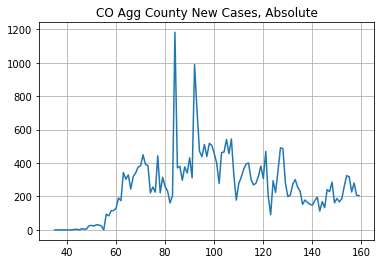

10788
21207
CO is a do-gooder


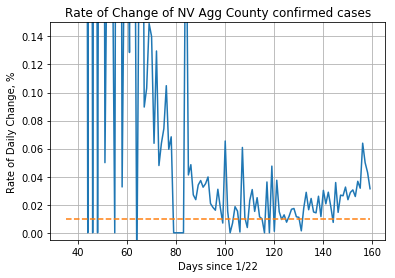

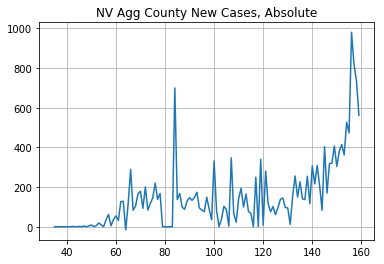

11553
6654
NV is a mess


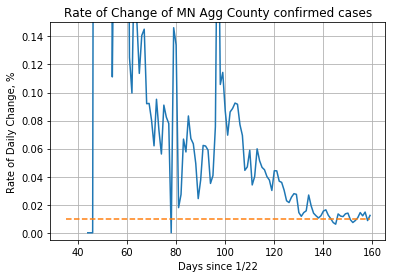

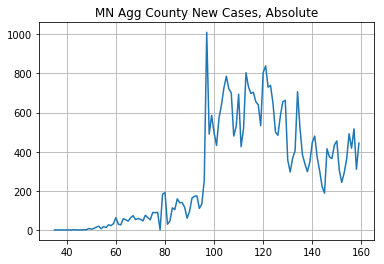

20637
15434
MN is a mess


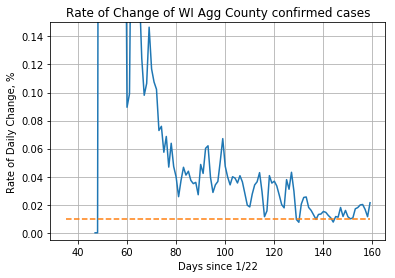

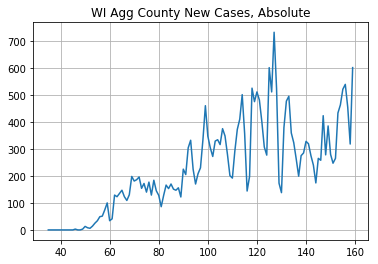

16118
12127
WI is a mess


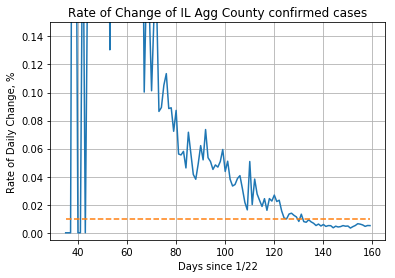

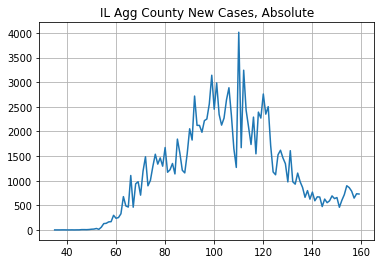

49003
92897
IL is a do-gooder


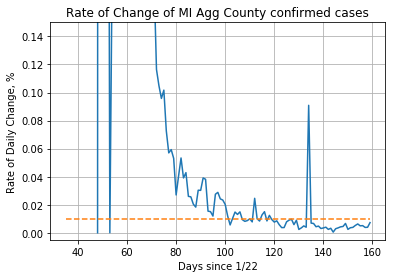

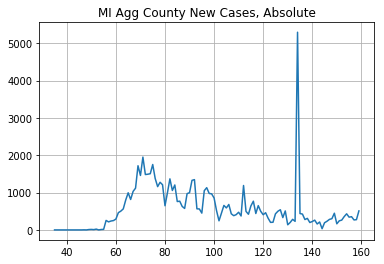

19590
49811
MI is a do-gooder


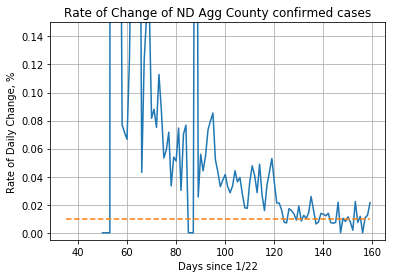

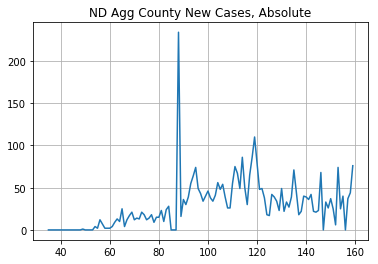

1718
1865
ND is neutral


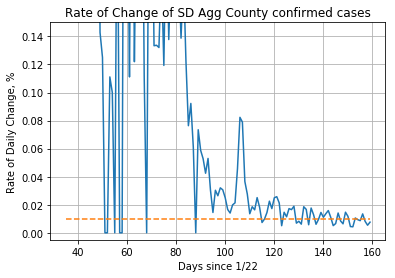

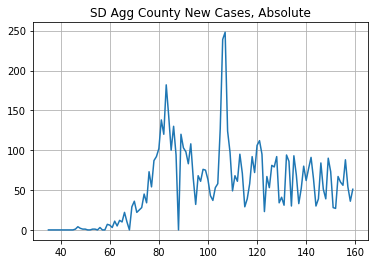

2779
3958
SD is a do-gooder


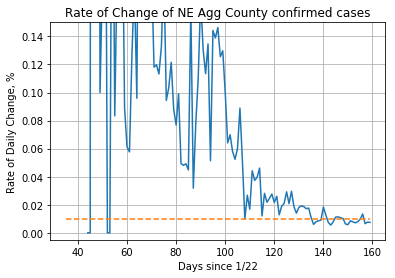

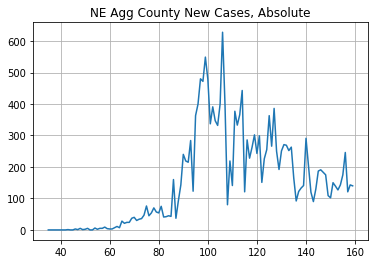

8834
10119
NE is a do-gooder


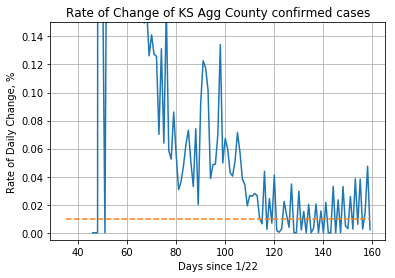

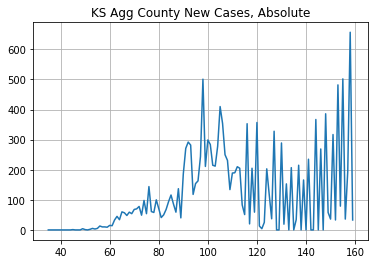

6489
7963
KS is a do-gooder


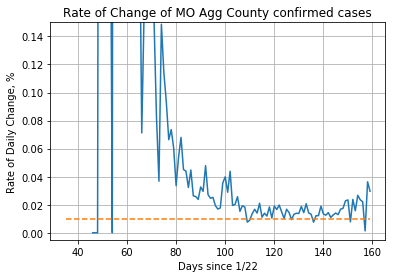

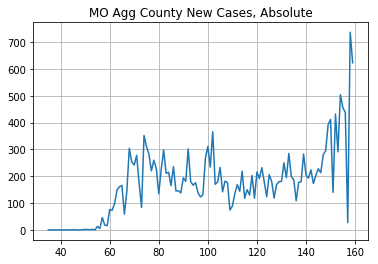

10910
10556
MO is neutral


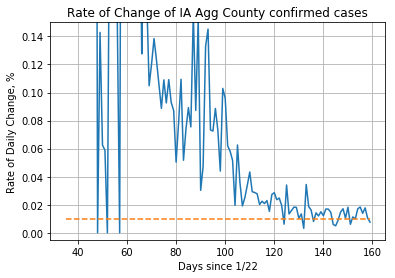

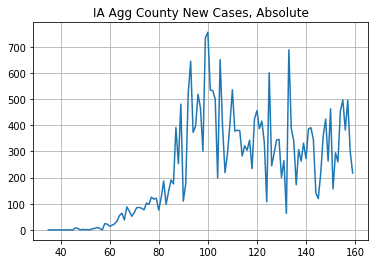

14301
14539
IA is neutral


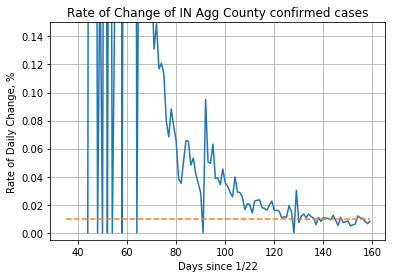

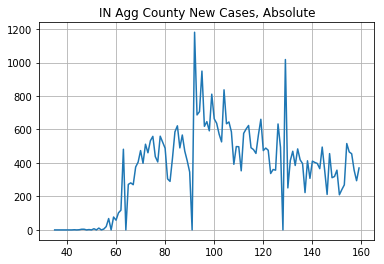

17829
27507
IN is a do-gooder


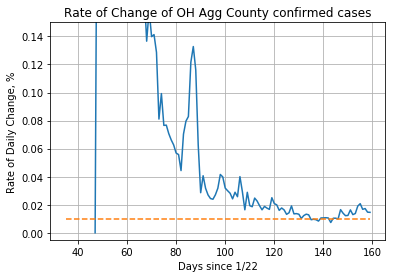

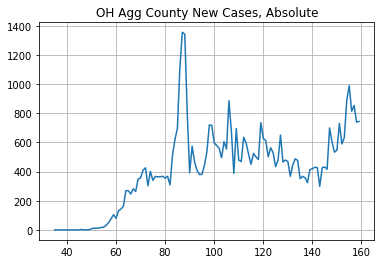

23869
27490
OH is a do-gooder


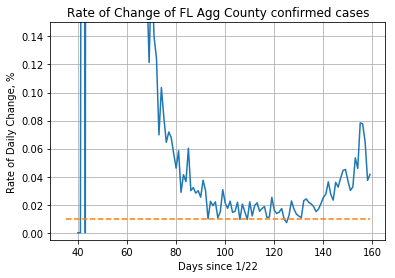

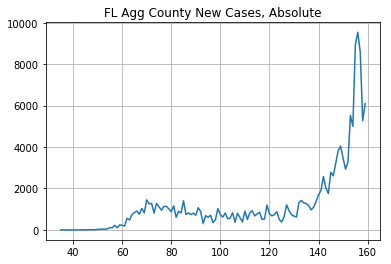

106849
44358
FL is a mess


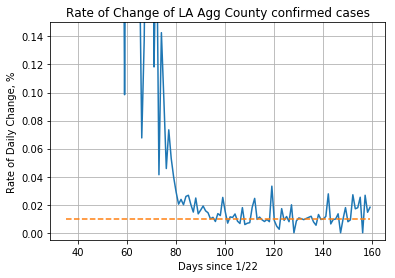

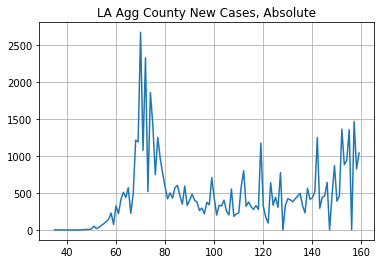

23663
33269
LA is a do-gooder


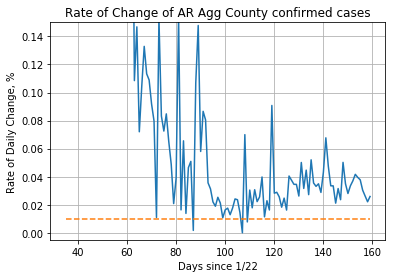

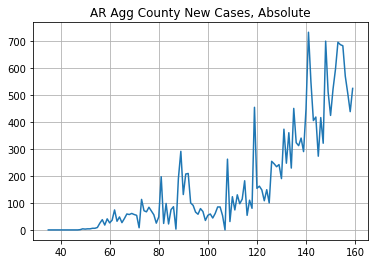

16019
4573
AR is a mess


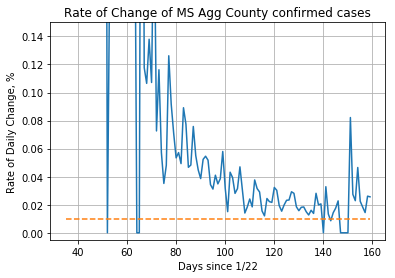

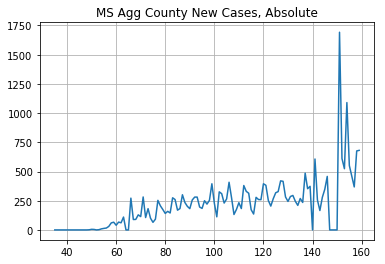

15961
11040
MS is a mess


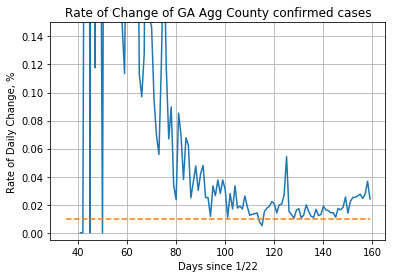

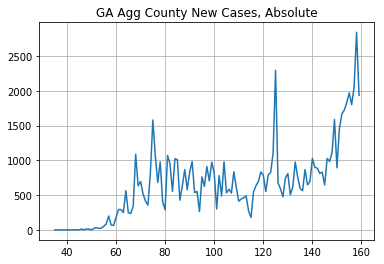

46565
34731
GA is a mess


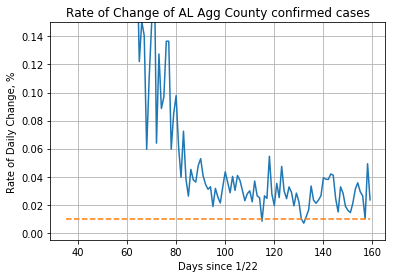

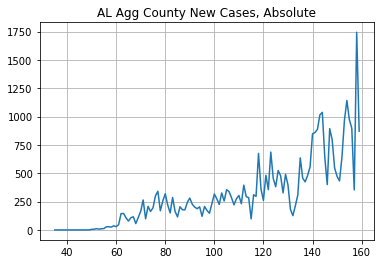

26277
11572
AL is a mess


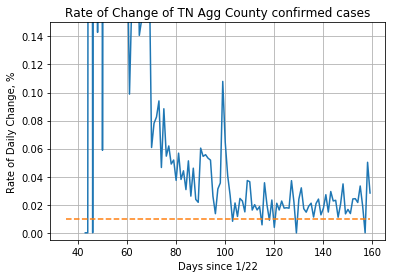

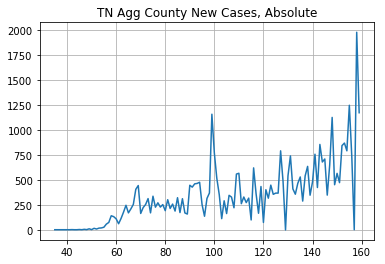

25174
16776
TN is a mess


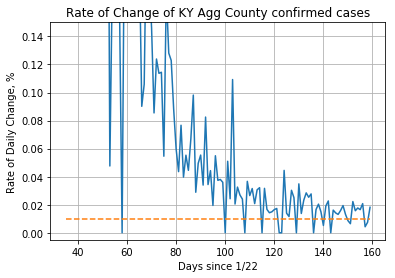

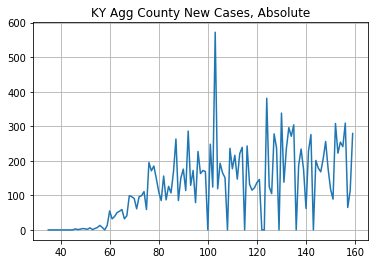

7952
7551
KY is neutral


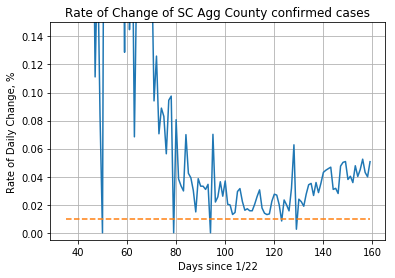

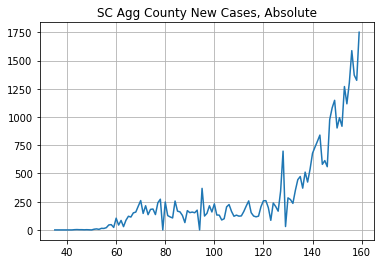

27486
8514
SC is a mess


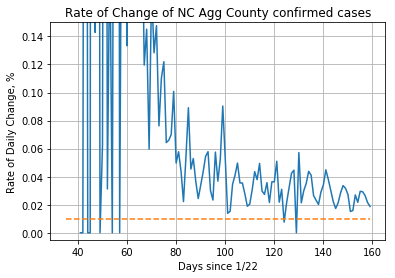

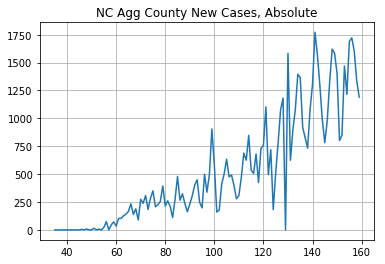

46158
18223
NC is a mess


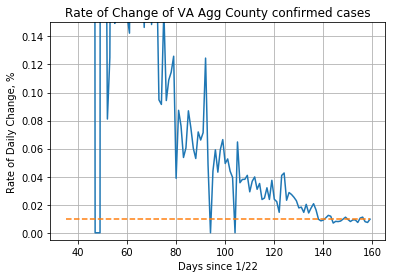

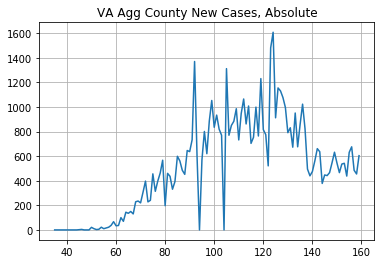

32403
30131
VA is neutral


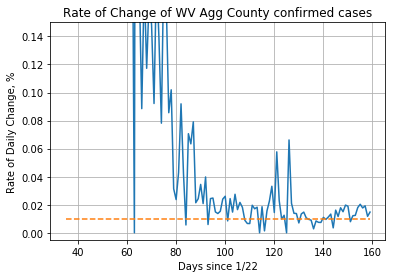

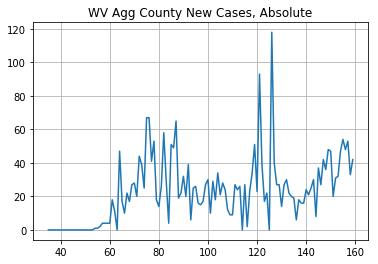

1409
1459
WV is neutral


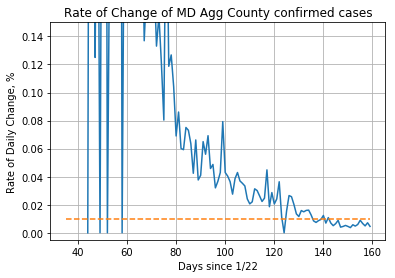

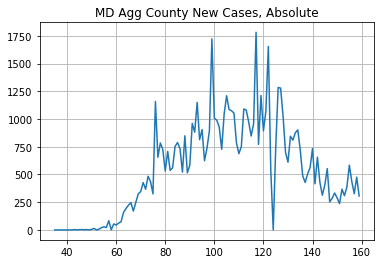

28755
38516
MD is a do-gooder


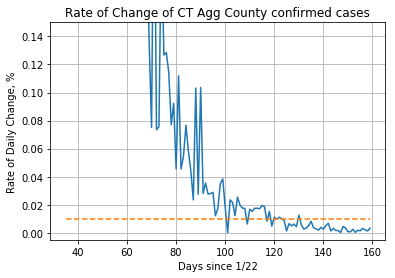

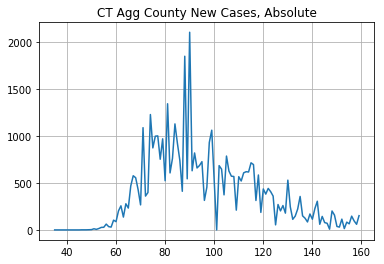

9095
37004
CT is a do-gooder


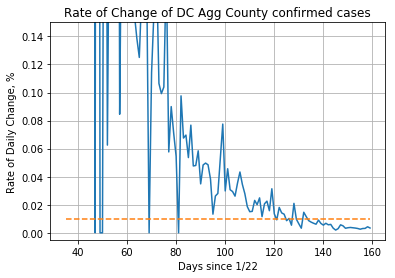

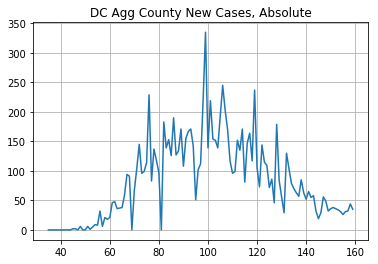

3204
6986
DC is a do-gooder


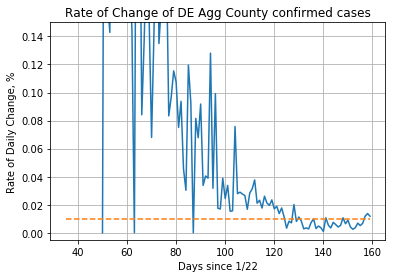

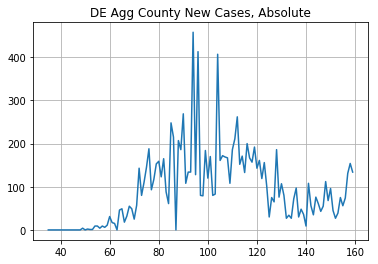

3840
7583
DE is a do-gooder


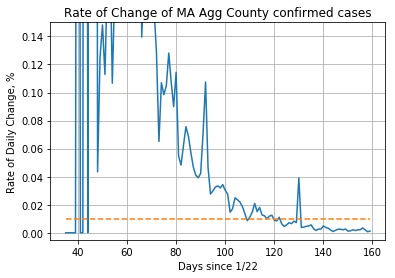

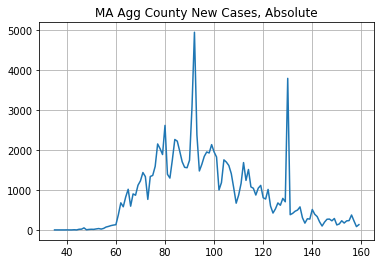

22872
85234
MA is a do-gooder


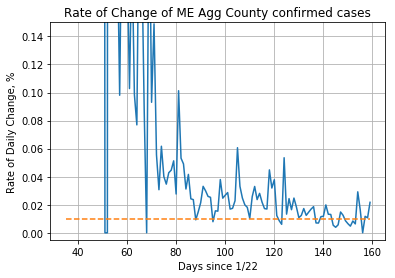

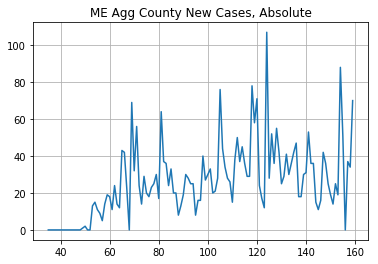

1612
1575
ME is neutral


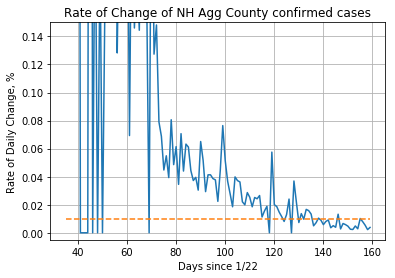

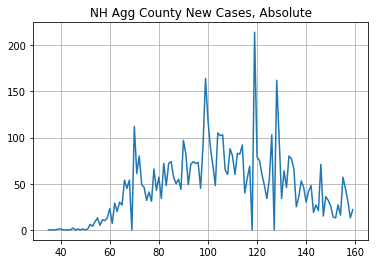

2186
3495
NH is a do-gooder


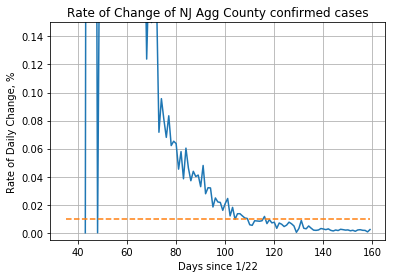

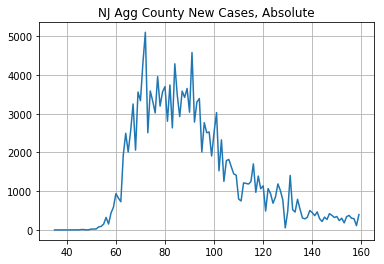

25333
143483
NJ is a do-gooder


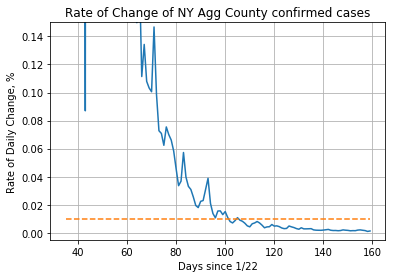

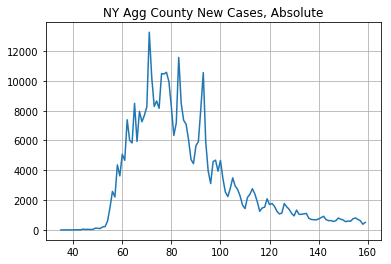

43306
329281
NY is a do-gooder


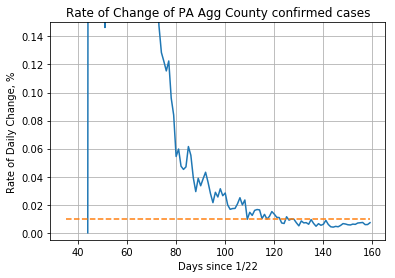

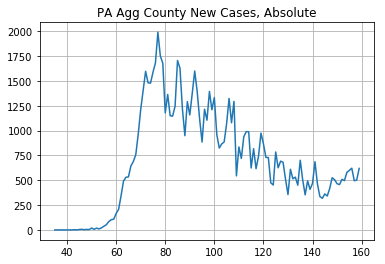

24373
61589
PA is a do-gooder


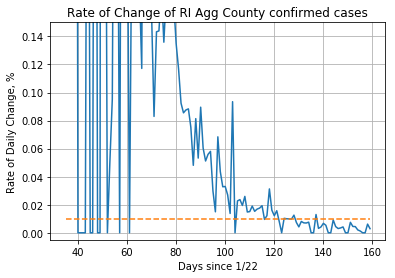

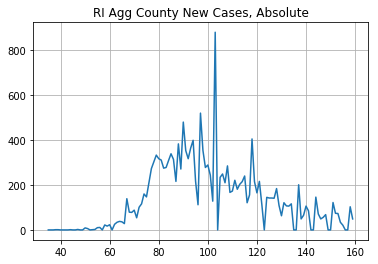

4139
12568
RI is a do-gooder


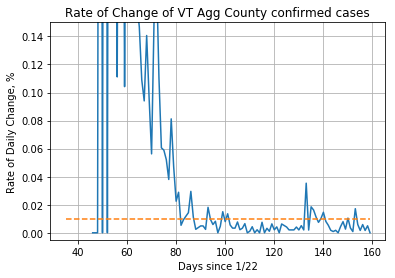

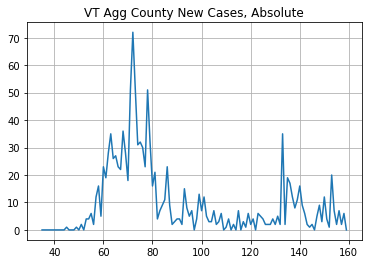

268
864
VT is a do-gooder


In [103]:

state_list = [state for states in [southwest, west,midwest ,southeast ,northeast ] for state in states]

good_states = []
bad_states = []
neutral_states = []
kinda_good_states = []
kinda_bad_states = []

neg_diffs = []
pos_diffs = []
neg_ratios = []
pos_ratios = []
neutral_diffs = []
neutral_ratios = []

for state in state_list:
    y = single_state(state)
    new_col = [x[1].sum() for x in y.iterrows()]
    df['{}_agg'.format(state)] = new_col
    x = create_roc_and_new_case_numbers(df['{}_agg'.format(state)], '{} Agg'.format(state))
    print(x[1][midpoint:].sum())
    print(x[1][61:midpoint].sum())
    if abs(x[1][midpoint:].sum() - x[1][61:midpoint].sum()) < x[1][61:].sum() * .05:
        print("{} is neutral".format(state))
        neutral_states.append(state)
        neutral_diffs.append(abs(x[1][61:midpoint].sum() - x[1][midpoint:].sum()))
        if x[1][61:midpoint].sum() > x[1][midpoint:].sum():
            neutral_ratios.append(x[1][61:midpoint].sum() / x[1][midpoint:].sum())
        else:
            neutral_ratios.append(x[1][midpoint:].sum() / x[1][61:midpoint].sum())
    elif x[1][midpoint:].sum() > x[1][61:midpoint].sum():
#         if np.percentile(np.array(all_ratios), 50) < x[1][midpoint:].sum() / x[1][61:midpoint].sum():
        if True:
            print("{} is a mess".format(state))
            bad_states.append(state)
            neg_diffs.append(x[1][midpoint:].sum() - x[1][61:midpoint].sum())
            neg_ratios.append(x[1][midpoint:].sum() / x[1][61:midpoint].sum())
        else:
            print("{} is kinda bad".format(state))
            kinda_bad_states.append(state)
            neg_diffs.append(x[1][midpoint:].sum() - x[1][61:midpoint].sum())
            neg_ratios.append(x[1][midpoint:].sum() / x[1][61:midpoint].sum())
    else:
#         if np.percentile(np.array(all_ratios), 50) < x[1][61:midpoint].sum() / x[1][midpoint:].sum():
        if True:
            print("{} is a do-gooder".format(state))
            good_states.append(state)
            pos_diffs.append(x[1][61:midpoint].sum() - x[1][midpoint:].sum())
            pos_ratios.append(x[1][61:midpoint].sum() / x[1][midpoint:].sum())
        else:
            print("{} is kinda good".format(state))
            kinda_good_states.append(state)
            pos_diffs.append(x[1][61:midpoint].sum() - x[1][midpoint:].sum())
            pos_ratios.append(x[1][61:midpoint].sum() / x[1][midpoint:].sum())
all_ratios = pos_ratios.copy()
all_ratios.extend(neg_ratios)
all_ratios.extend(neutral_ratios)

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


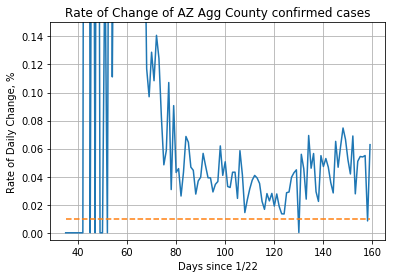

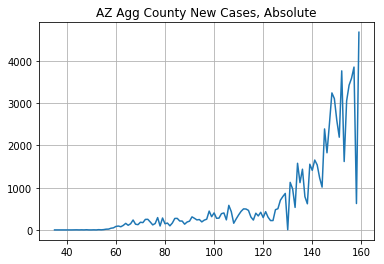

65278
13703
AZ is a mess


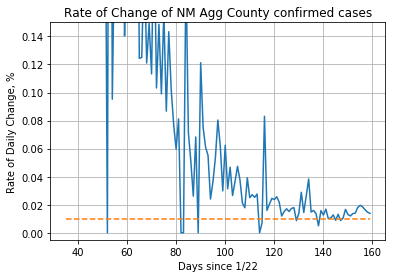

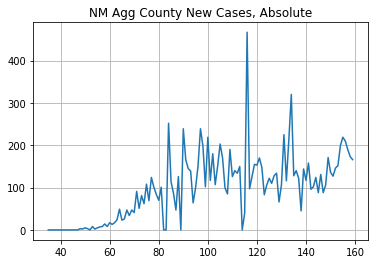

6524
5541
NM is kinda bad


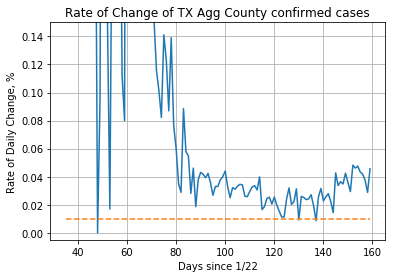

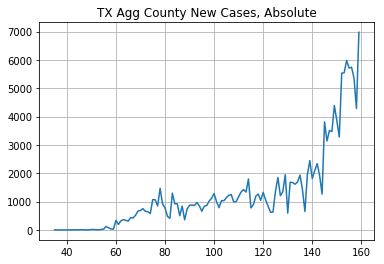

112299
46985
TX is a mess


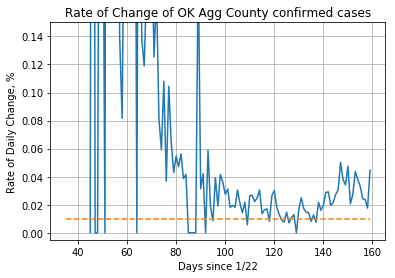

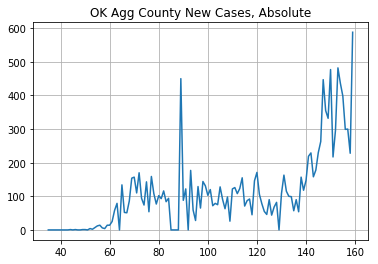

8450
5227
OK is a mess


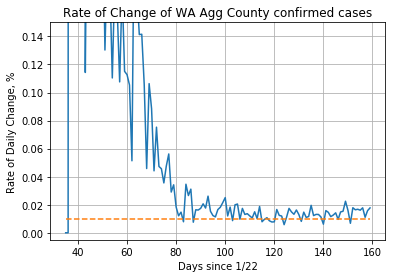

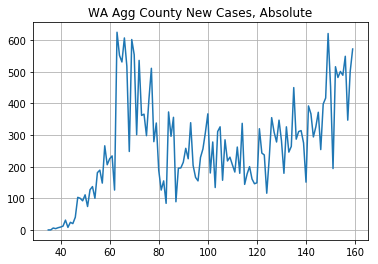

14393
16210
WA is kinda good


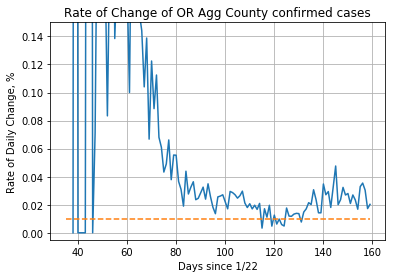

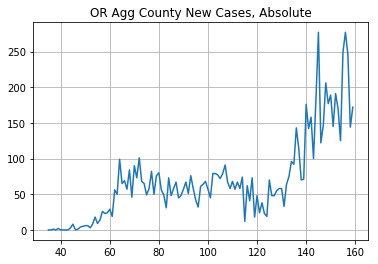

5038
3428
OR is kinda bad


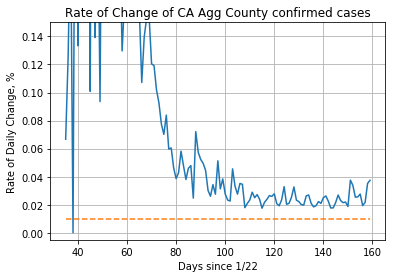

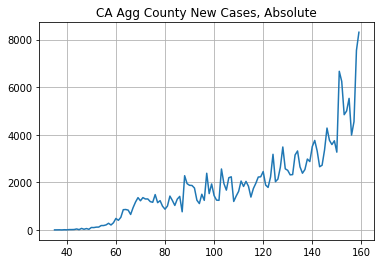

150185
77588
CA is a mess


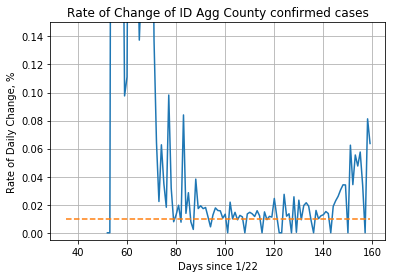

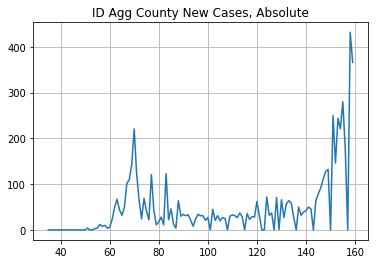

3699
2367
ID is kinda bad


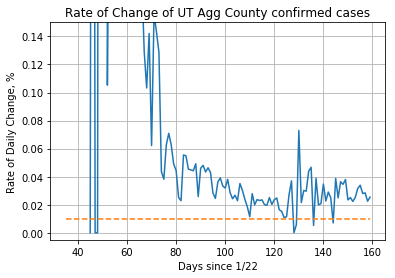

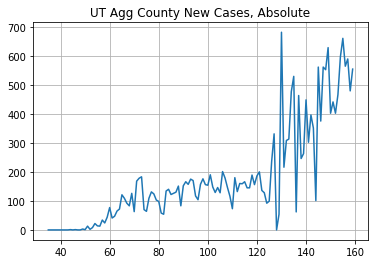

15082
6982
UT is a mess


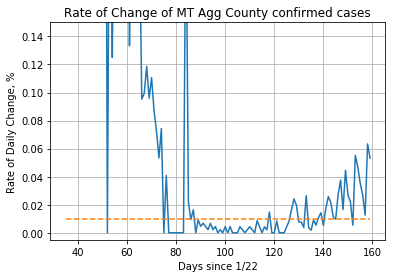

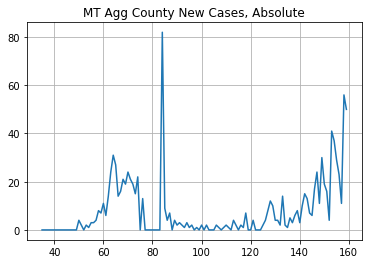

521
424
MT is kinda bad


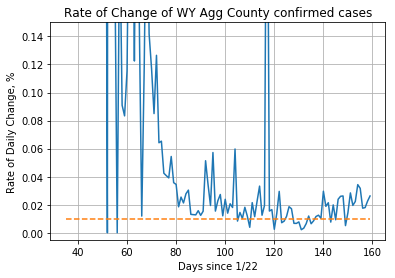

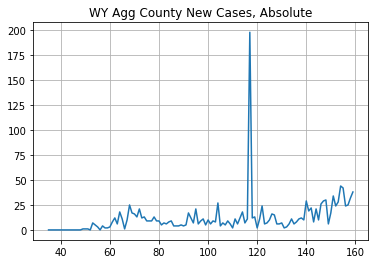

921
537
WY is a mess


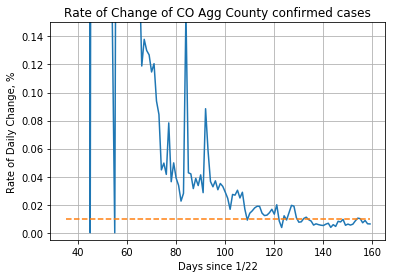

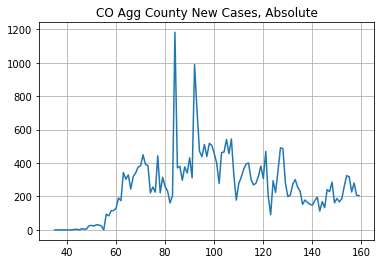

10788
21207
CO is a do-gooder


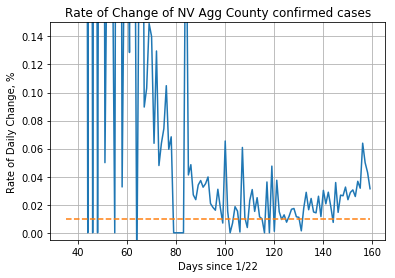

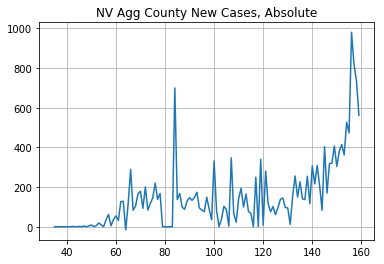

11553
6654
NV is a mess


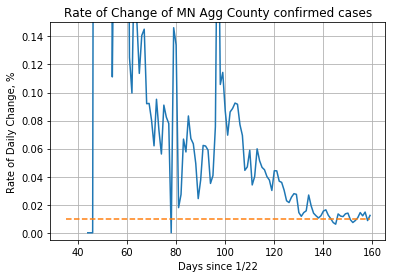

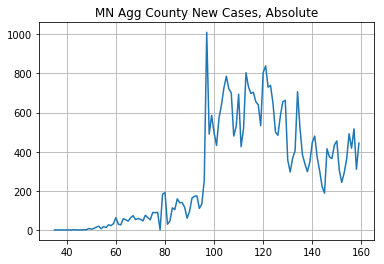

20637
15434
MN is kinda bad


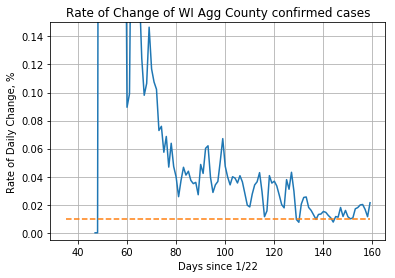

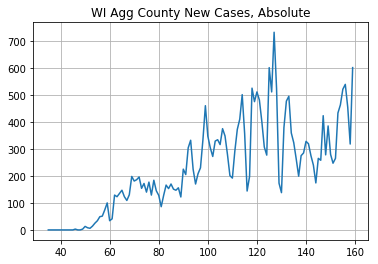

16118
12127
WI is kinda bad


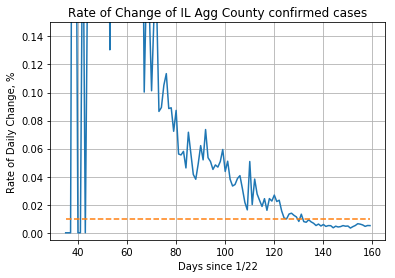

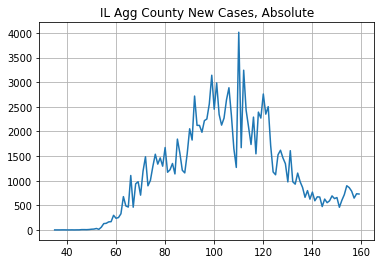

49003
92897
IL is a do-gooder


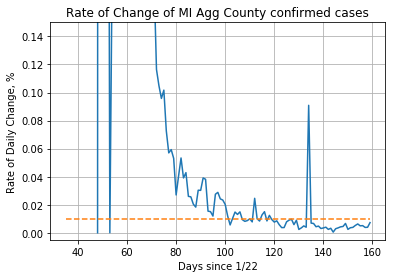

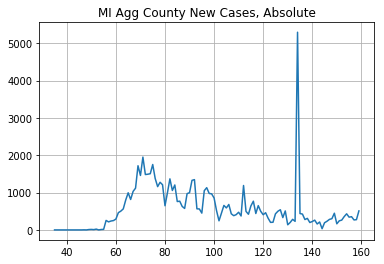

19590
49811
MI is a do-gooder


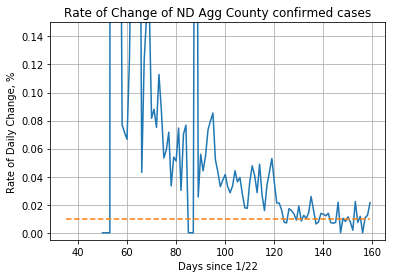

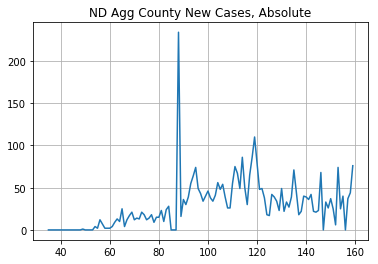

1718
1865
ND is neutral


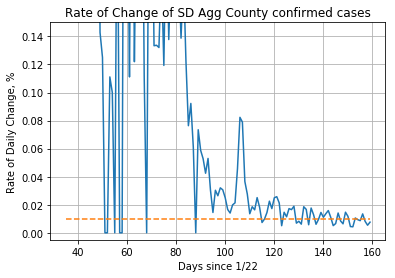

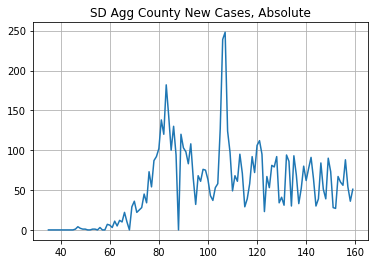

2779
3958
SD is kinda good


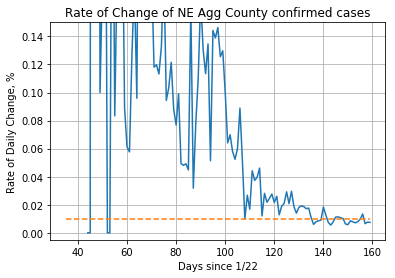

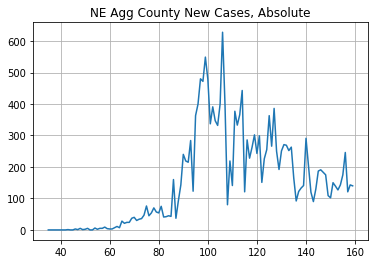

8834
10119
NE is kinda good


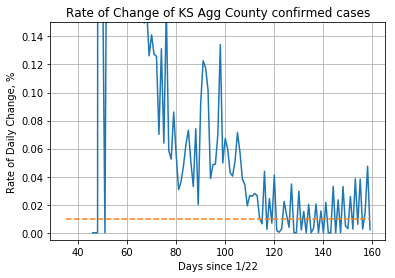

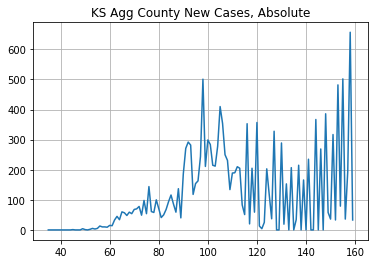

6489
7963
KS is kinda good


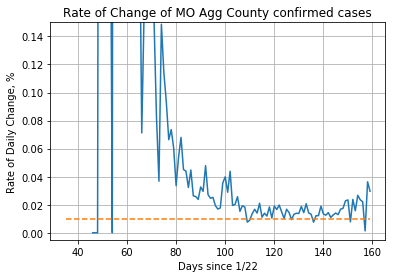

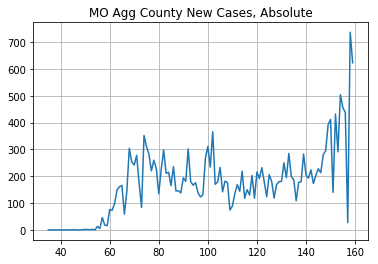

10910
10556
MO is neutral


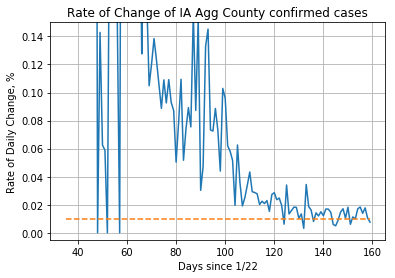

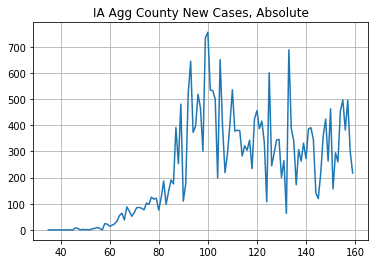

14301
14539
IA is neutral


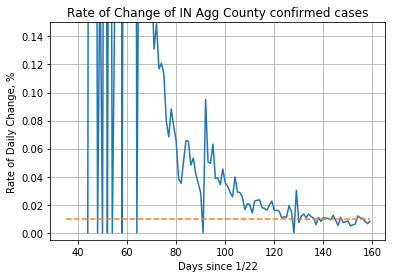

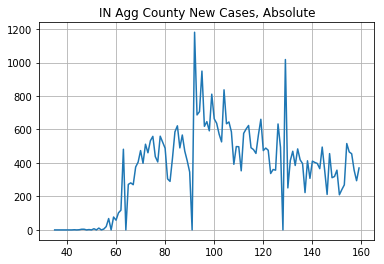

17829
27507
IN is kinda good


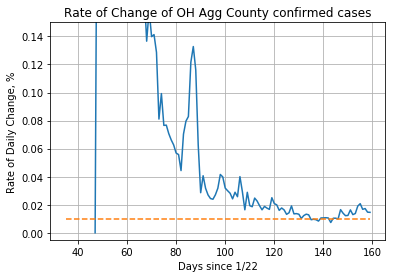

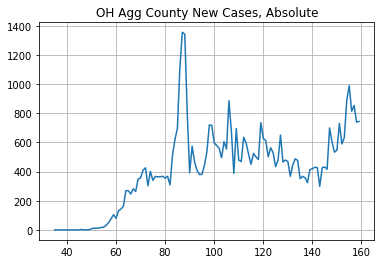

23869
27490
OH is kinda good


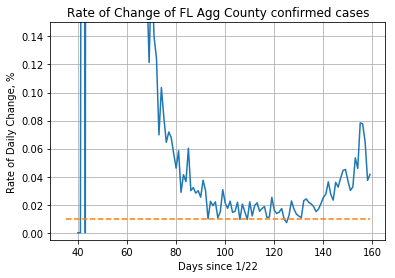

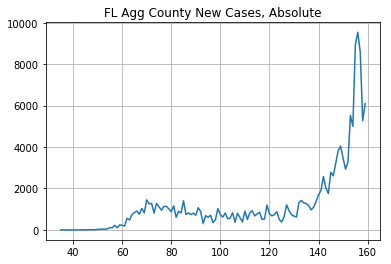

106849
44358
FL is a mess


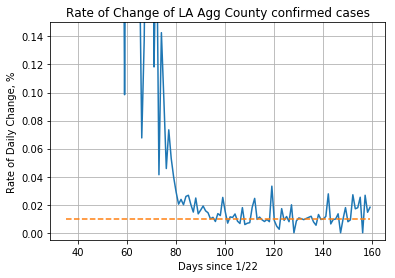

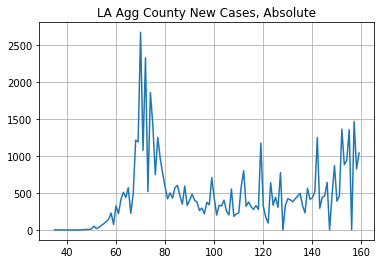

23663
33269
LA is kinda good


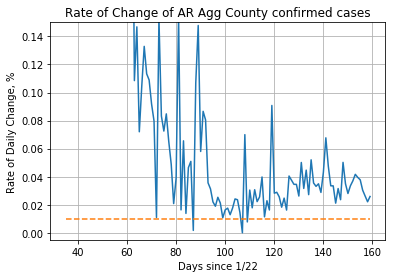

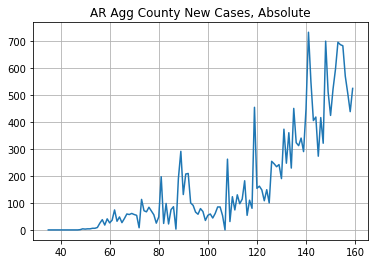

16019
4573
AR is a mess


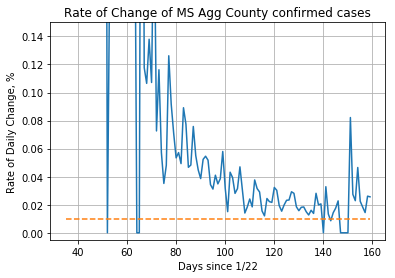

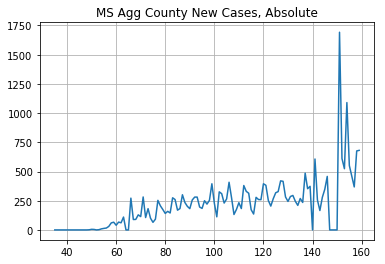

15961
11040
MS is kinda bad


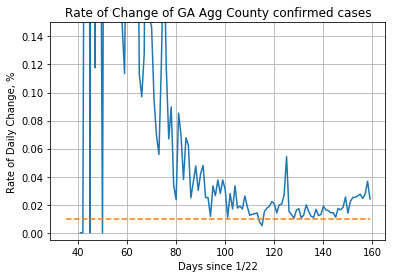

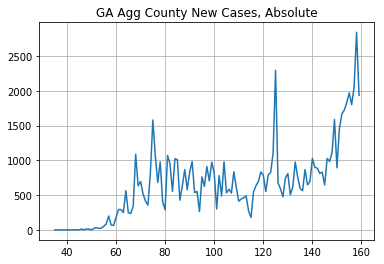

46565
34731
GA is kinda bad


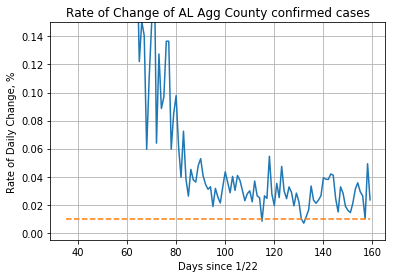

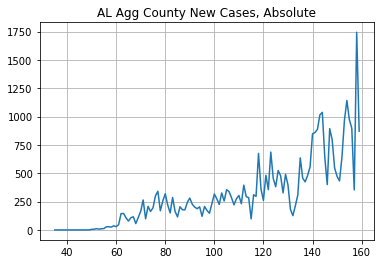

26277
11572
AL is a mess


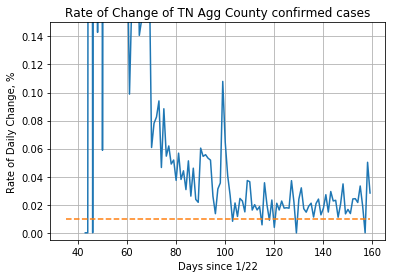

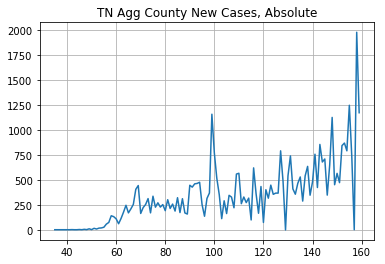

25174
16776
TN is kinda bad


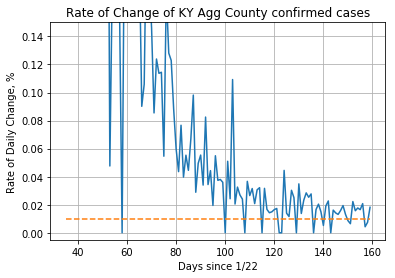

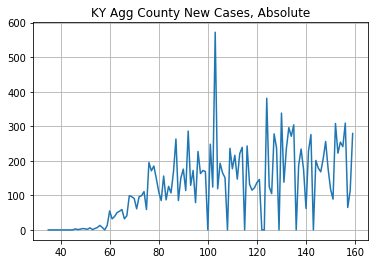

7952
7551
KY is neutral


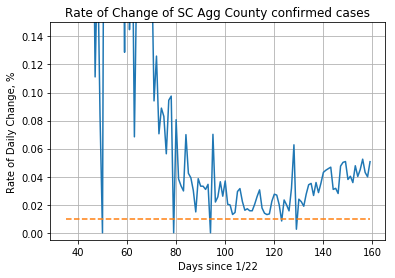

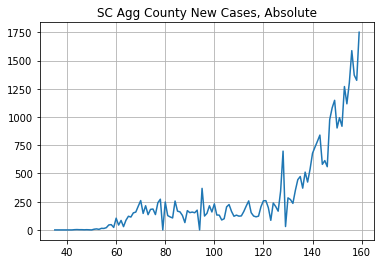

27486
8514
SC is a mess


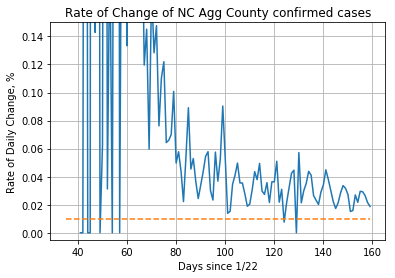

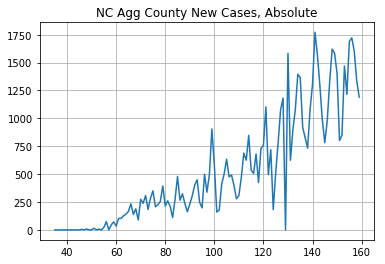

46158
18223
NC is a mess


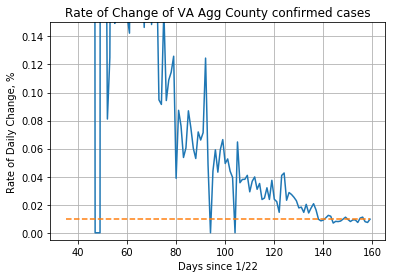

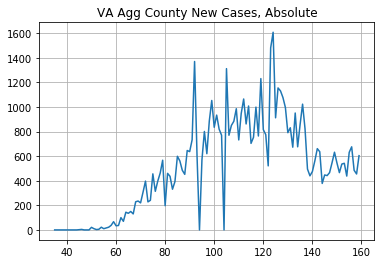

32403
30131
VA is neutral


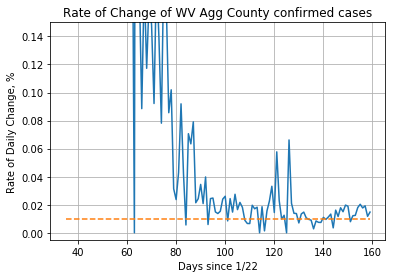

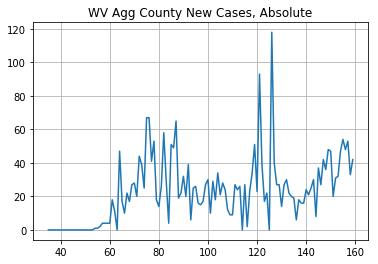

1409
1459
WV is neutral


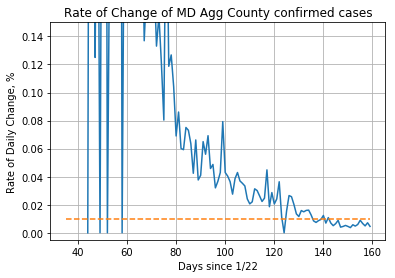

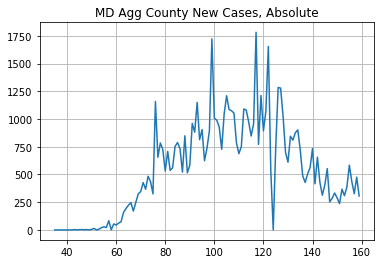

28755
38516
MD is kinda good


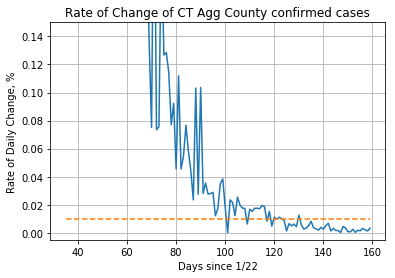

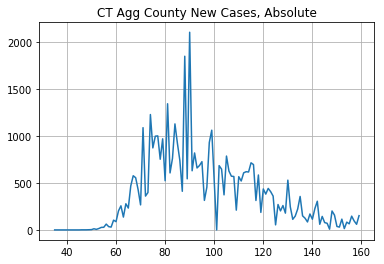

9095
37004
CT is a do-gooder


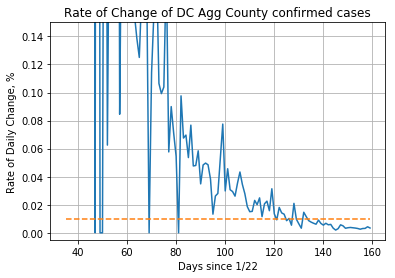

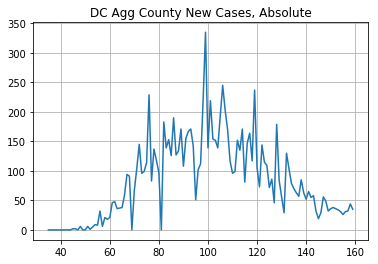

3204
6986
DC is a do-gooder


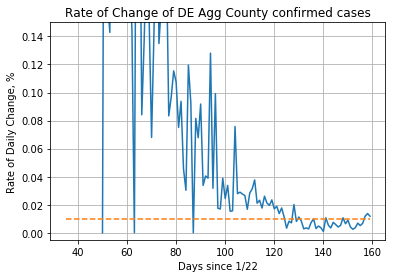

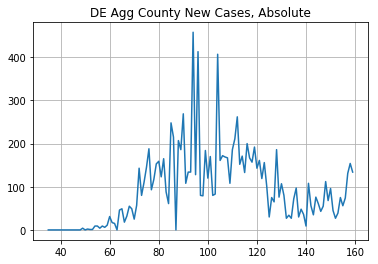

3840
7583
DE is a do-gooder


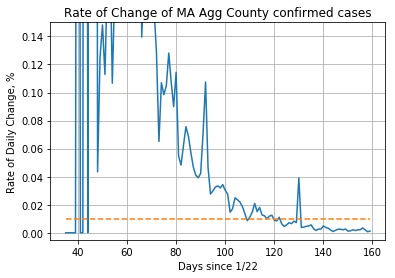

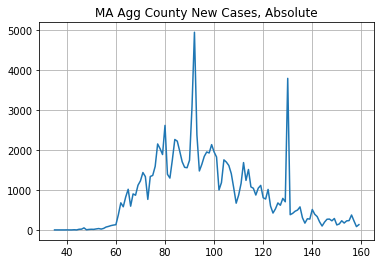

22872
85234
MA is a do-gooder


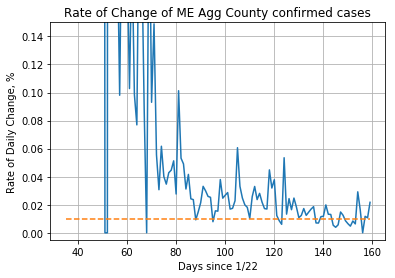

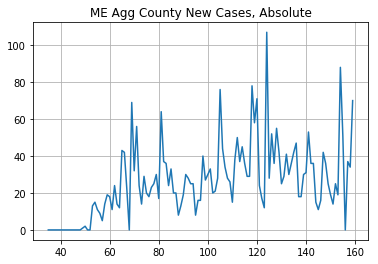

1612
1575
ME is neutral


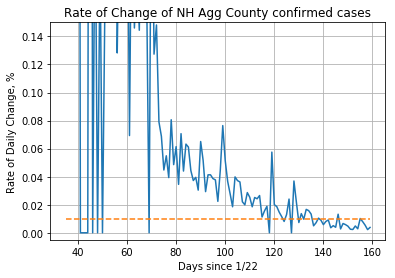

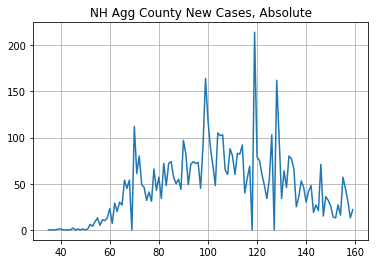

2186
3495
NH is kinda good


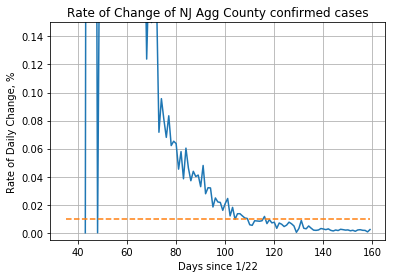

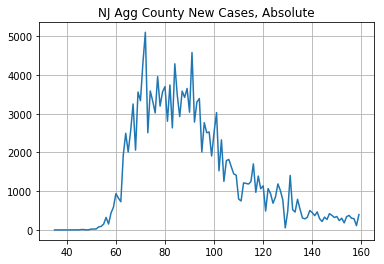

25333
143483
NJ is a do-gooder


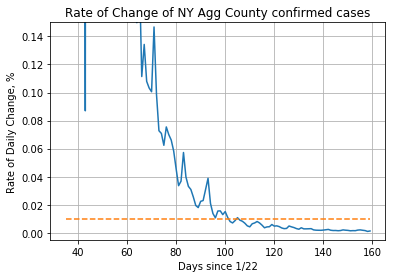

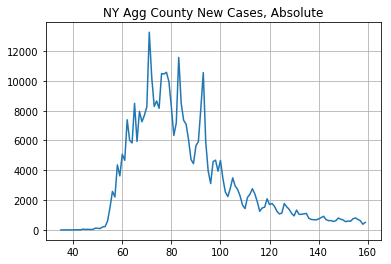

43306
329281
NY is a do-gooder


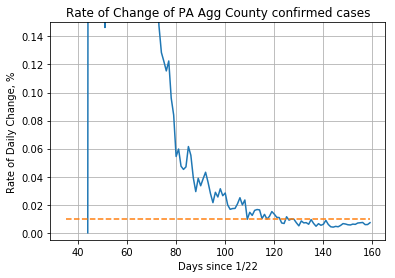

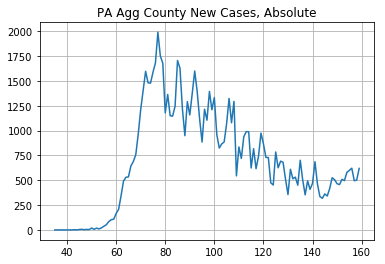

24373
61589
PA is a do-gooder


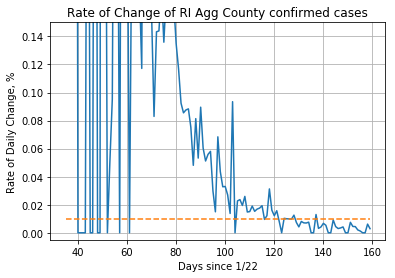

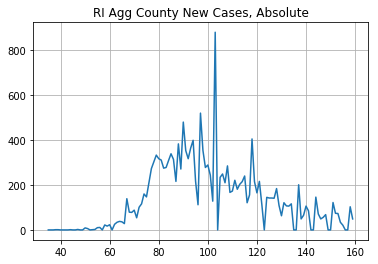

4139
12568
RI is a do-gooder


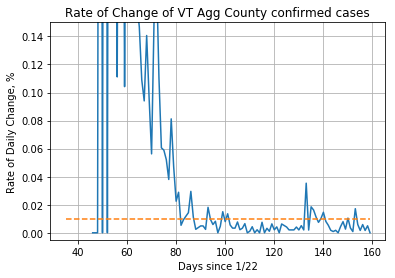

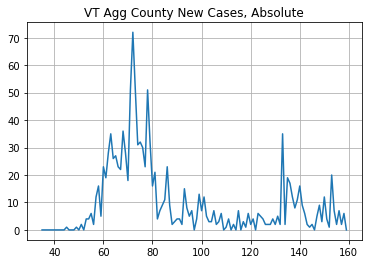

268
864
VT is a do-gooder


In [104]:
# Classifying states based on having more cases since the midpoint (day 106 - 151)
# or before the midpoint (day 61 - 106)

state_list = [state for states in [southwest, west,midwest ,southeast ,northeast ] for state in states]

good_states = []
bad_states = []
neutral_states = []
kinda_good_states = []
kinda_bad_states = []

neg_diffs = []
pos_diffs = []
neg_ratios = []
pos_ratios = []
neutral_diffs = []
neutral_ratios = []

for state in state_list:
    y = single_state(state)
    new_col = [x[1].sum() for x in y.iterrows()]
    df['{}_agg'.format(state)] = new_col
    x = create_roc_and_new_case_numbers(df['{}_agg'.format(state)], '{} Agg'.format(state))
    print(x[1][midpoint:].sum())
    print(x[1][61:midpoint].sum())
    if abs(x[1][midpoint:].sum() - x[1][61:midpoint].sum()) < x[1][61:].sum() * .05:
        print("{} is neutral".format(state))
        neutral_states.append(state)
        neutral_diffs.append(abs(x[1][61:midpoint].sum() - x[1][midpoint:].sum()))
        if x[1][61:midpoint].sum() > x[1][midpoint:].sum():
            neutral_ratios.append(x[1][61:midpoint].sum() / x[1][midpoint:].sum())
        else:
            neutral_ratios.append(x[1][midpoint:].sum() / x[1][61:midpoint].sum())
    elif x[1][midpoint:].sum() > x[1][61:midpoint].sum():
        if np.percentile(np.array(all_ratios), 50) < x[1][midpoint:].sum() / x[1][61:midpoint].sum():
#         if True:
            print("{} is a mess".format(state))
            bad_states.append(state)
            neg_diffs.append(x[1][midpoint:].sum() - x[1][61:midpoint].sum())
            neg_ratios.append(x[1][midpoint:].sum() / x[1][61:midpoint].sum())
        else:
            print("{} is kinda bad".format(state))
            kinda_bad_states.append(state)
            neg_diffs.append(x[1][midpoint:].sum() - x[1][61:midpoint].sum())
            neg_ratios.append(x[1][midpoint:].sum() / x[1][61:midpoint].sum())
    else:
        if np.percentile(np.array(all_ratios), 50) < x[1][61:midpoint].sum() / x[1][midpoint:].sum():
#         if True:
            print("{} is a do-gooder".format(state))
            good_states.append(state)
            pos_diffs.append(x[1][61:midpoint].sum() - x[1][midpoint:].sum())
            pos_ratios.append(x[1][61:midpoint].sum() / x[1][midpoint:].sum())
        else:
            print("{} is kinda good".format(state))
            kinda_good_states.append(state)
            pos_diffs.append(x[1][61:midpoint].sum() - x[1][midpoint:].sum())
            pos_ratios.append(x[1][61:midpoint].sum() / x[1][midpoint:].sum())

In [71]:
# print(pos_diffs, neg_diffs)
# print()
# print(np.array(pos_diffs).max(), np.array(neg_diffs).max())
# print()

# print(pos_ratios, neg_ratios)
# print()
# print(np.array(pos_ratios).max(), np.array(neg_ratios).max())
# print()
# print(neutral_diffs)
# print(np.array(neutral_diffs).max())
# print(neutral_ratios)
# print(np.array(neutral_ratios).max())
# print()

all_ratios = pos_ratios.copy()
all_ratios.extend(neg_ratios)
all_ratios.extend(neutral_ratios)
np.percentile(np.array(all_ratios), 50)

[1817, 10419, 43894, 30221, 1179, 1285, 1474, 9678, 3621, 9606, 9761, 27909, 3782, 3743, 62362, 1309, 118150, 285975, 37216, 8429, 596] [51575, 983, 65314, 3223, 1610, 72597, 1332, 8100, 97, 384, 4899, 5203, 3991, 62491, 11446, 4921, 11834, 14705, 8398, 18972, 27935]

285975 72597

[1.1262419231570902, 1.9657953281423803, 1.8957410770769136, 2.54267483409903, 1.4242533285354444, 1.1454607199456646, 1.2271536446293727, 1.5428234898199562, 1.1517030457916126, 1.4059502176393526, 1.339454007998609, 4.068609125893348, 2.18039950062422, 1.9747395833333334, 3.726565232598811, 1.5988106129917659, 5.663877156278372, 7.60358841730938, 2.5269355434292042, 3.0364822420874606, 3.2238805970149254] [4.763774355980442, 1.177404800577513, 2.3901032244333296, 1.6166060837956764, 1.4696616102683782, 1.9356730422230242, 1.5627376425855513, 2.160126038384417, 1.2287735849056605, 1.7150837988826815, 1.736248872858431, 1.3371128676947, 1.3291003545806876, 2.40878759186618, 3.5029521102121146, 1.445742753623

1.5988106129917659

['CO', 'IL', 'MI', 'CT', 'DC', 'DE', 'MA', 'NJ', 'NY', 'PA', 'RI', 'VT']
['WA', 'SD', 'NE', 'KS', 'IN', 'OH', 'LA', 'MD', 'NH']
['ND', 'MO', 'IA', 'KY', 'VA', 'WV', 'ME']
['NM', 'OR', 'ID', 'MT', 'MN', 'WI', 'MS', 'GA', 'TN']
['AZ', 'TX', 'OK', 'CA', 'UT', 'WY', 'NV', 'FL', 'AR', 'AL', 'SC', 'NC']


c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


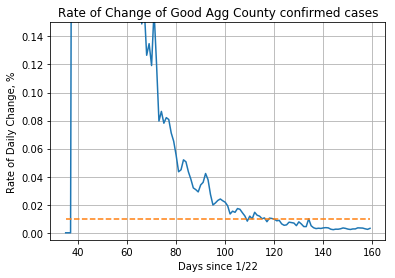

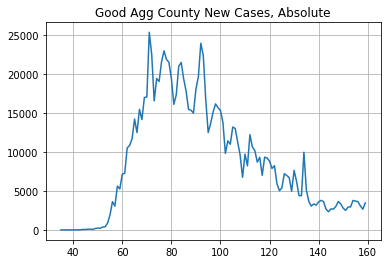

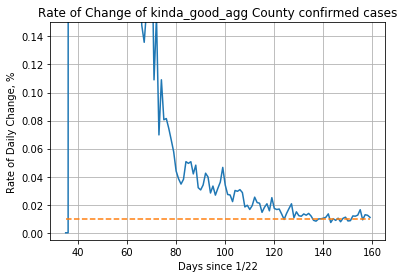

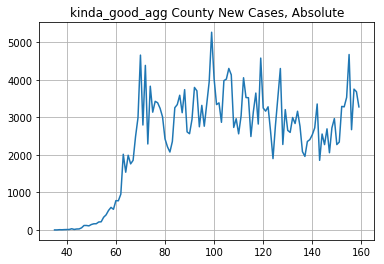

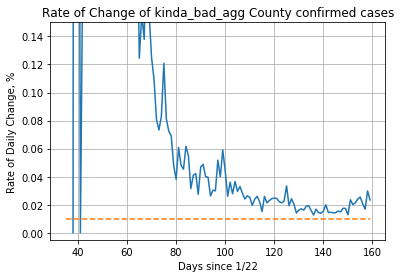

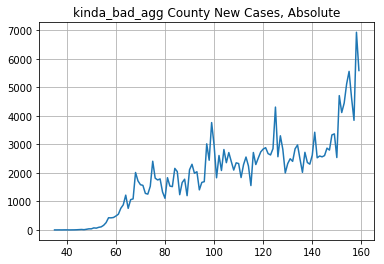

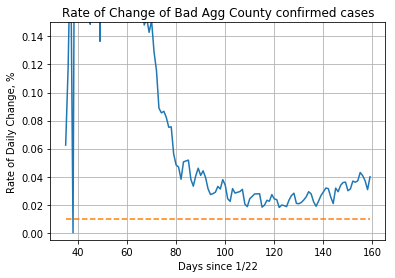

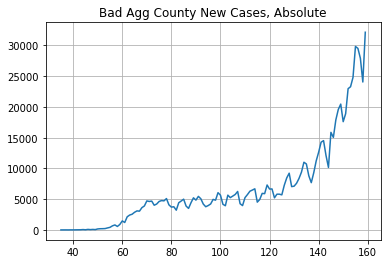

(         Bad_agg    change
 1/22/20        0       NaN
 1/23/20        0       NaN
 1/24/20        0       NaN
 1/25/20        0       inf
 1/26/20        3  0.333333
 ...          ...       ...
 6/26/20   724193  0.040749
 6/27/20   753703  0.037036
 6/28/20   781617  0.030768
 6/29/20   805666  0.039892
 6/30/20   837806  0.000000
 
 [161 rows x 2 columns],
 array([    0,     0,     0,     3,     1,     0,     1,     0,     0,
            0,     0,     2,     0,     0,     0,     0,     0,     0,
            0,     1,     0,     1,     0,     0,     0,     0,     1,
            0,     0,     3,     0,     0,     1,     0,     2,     1,
            2,     4,     0,     9,     5,    14,    19,    23,    55,
           22,    84,    48,    79,    52,   159,   192,   201,   219,
          323,   420,   664,   808,   562,   887,  1465,  1206,  2132,
         2416,  2549,  2867,  3092,  3050,  3621,  3896,  4713,  4627,
         4683,  4014,  4206,  4625,  4771,  4725,  5100,  4077,  3707

In [163]:
print(good_states)
print(kinda_good_states)
print(neutral_states)
print(kinda_bad_states)
print(bad_states)



y = aggregate_region(good_states)
new_col = [x[1].sum() for x in y.iterrows()]
df['Good_agg'] = new_col
create_roc_and_new_case_numbers(df['Good_agg'], 'Good Agg')

y = aggregate_region(kinda_good_states)
new_col = [x[1].sum() for x in y.iterrows()]
df['kinda_good_agg'] = new_col
create_roc_and_new_case_numbers(df['kinda_good_agg'], 'kinda_good_agg')

y = aggregate_region(kinda_bad_states)
new_col = [x[1].sum() for x in y.iterrows()]
df['kinda_bad_agg'] = new_col
create_roc_and_new_case_numbers(df['kinda_bad_agg'], 'kinda_bad_agg')

y = aggregate_region(bad_states)
new_col = [x[1].sum() for x in y.iterrows()]
df['Bad_agg'] = new_col
create_roc_and_new_case_numbers(df['Bad_agg'], 'Bad Agg')

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


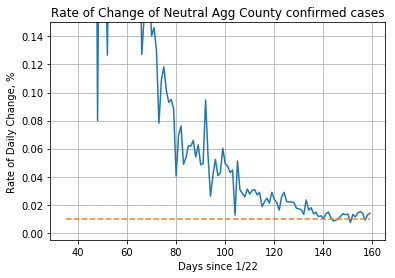

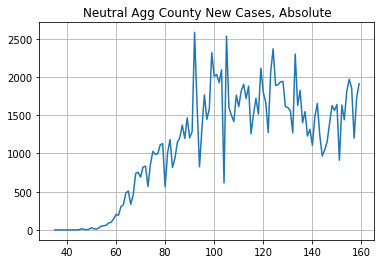

(         Neutral_agg    change
 1/22/20            0       NaN
 1/23/20            0       NaN
 1/24/20            0       NaN
 1/25/20            0       NaN
 1/26/20            0       NaN
 ...              ...       ...
 6/26/20       132118  0.014025
 6/27/20       133971  0.008957
 6/28/20       135171  0.012702
 6/29/20       136888  0.013968
 6/30/20       138800  0.000000
 
 [161 rows x 2 columns],
 array([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    3,   15,    7,    2,    9,   29,   14,   10,   26,   52,
          53,   63,   91,   99,  143,  203,  192,  304,  330,  483,  509,
         335,  459,  738,  754,  691,  821,  834,  568,  853, 1028,  988,
         995, 1113, 1129,  564, 1007, 1182,  816,  937, 1146, 1210, 137

In [74]:
y = aggregate_region(neutral_states)
new_col = [x[1].sum() for x in y.iterrows()]
df['Neutral_agg'] = new_col
create_roc_and_new_case_numbers(df['Neutral_agg'], 'Neutral Agg')

4/3/20, the date that the CDC officially recommended wearing masks.


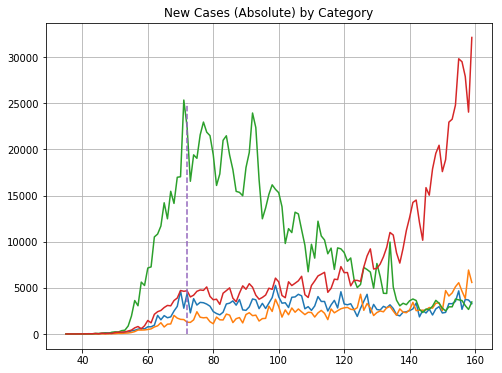

In [174]:
plt.figure(figsize=(8, 6))

create_new_case_graphs(df['kinda_good_agg'], 'Kinda Good Agg')
create_new_case_graphs(df['kinda_bad_agg'], 'Kinda Bad Agg')

create_new_case_graphs(df['Good_agg'], 'Good Agg')
create_new_case_graphs(df['Bad_agg'], 'Bad Agg')

plt.grid()
plt.plot([72, 72], [0, 25000], linestyle="dashed")
# create_new_case_graphs(df['Neutral_agg'], 'Neutral Agg')
plt.title("New Cases (Absolute) by Category")
print(df.index[72], ", the date that the CDC officially recommended wearing masks.", sep="")

Good: ['CO', 'IL', 'MI', 'CT', 'DC', 'DE', 'MA', 'NJ', 'NY', 'PA', 'RI', 'VT']
Kinda Good: ['WA', 'SD', 'NE', 'KS', 'IN', 'OH', 'LA', 'MD', 'NH']
Kinda Bad: ['NM', 'OR', 'ID', 'MT', 'MN', 'WI', 'MS', 'GA', 'TN']
Bad: ['AZ', 'TX', 'OK', 'CA', 'UT', 'WY', 'NV', 'FL', 'AR', 'AL', 'SC', 'NC']


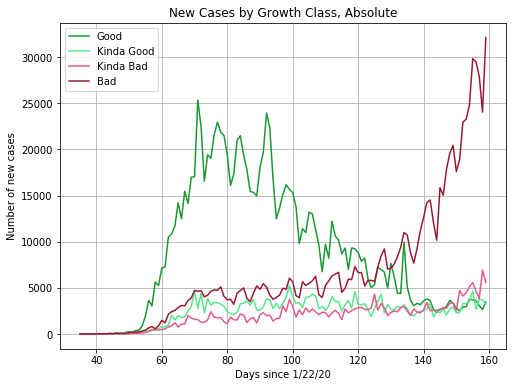

In [198]:
plt.figure(figsize=(8, 6))

create_new_case_graphs_colored(df['Good_agg'], 'Good', (0.1, 0.6, 0.2), smoothing_factor=1)
create_new_case_graphs_colored(df['kinda_good_agg'], 'Kinda Good', (0.35, 0.9, 0.55), smoothing_factor=1)
create_new_case_graphs_colored(df['kinda_bad_agg'], 'Kinda Bad', (0.9, 0.35, 0.55), smoothing_factor=1)
create_new_case_graphs_colored(df['Bad_agg'], 'Bad', (0.6, 0.1, 0.2), smoothing_factor=1)

plt.grid()
plt.legend(loc=2)
plt.title("New Cases by Growth Class, Absolute")
plt.ylabel("Number of new cases")
plt.xlabel("Days since 1/22/20")

classes = [good_states, kinda_good_states, kinda_bad_states, bad_states]
labels = ['Good', 'Kinda Good', 'Kinda Bad', 'Bad']
class_dict = dict(zip(labels, classes))
for key in class_dict.keys():
    print(key, class_dict[key], sep=": ")
    
plt.show()

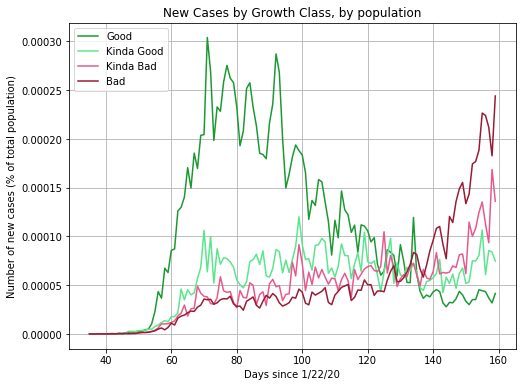

In [187]:
plt.figure(figsize=(8, 6))

# y = aggregate_region(good_states, "Good Aggregate")
# new_col = [x[1].sum() for x in y.iterrows()]
# df['bad_loose'] = new_col
create_new_case_graphs_colored(df['Good_agg'] / state_pops.loc[good_states].sum(), 'Good', (0.1, 0.6, 0.2), smoothing_factor=1)
create_new_case_graphs_colored(df['kinda_good_agg'] / state_pops.loc[kinda_good_states].sum(), 'Kinda Good', (0.35, 0.9, 0.55), smoothing_factor=1)
create_new_case_graphs_colored(df['kinda_bad_agg'] / state_pops.loc[kinda_bad_states].sum(), 'Kinda Bad', (0.9, 0.35, 0.55), smoothing_factor=1)
create_new_case_graphs_colored(df['Bad_agg'] / state_pops.loc[bad_states].sum(), 'Bad', (0.6, 0.1, 0.2), smoothing_factor=1)

plt.grid()
plt.legend(loc=2)
plt.title("New Cases by Growth Class, by population")
plt.ylabel("Number of new cases (% of total population)")
plt.xlabel("Days since 1/22/20")
plt.show()

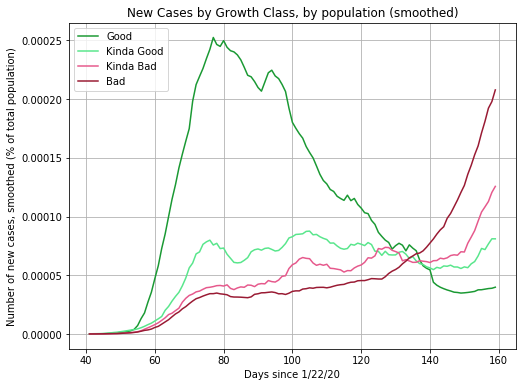

In [192]:
plt.figure(figsize=(8, 6))

# y = aggregate_region(good_states, "Good Aggregate")
# new_col = [x[1].sum() for x in y.iterrows()]
# df['bad_loose'] = new_col
create_new_case_graphs_colored(df['Good_agg'] / state_pops.loc[good_states].sum(), 'Good', (0.1, 0.6, 0.2), smoothing_factor=7)
create_new_case_graphs_colored(df['kinda_good_agg'] / state_pops.loc[kinda_good_states].sum(), 'Kinda Good', (0.35, 0.9, 0.55), smoothing_factor=7)
create_new_case_graphs_colored(df['kinda_bad_agg'] / state_pops.loc[kinda_bad_states].sum(), 'Kinda Bad', (0.9, 0.35, 0.55), smoothing_factor=7)
create_new_case_graphs_colored(df['Bad_agg'] / state_pops.loc[bad_states].sum(), 'Bad', (0.6, 0.1, 0.2), smoothing_factor=7)

plt.grid()
plt.legend(loc=2)
plt.title("New Cases by Growth Class, by population (smoothed)")
plt.ylabel("Number of new cases, smoothed (% of total population)")
plt.xlabel("Days since 1/22/20")
plt.show()

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


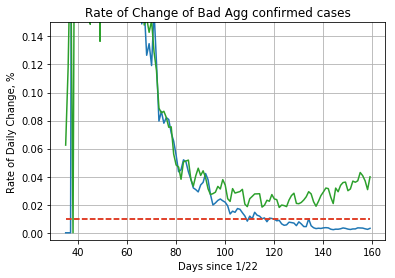

In [191]:
create_roc_graphs(df['Good_agg'], 'Good Agg')
create_roc_graphs(df['Bad_agg'], 'Bad Agg')
plt.grid()

# Plot US Regions

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


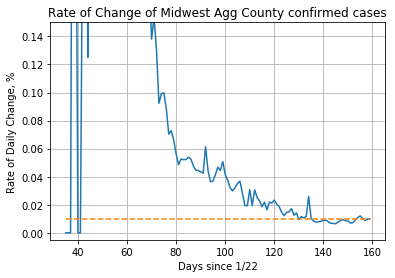

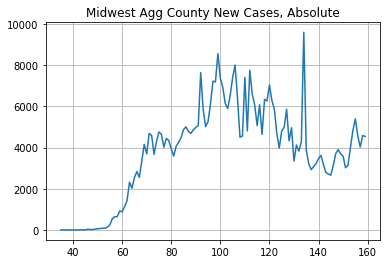

(         Midwest_agg    change
 1/22/20            0       NaN
 1/23/20            0       inf
 1/24/20            1  0.000000
 1/25/20            1  0.000000
 1/26/20            1  0.000000
 ...              ...       ...
 6/26/20       453060  0.010056
 6/27/20       457616  0.008793
 6/28/20       461640  0.009936
 6/29/20       466227  0.009733
 6/30/20       470765  0.000000
 
 [161 rows x 2 columns],
 array([   0,    1,    0,    0,    0,    0,    0,    0,    1,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    1,    1,    0,    0,    1,    3,
           1,    4,   28,   24,   14,   41,   59,   66,   85,   82,  134,
         249,  546,  641,  643,  920,  877, 1131, 1428, 2320, 2023, 2544,
        2833, 2551, 3353, 4154, 3694, 4682, 4588, 3669, 4305, 4758, 4641,
        4016, 4449, 4336, 3935, 3582, 4067, 4250, 4475, 4867, 5005, 477

In [77]:
y = aggregate_region(midwest)
new_col = [x[1].sum() for x in y.iterrows()]
df['Midwest_agg'] = new_col
create_roc_and_new_case_numbers(df['Midwest_agg'], 'Midwest Agg')

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


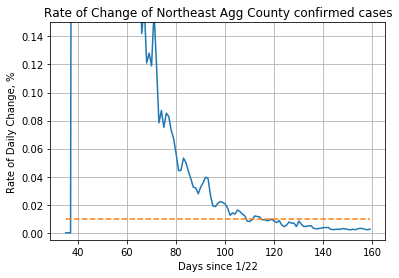

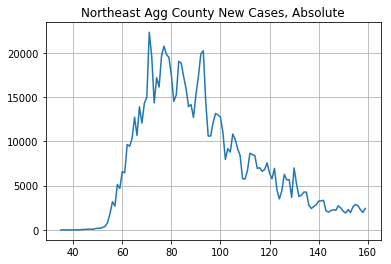

(         Northeast_agg    change
 1/22/20              0       NaN
 1/23/20              0       NaN
 1/24/20              0       NaN
 1/25/20              0       NaN
 1/26/20              0       NaN
 ...                ...       ...
 6/26/20         914250  0.002997
 6/27/20         916990  0.002487
 6/28/20         919271  0.002139
 6/29/20         921237  0.002628
 6/30/20         923658  0.000000
 
 [161 rows x 2 columns],
 array([    0,     0,     0,     0,     0,     0,     0,     0,     0,
            1,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     1,     3,     3,     9,    14,    11,    55,
           58,    79,    94,    53,   148,   184,   177,   285,   393,
          821,  1846,  3179,  2696,  5125,  4680,  6582,  6445,  9639,
         9441, 10348, 12726, 10664, 13895, 12059, 14307, 14986, 2230

In [78]:
y = aggregate_region(northeast)
new_col = [x[1].sum() for x in y.iterrows()]
df['Northeast_agg'] = new_col
create_roc_and_new_case_numbers(df['Northeast_agg'], 'Northeast Agg')

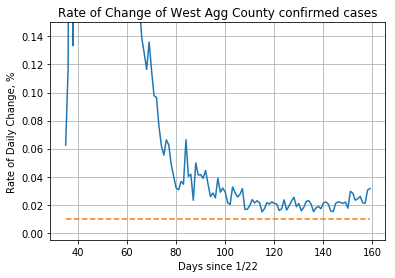

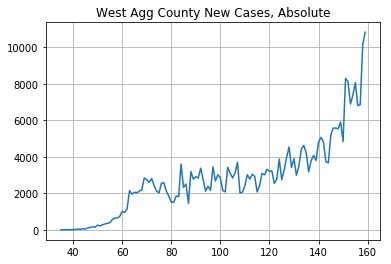

(         West_agg    change
 1/22/20         1  0.000000
 1/23/20         1  0.000000
 1/24/20         1  0.000000
 1/25/20         1  2.000000
 1/26/20         3  0.333333
 ...           ...       ...
 6/26/20    319291  0.021316
 6/27/20    326097  0.021058
 6/28/20    332964  0.030439
 6/29/20    343099  0.031554
 6/30/20    353925  0.000000
 
 [161 rows x 2 columns],
 array([    0,     0,     0,     2,     1,     0,     1,     0,     0,
            0,     0,     2,     0,     0,     0,     0,     0,     0,
            0,     1,     0,     1,     0,     0,     0,     0,     1,
            0,     0,     3,     0,     0,     1,     0,     2,     1,
            2,    11,     4,    17,    13,    26,    46,    29,    72,
           42,   111,   138,   167,   156,   261,   222,   285,   329,
          366,   398,   572,   649,   659,   740,  1016,   957,  1134,
         2158,  1961,  2065,  2032,  2131,  2188,  2852,  2755,  2598,
         2813,  2434,  2133,  2024,  2555,  2580,  2129, 

In [79]:
y = aggregate_region(west)
new_col = [x[1].sum() for x in y.iterrows()]
df['West_agg'] = new_col
create_roc_and_new_case_numbers(df['West_agg'], 'West Agg')

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


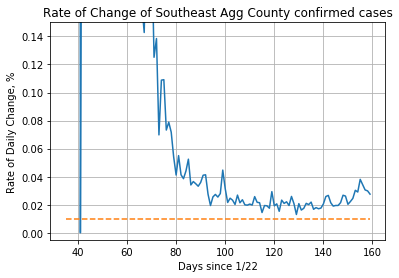

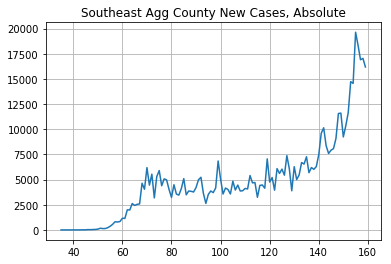

(         Southeast_agg    change
 1/22/20              0       NaN
 1/23/20              0       NaN
 1/24/20              0       NaN
 1/25/20              0       NaN
 1/26/20              0       NaN
 ...                ...       ...
 6/26/20         535048  0.034287
 6/27/20         553393  0.030542
 6/28/20         570295  0.029872
 6/29/20         587331  0.027553
 6/30/20         603514  0.000000
 
 [161 rows x 2 columns],
 array([    0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     1,     3,     0,     2,     4,     9,
            9,    32,    24,    41,    46,    77,   167,   131,   136,
          217,   361,   550,   810,   786,   833,  1162,  1140,  1996,
         1980,  2617,  2430,  2542,  2585,  4635,  4040,  6187,  444

In [80]:
y = aggregate_region(southeast)
new_col = [x[1].sum() for x in y.iterrows()]
df['Southeast_agg'] = new_col
create_roc_and_new_case_numbers(df['Southeast_agg'], 'Southeast Agg')

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


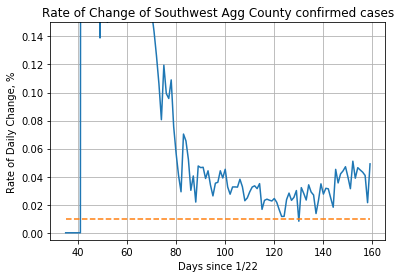

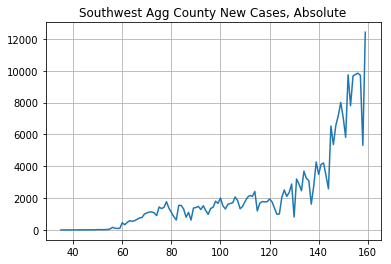

(         Southwest_agg    change
 1/22/20              0       NaN
 1/23/20              0       NaN
 1/24/20              0       NaN
 1/25/20              0       inf
 1/26/20              1  0.000000
 ...                ...       ...
 6/26/20         227821  0.043218
 6/27/20         237667  0.040864
 6/28/20         247379  0.021473
 6/29/20         252691  0.049131
 6/30/20         265106  0.000000
 
 [161 rows x 2 columns],
 array([    0,     0,     0,     1,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     3,     2,     7,
            3,     8,     5,     7,     5,    20,    19,    12,    17,
           27,    55,   161,   107,    92,    98,   450,   322,   467,
          575,   543,   577,   662,   755,   774,   990,  1066,  112

In [81]:
y = aggregate_region(southwest)
new_col = [x[1].sum() for x in y.iterrows()]
df['Southwest_agg'] = new_col
create_roc_and_new_case_numbers(df['Southwest_agg'], 'Southwest Agg')

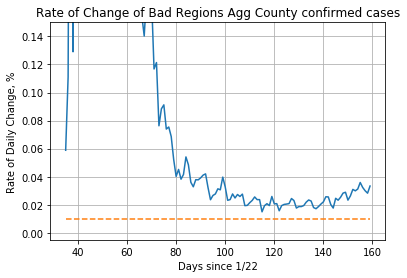

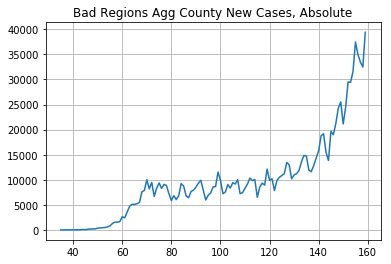

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


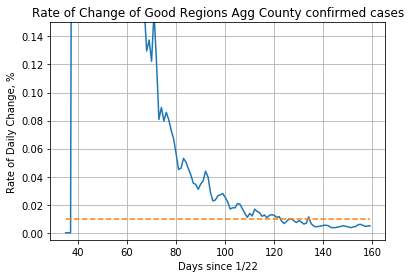

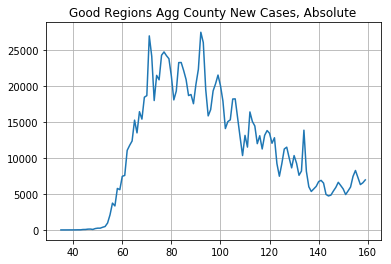

(         Good_regions_agg    change
 1/22/20                 0       NaN
 1/23/20                 0       inf
 1/24/20                 1  0.000000
 1/25/20                 1  0.000000
 1/26/20                 1  0.000000
 ...                   ...       ...
 6/26/20           1367310  0.005336
 6/27/20           1374606  0.004587
 6/28/20           1380911  0.004745
 6/29/20           1387464  0.005016
 6/30/20           1394423  0.000000
 
 [161 rows x 2 columns],
 array([    0,     1,     0,     0,     0,     0,     0,     0,     1,
            1,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     2,     4,     3,     9,    15,    14,    56,
           62,   107,   118,    67,   189,   243,   243,   370,   475,
          955,  2095,  3725,  3337,  5768,  5600,  7459,  7576, 11067,
        11761, 12371, 15270, 134

In [82]:
y = aggregate_region(southwest + southeast + west)
new_col = [x[1].sum() for x in y.iterrows()]
df['Bad_regions_agg'] = new_col
create_roc_and_new_case_numbers(df['Bad_regions_agg'], 'Bad Regions Agg')

y = aggregate_region(midwest + northeast)
new_col = [x[1].sum() for x in y.iterrows()]
df['Good_regions_agg'] = new_col
create_roc_and_new_case_numbers(df['Good_regions_agg'], 'Good Regions Agg')


## Classifying states based on growth since first 10% of cumulative cases

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


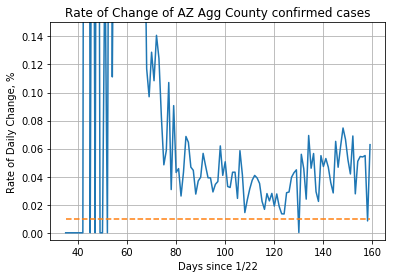

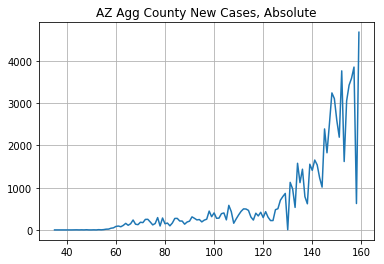

AZ is a mess


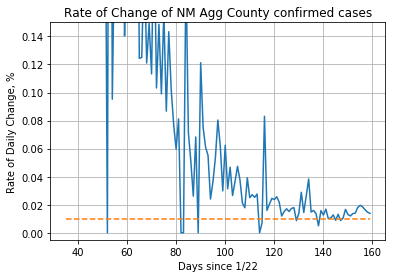

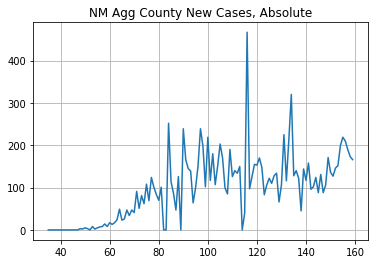

NM is neutral


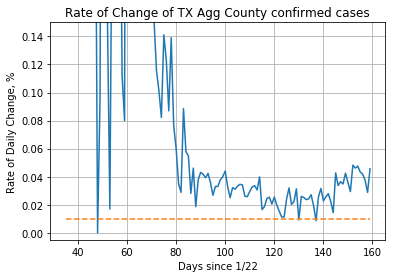

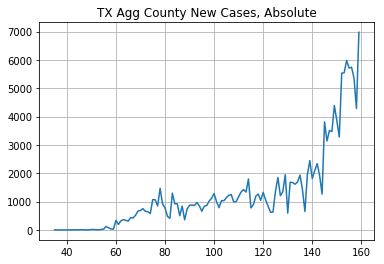

TX is a mess


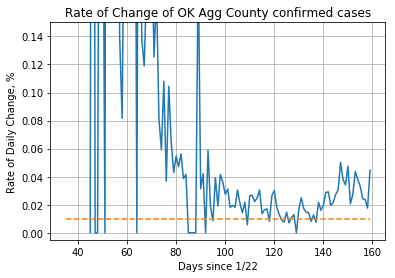

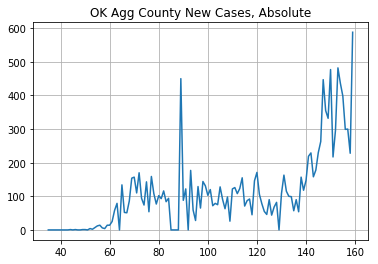

OK is a mess


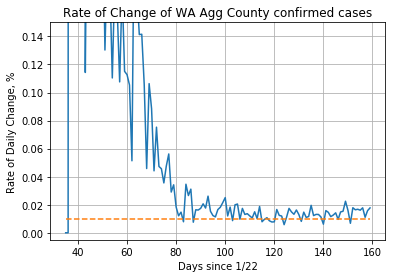

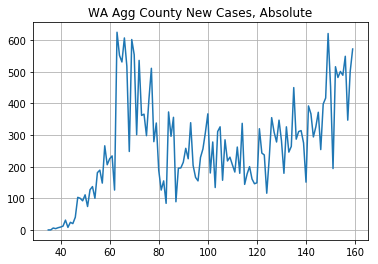

WA is neutral


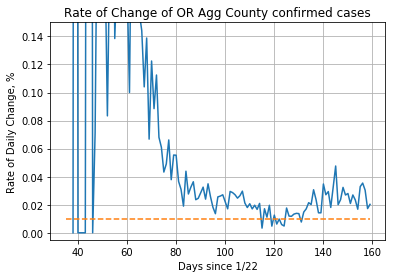

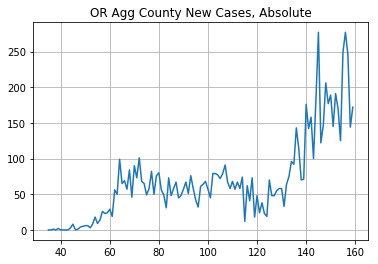

OR is a mess


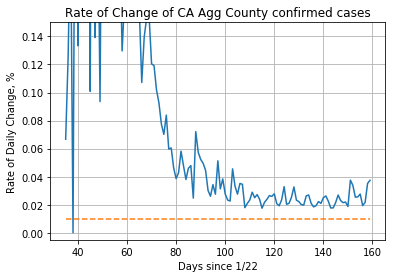

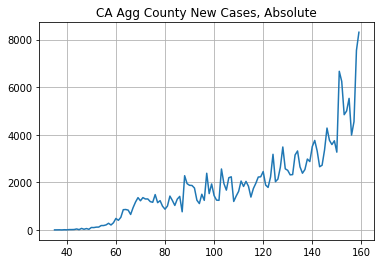

CA is a mess


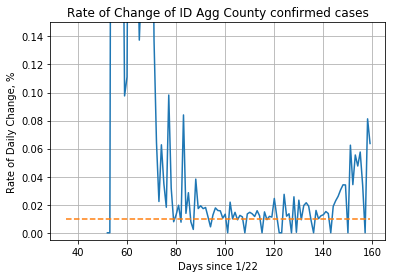

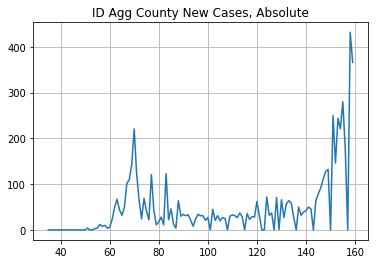

ID is a mess


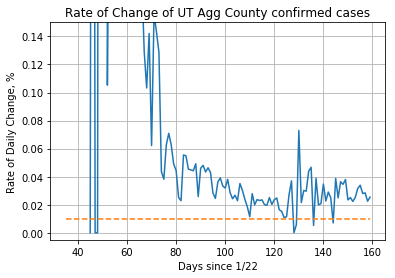

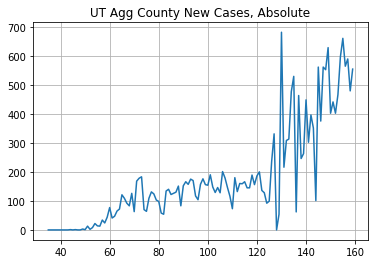

UT is a mess


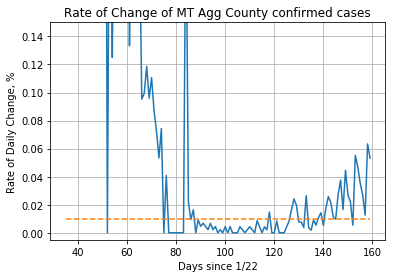

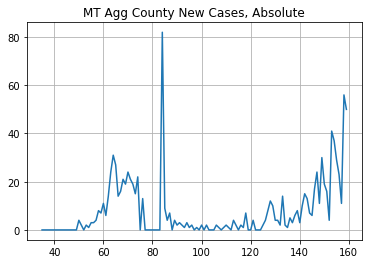

MT is a mess


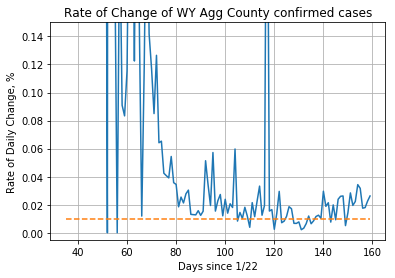

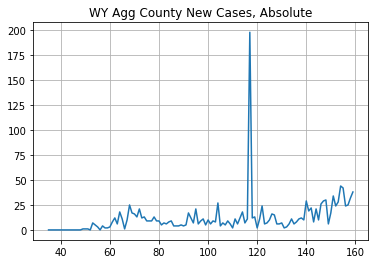

WY is a mess


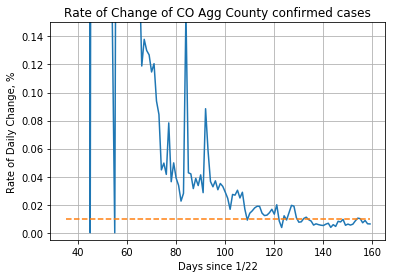

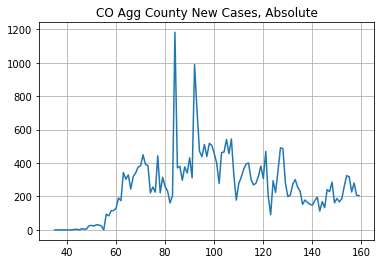

CO is a do-gooder


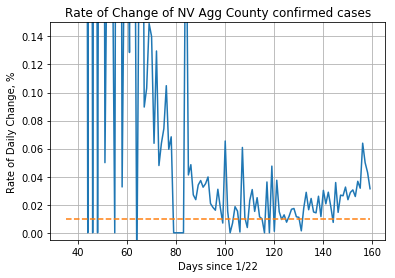

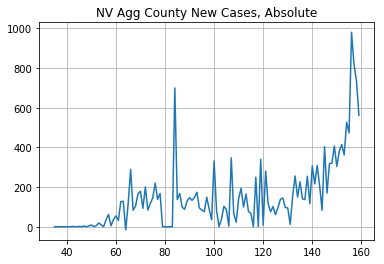

NV is a mess


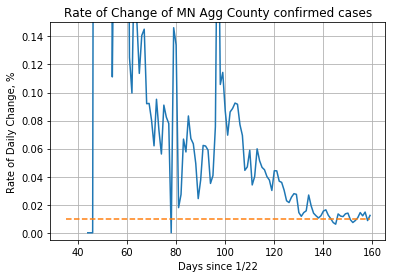

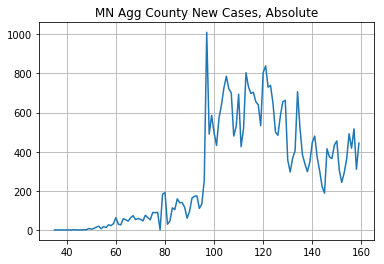

MN is a do-gooder


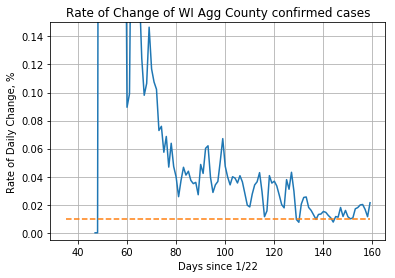

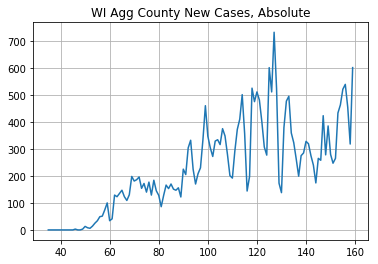

WI is a mess


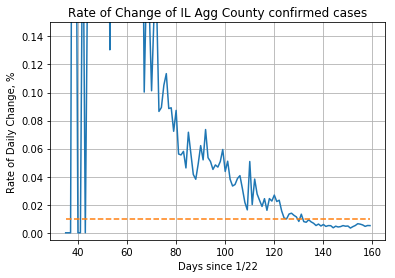

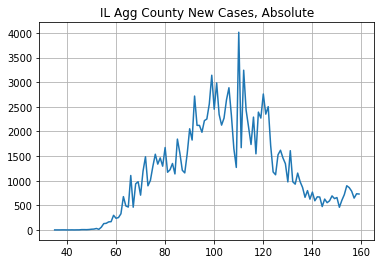

IL is a do-gooder


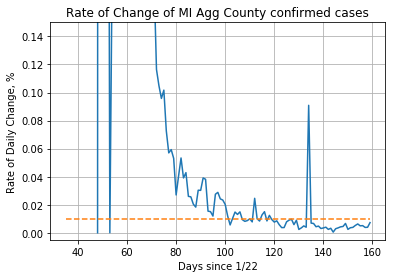

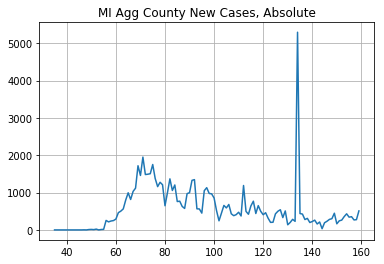

MI is a do-gooder


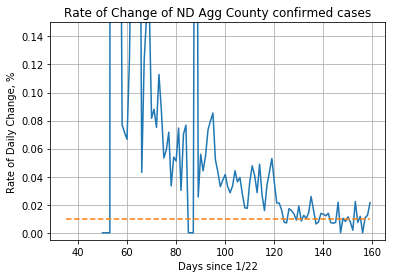

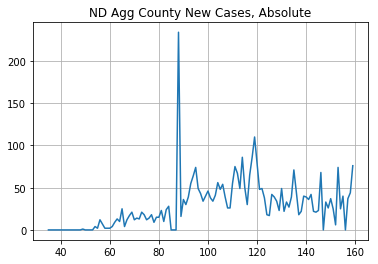

ND is a do-gooder


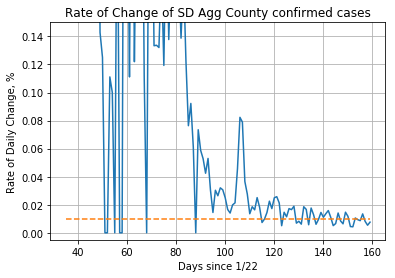

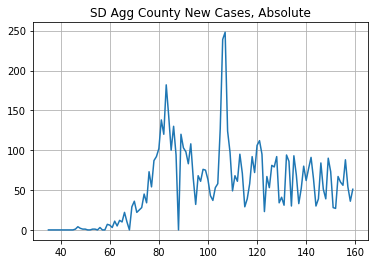

SD is a do-gooder


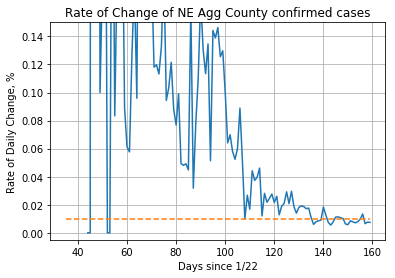

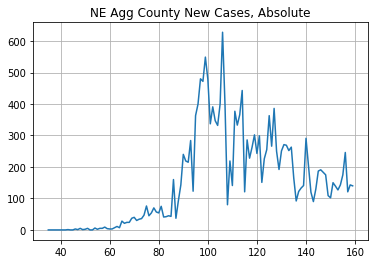

NE is a do-gooder


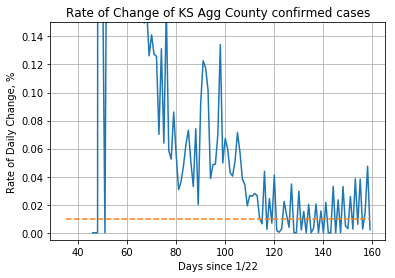

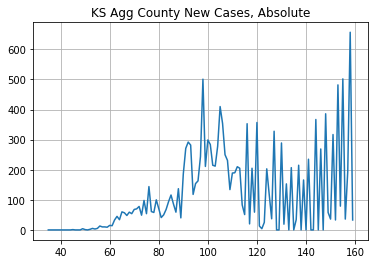

KS is a do-gooder


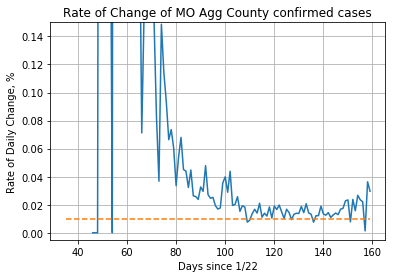

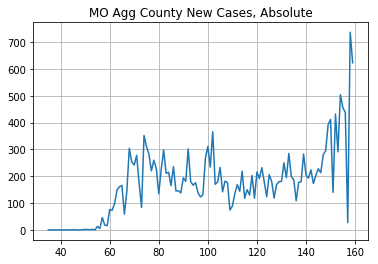

MO is a mess


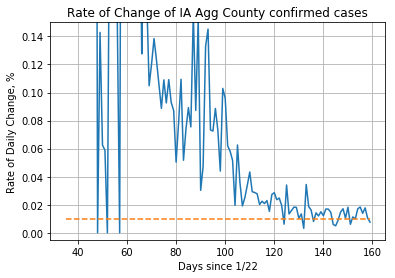

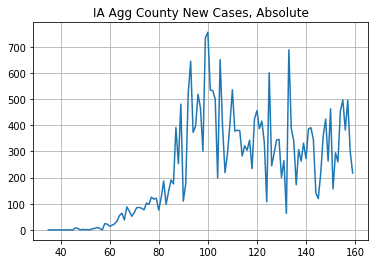

IA is a do-gooder


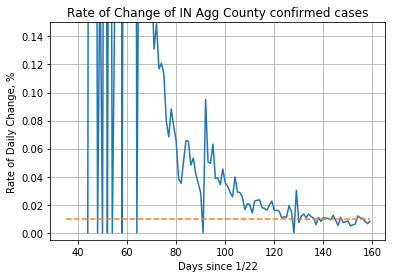

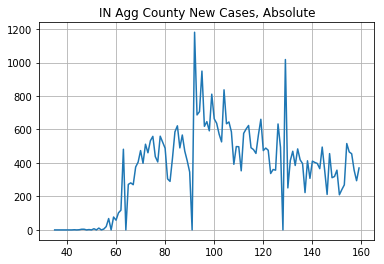

IN is a do-gooder


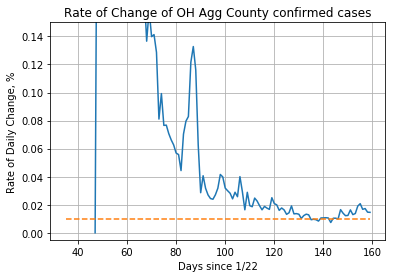

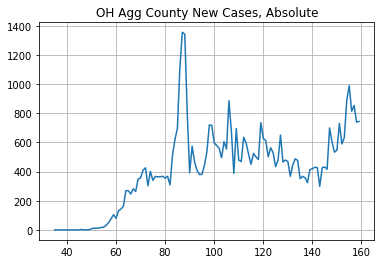

OH is neutral


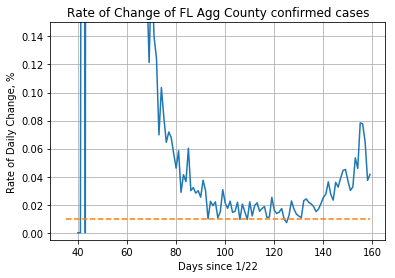

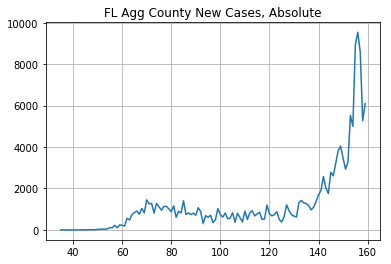

FL is a mess


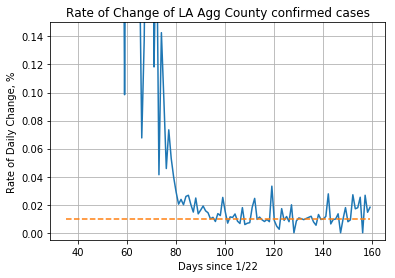

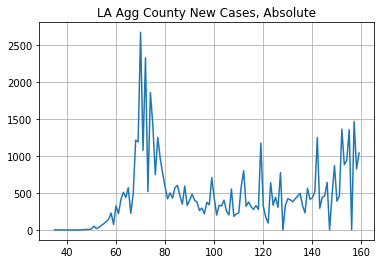

LA is a do-gooder


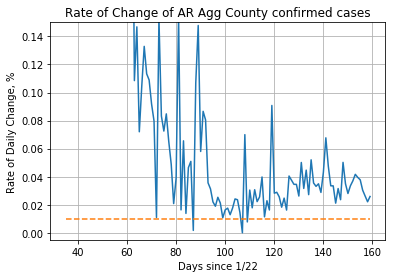

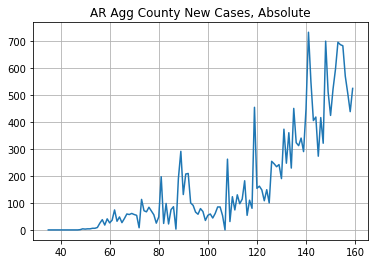

AR is a mess


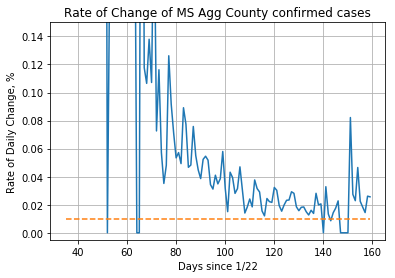

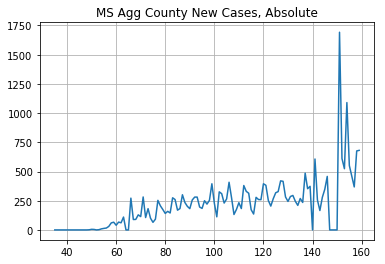

MS is a mess


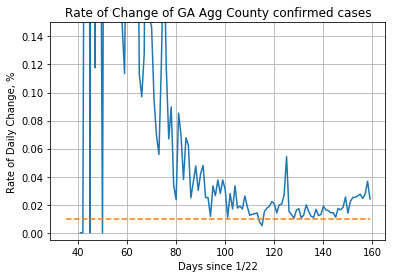

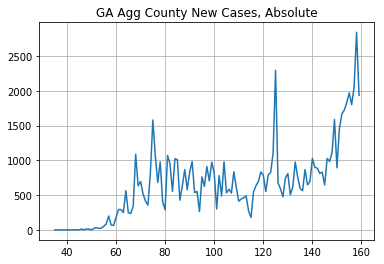

GA is a mess


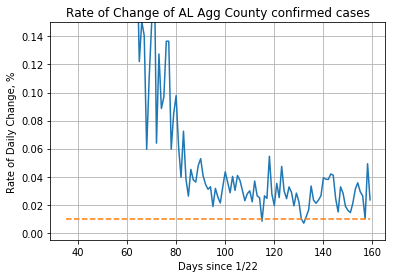

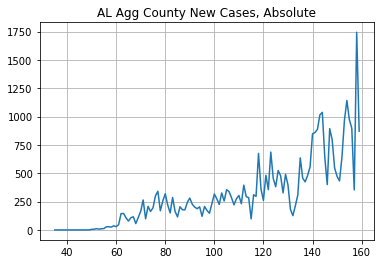

AL is a mess


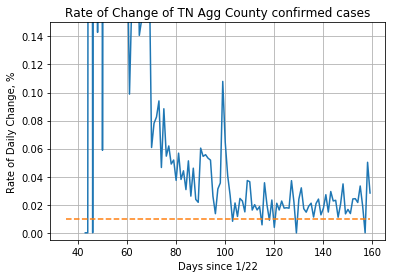

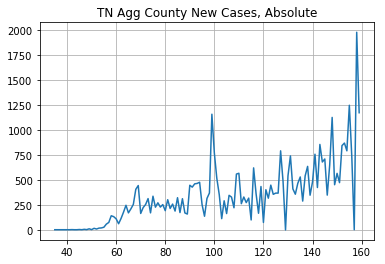

TN is a mess


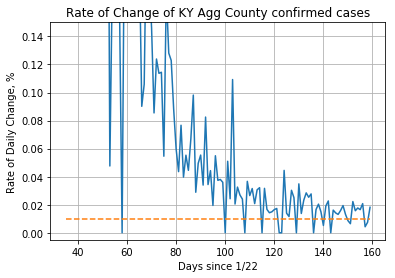

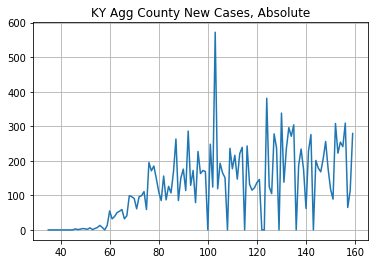

KY is neutral


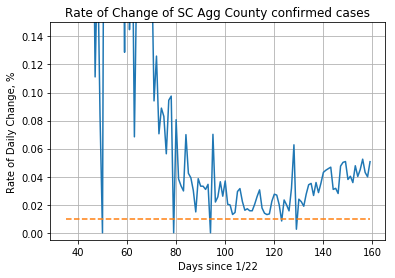

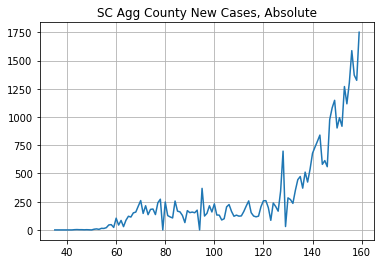

SC is a mess


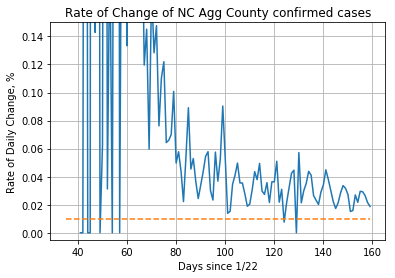

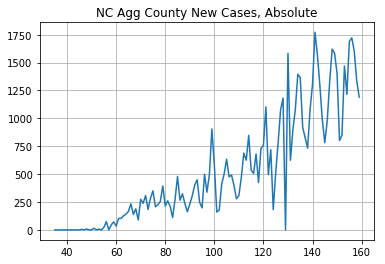

NC is a mess


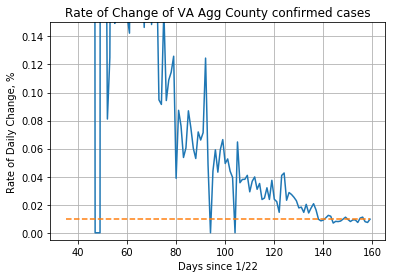

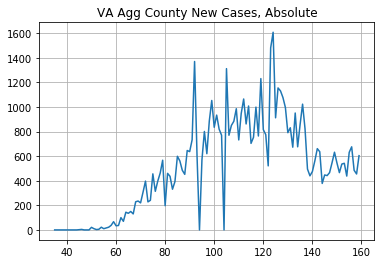

VA is neutral


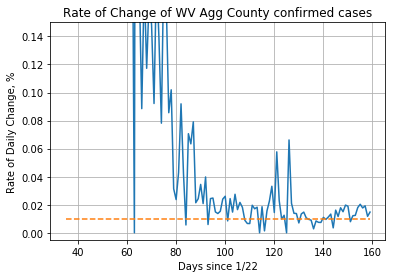

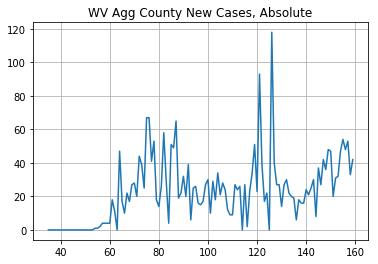

WV is a do-gooder


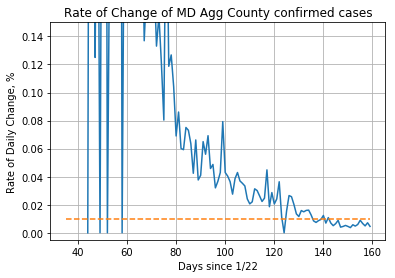

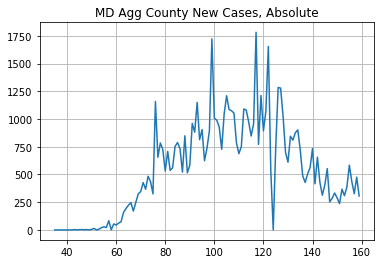

MD is a do-gooder


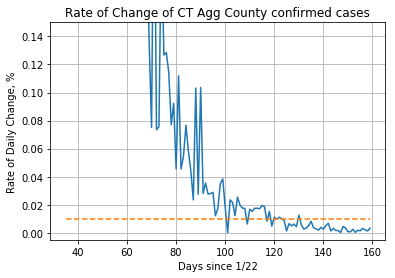

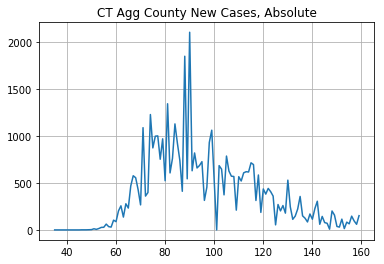

CT is a do-gooder


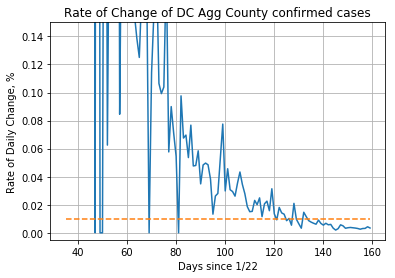

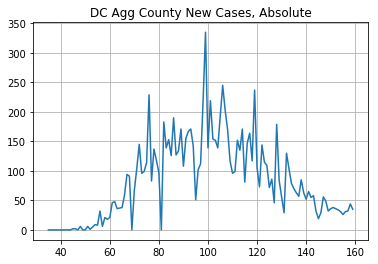

DC is a do-gooder


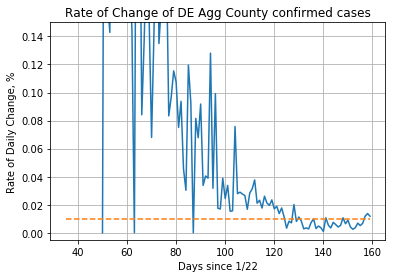

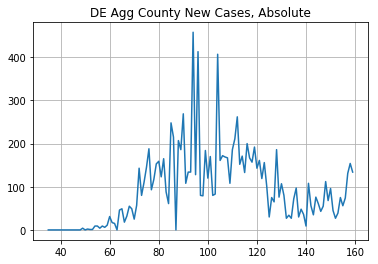

DE is a do-gooder


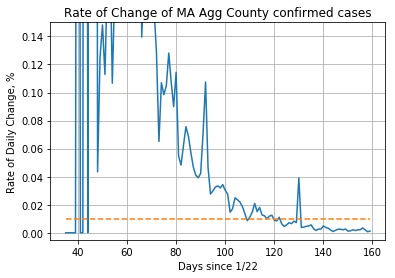

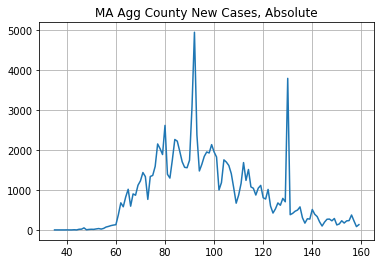

MA is a do-gooder


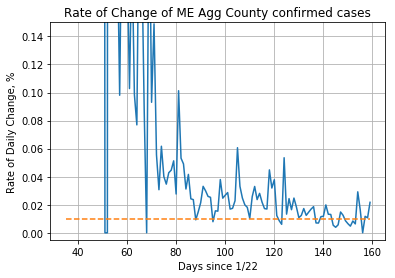

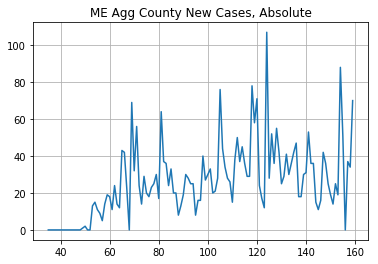

ME is a mess


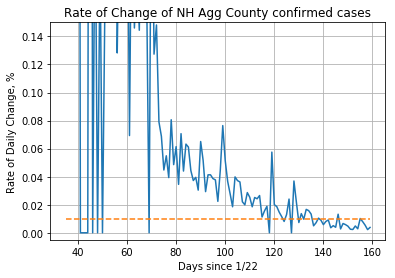

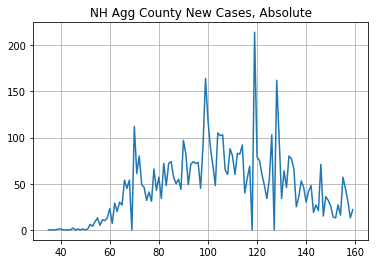

NH is a do-gooder


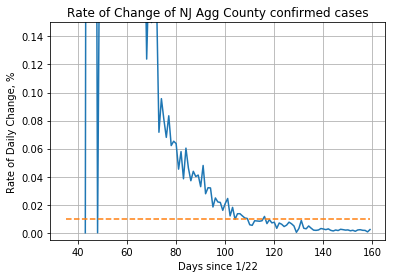

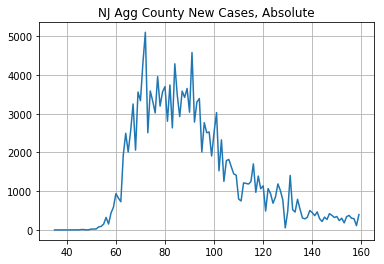

NJ is a do-gooder


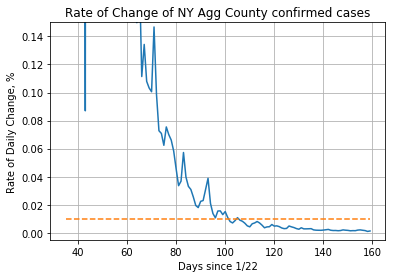

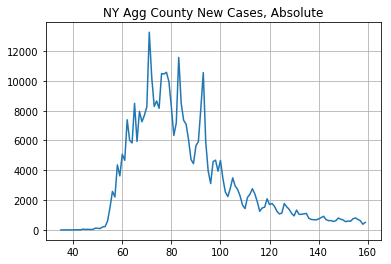

NY is a do-gooder


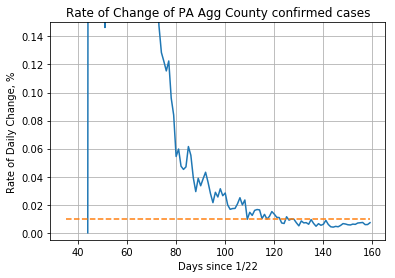

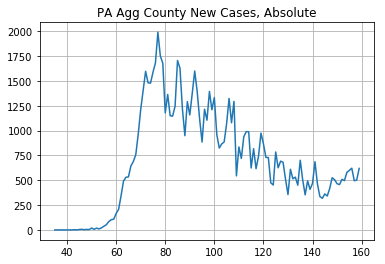

PA is a do-gooder


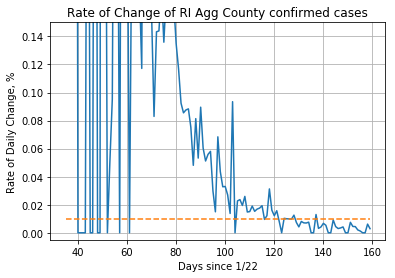

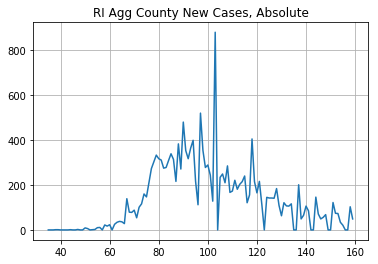

RI is a do-gooder


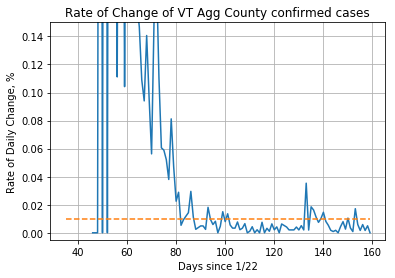

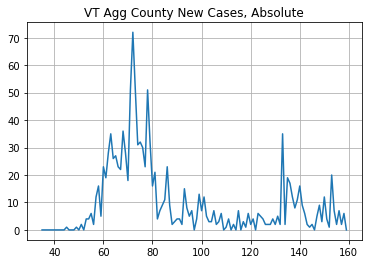

VT is a do-gooder


In [105]:
d1, d2 = create_classes(state_list)

In [102]:
d2

{'neg_diff': [46938,
  66210,
  4252,
  2318,
  72237,
  1950,
  8505,
  184,
  508,
  6103,
  4727,
  2156,
  73192,
  10683,
  4798,
  17809,
  13692,
  9859,
  20166,
  23126,
  346],
 'pos_diff': [7192,
  7428,
  42551,
  22649,
  650,
  1213,
  4989,
  2074,
  3244,
  6868,
  3715,
  -246,
  12533,
  23409,
  3444,
  3669,
  53486,
  902,
  99815,
  247931,
  29478,
  8187,
  531],
 'neg': [4.860667873005428,
  2.721081362100338,
  2.0579746205523763,
  1.8522058823529413,
  2.072640879055609,
  2.1149228130360207,
  2.4775886031966645,
  1.5364431486880465,
  2.2300242130750605,
  2.173653846153846,
  1.4491638160395286,
  1.2505811250581125,
  3.303663603172605,
  3.7273423538422263,
  1.487899125483018,
  1.6457683660889115,
  2.342221350847956,
  1.6958639186900057,
  4.2338037203335475,
  2.3266406608536028,
  1.2657450076804915],
 'pos': [1.6484537011991705,
  1.612871287128713,
  1.9947632963179427,
  2.1194088864725944,
  1.5,
  1.5029021558872304,
  1.8380648412565093,
  

In [84]:
all_ratios2 = d2['pos']
all_ratios2.extend(d2['neg'])
all_ratios2.extend(d2['neutral'])


c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


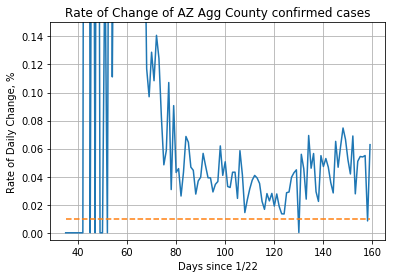

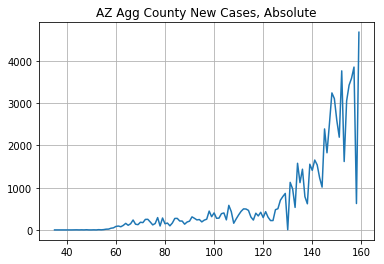

AZ is a mess


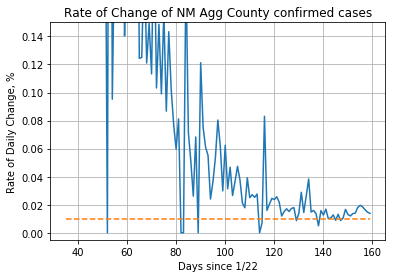

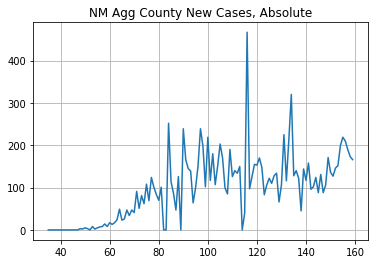

NM is neutral


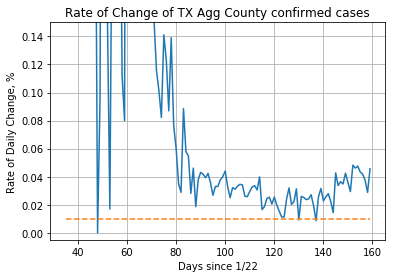

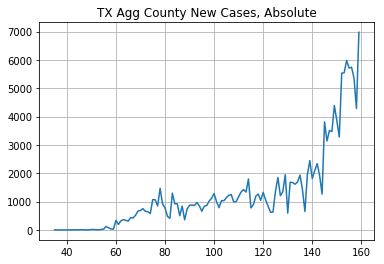

TX is a mess


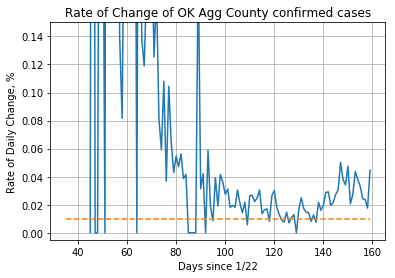

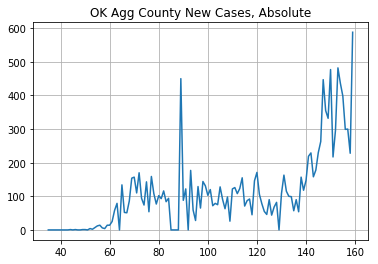

OK is a mess


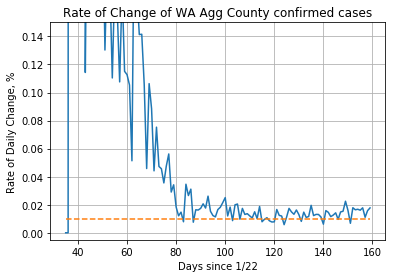

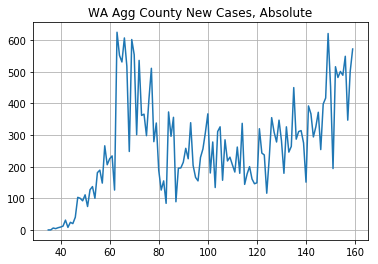

WA is neutral


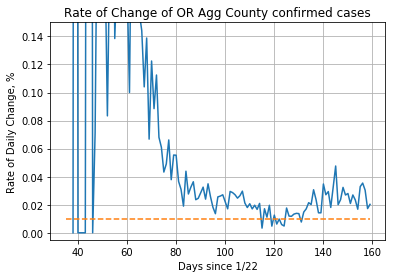

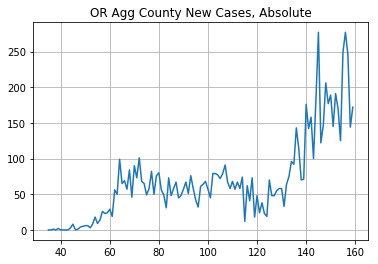

OR is kinda bad


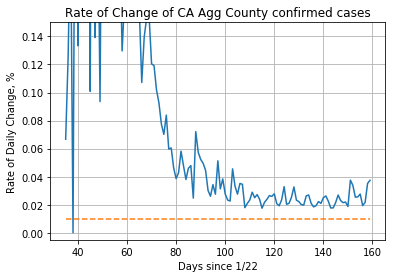

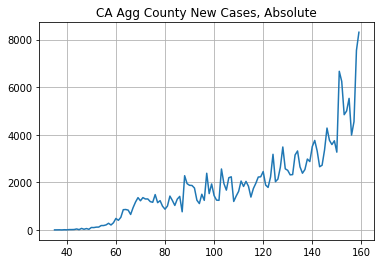

CA is a mess


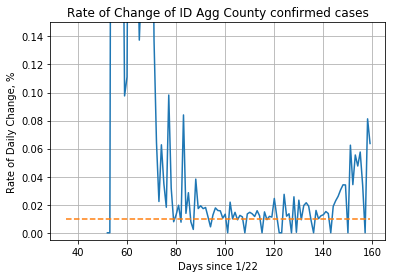

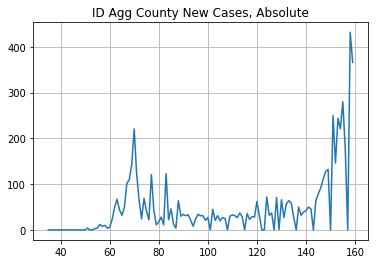

ID is a mess


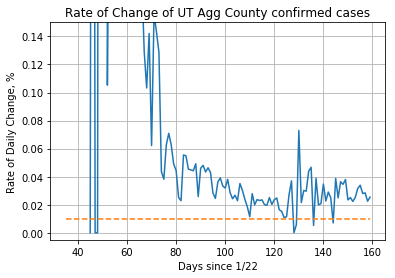

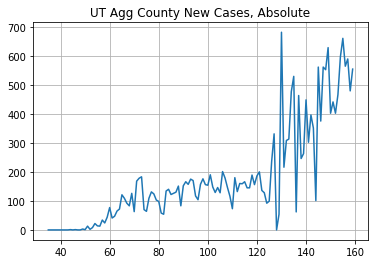

UT is a mess


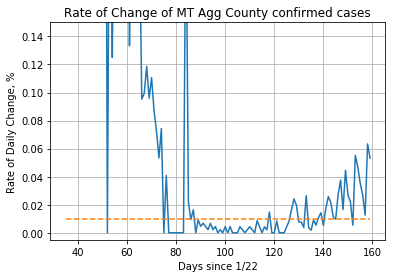

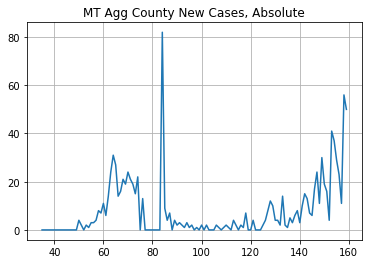

MT is kinda bad


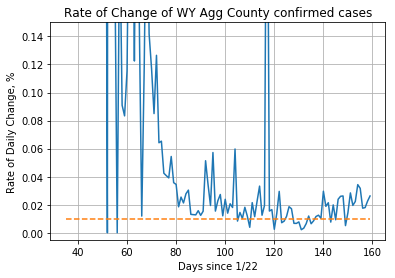

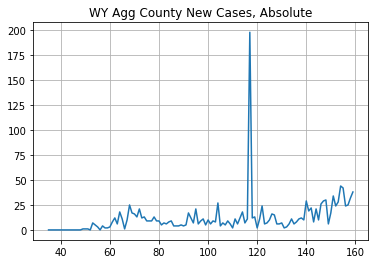

WY is a mess


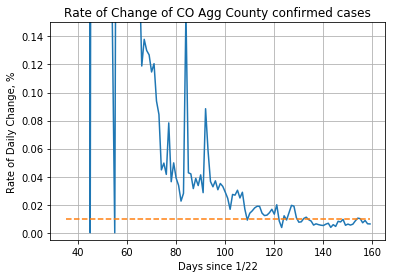

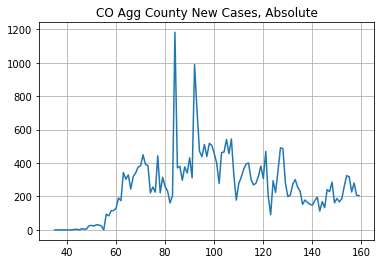

CO is kinda good


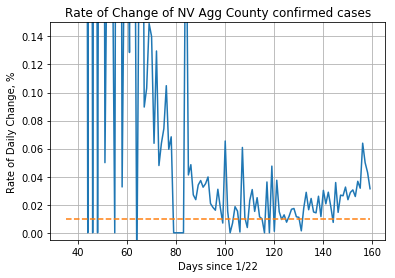

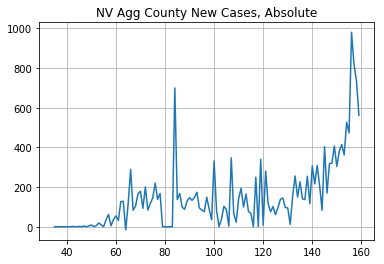

NV is a mess


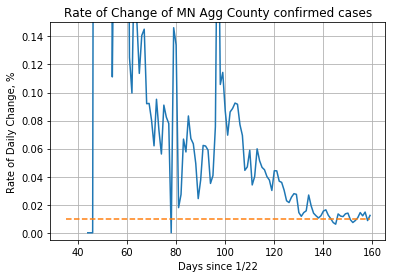

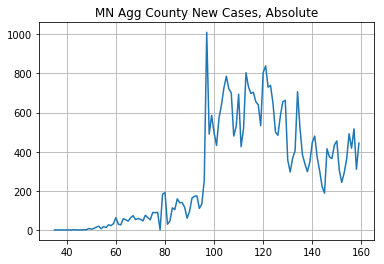

MN is kinda good


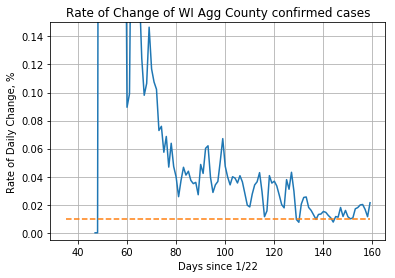

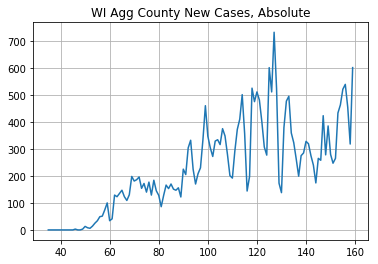

WI is kinda bad


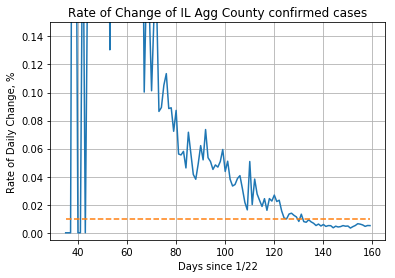

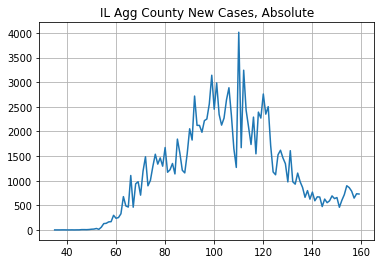

IL is a do-gooder


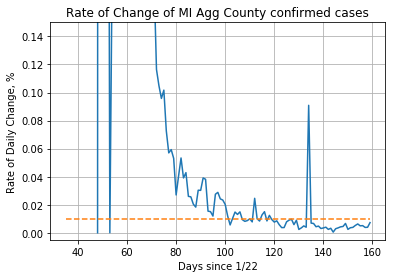

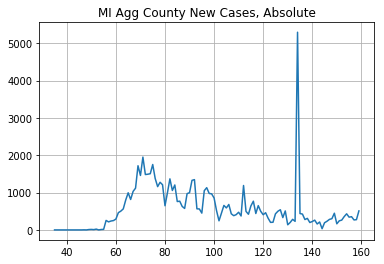

MI is a do-gooder


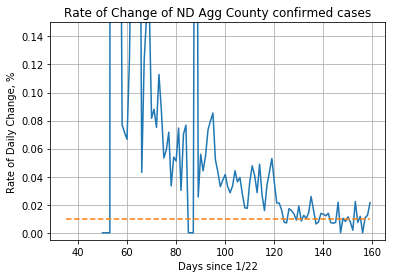

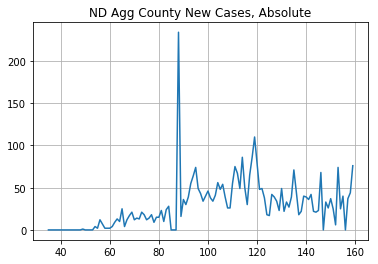

ND is kinda good


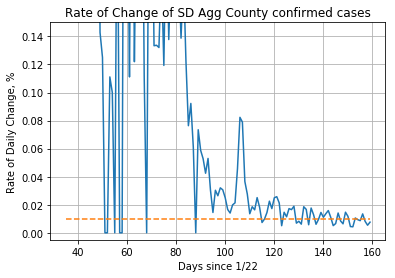

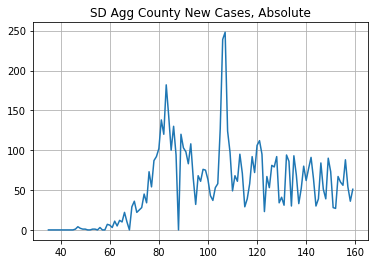

SD is kinda good


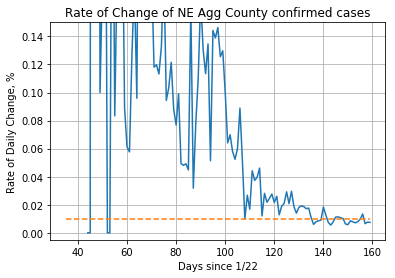

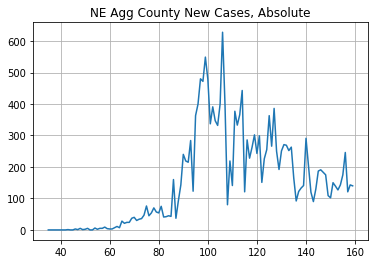

NE is kinda good


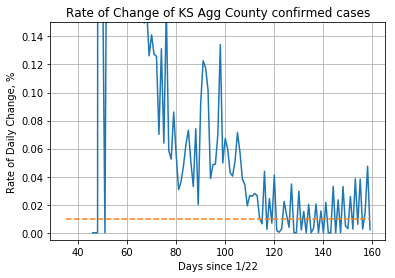

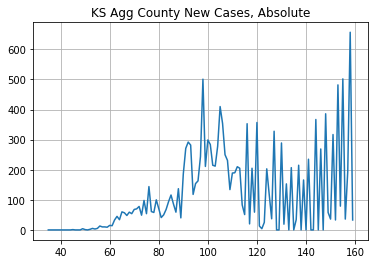

KS is kinda good


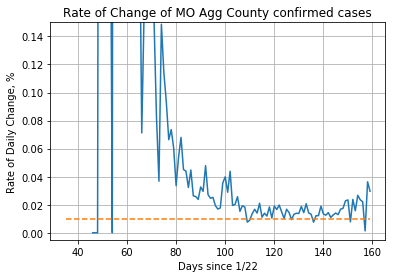

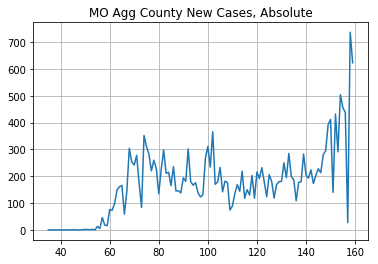

MO is kinda bad


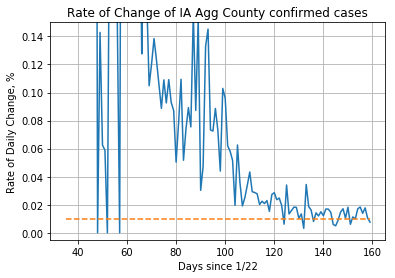

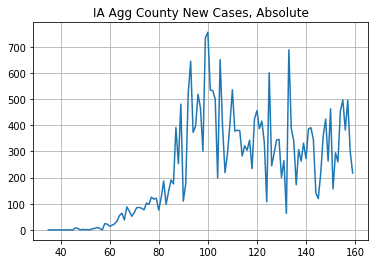

IA is kinda good


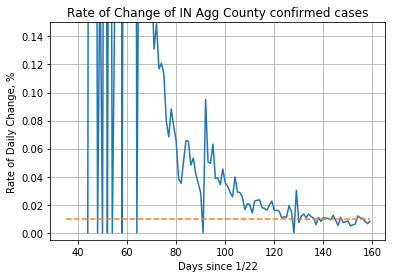

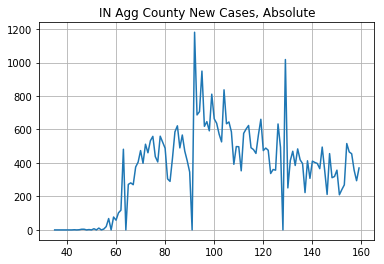

IN is kinda good


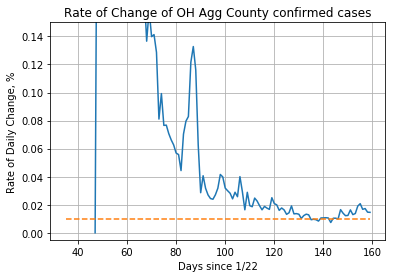

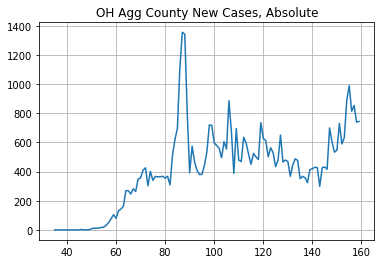

OH is neutral


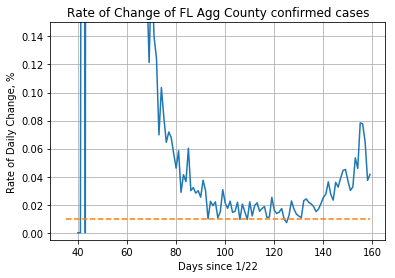

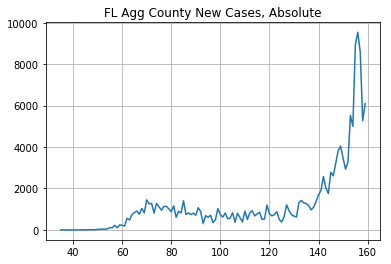

FL is a mess


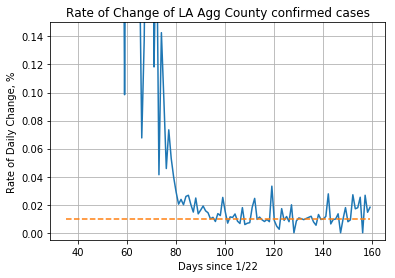

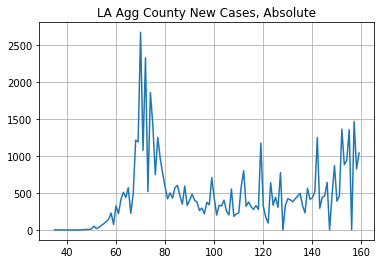

LA is kinda good


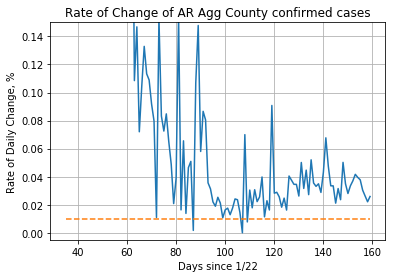

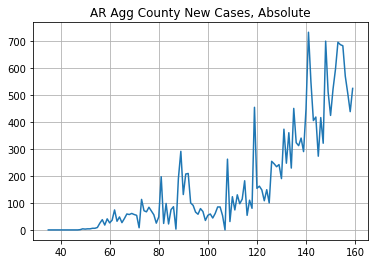

AR is a mess


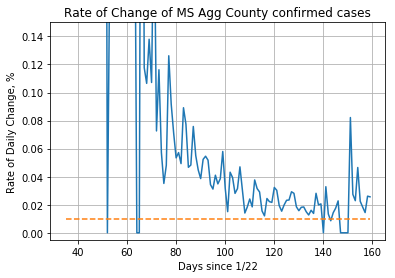

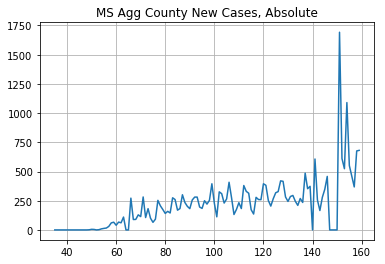

MS is kinda bad


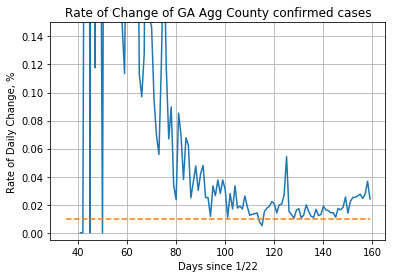

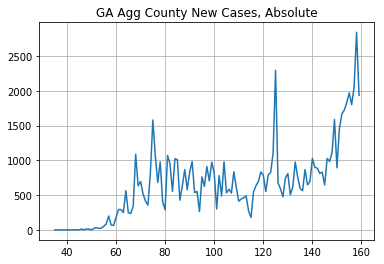

GA is kinda bad


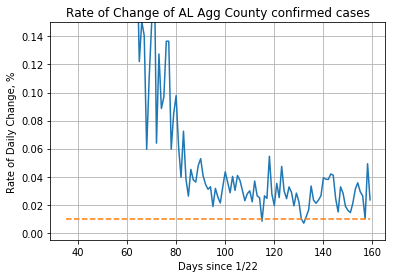

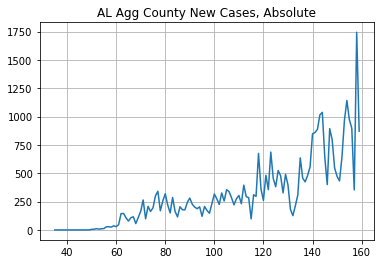

AL is a mess


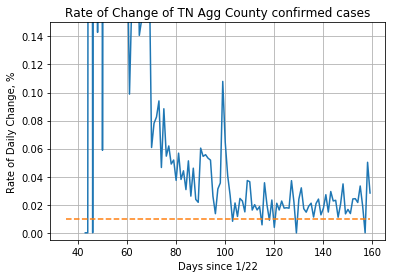

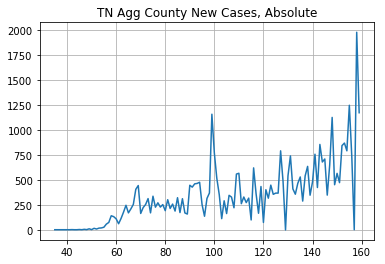

TN is kinda bad


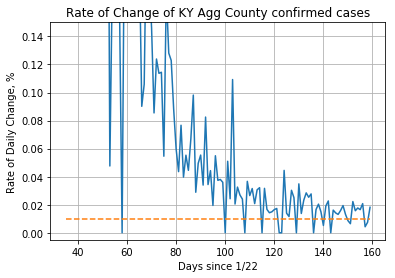

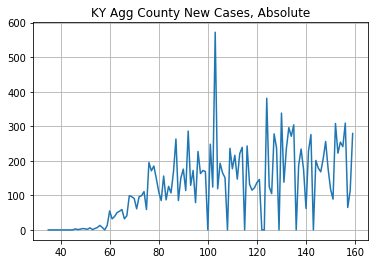

KY is neutral


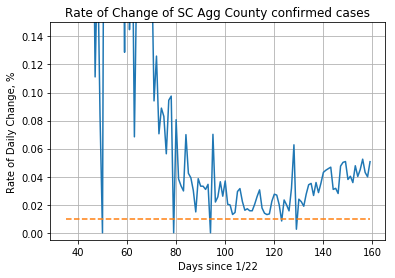

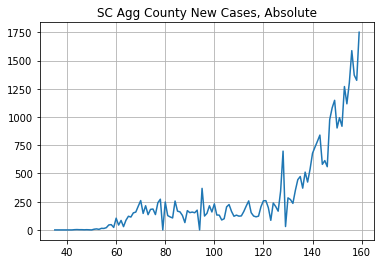

SC is a mess


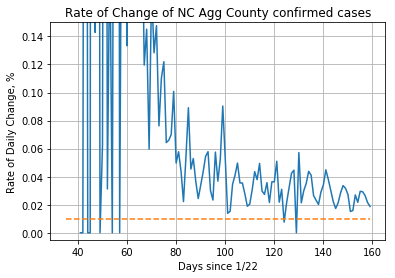

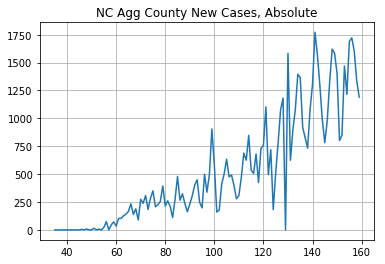

NC is a mess


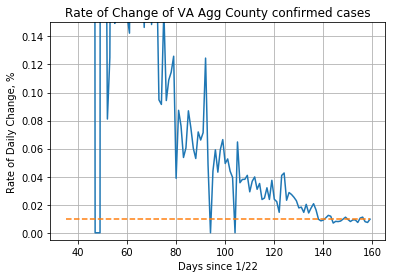

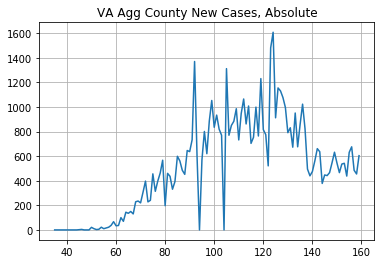

VA is neutral


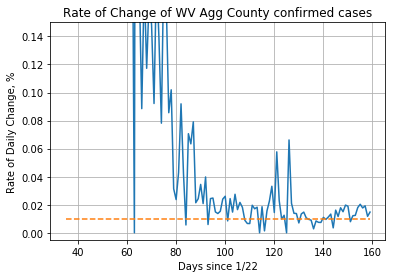

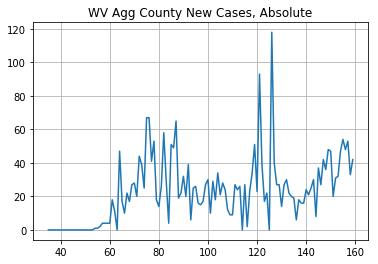

WV is kinda good


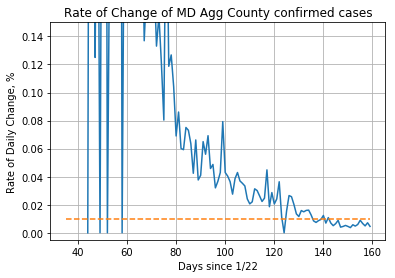

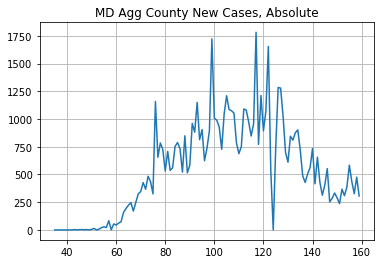

MD is kinda good


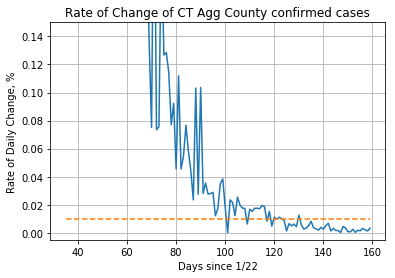

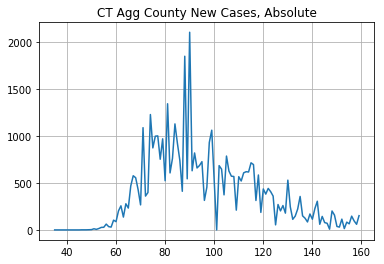

CT is a do-gooder


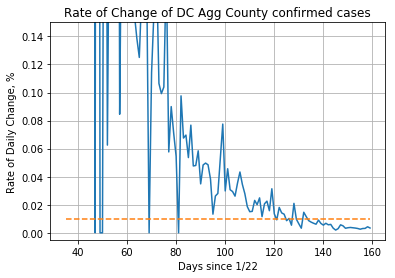

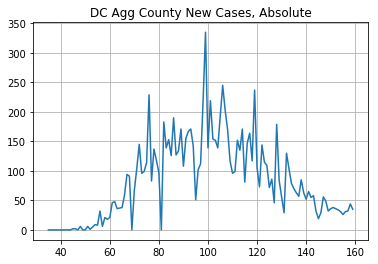

DC is a do-gooder


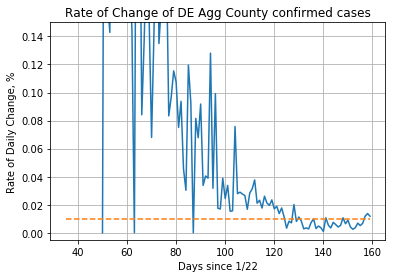

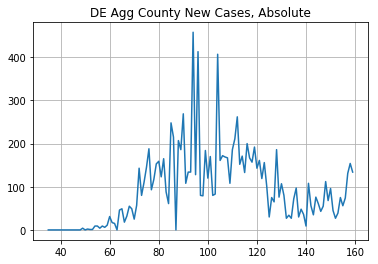

DE is a do-gooder


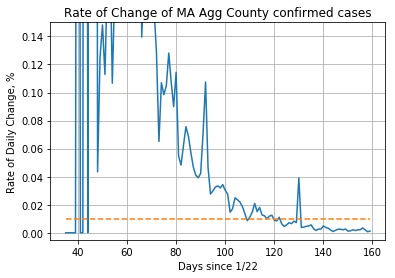

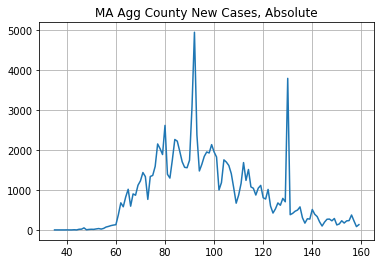

MA is a do-gooder


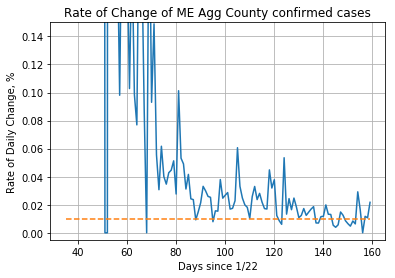

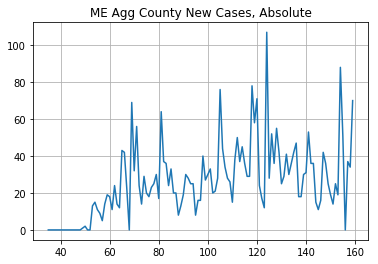

ME is kinda bad


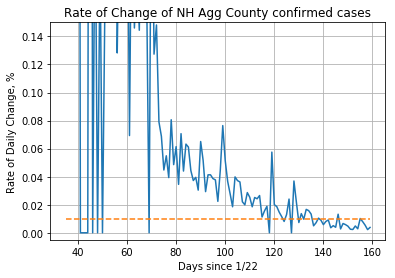

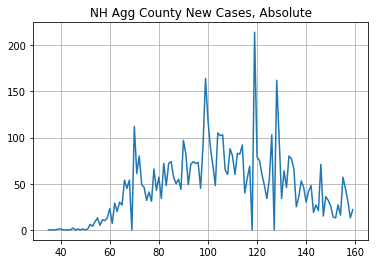

NH is kinda good


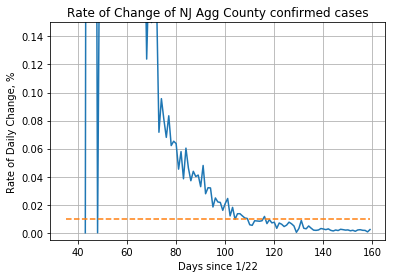

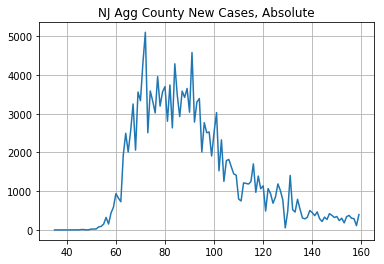

NJ is a do-gooder


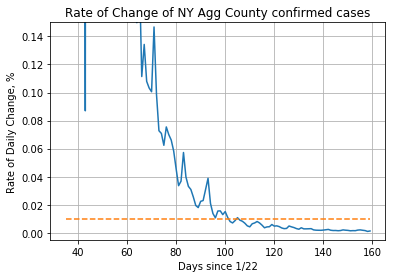

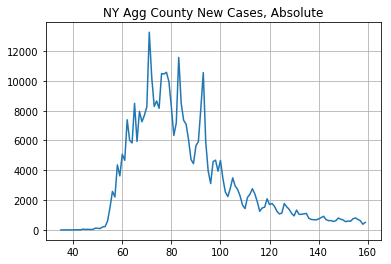

NY is a do-gooder


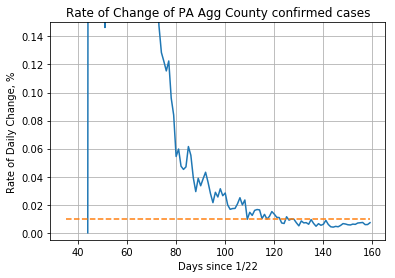

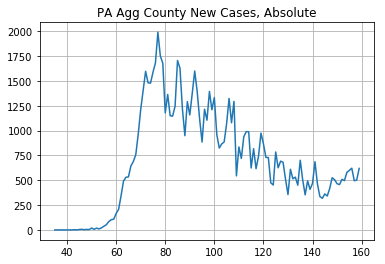

PA is a do-gooder


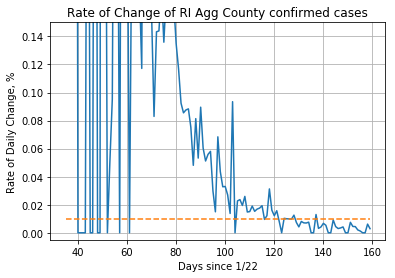

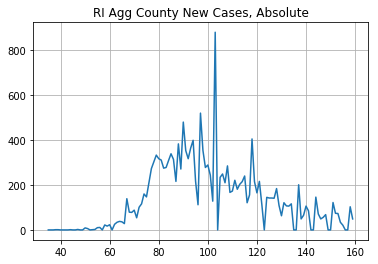

RI is a do-gooder


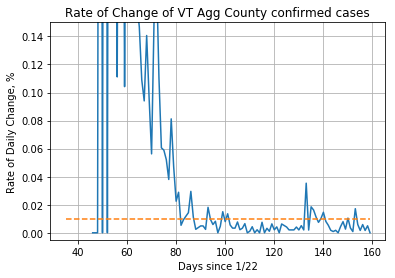

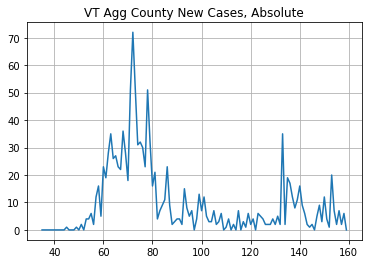

VT is a do-gooder


In [106]:


d1, d2 = create_classes2(state_list)

In [86]:
all_ratios2 = d2['pos']
all_ratios2.extend(d2['neg'])
all_ratios2.extend(d2['neutral'])

# states_dict = {'good': ['MN','IL',
#    'MI','NE','KS','CT','DC','DE','MA','NJ','NY','PA','RI','VT'],
#   'bad': ['AZ', 'TX', 'CA', 'UT', 'WY', 'FL', 'AR', 'AL', 'SC', 
#           'NC'],
#   'neutral': ['NM', 'WA', 'MO', 'KY', 'VA', 'WV'],
#   'k_good': ['ID', 'MT', 'CO', 'ND', 'SD', 'IA', 'IN', 'OH', 
#              'LA', 'MD', 'NH'],
#   'k_bad': ['OK', 'OR', 'NV', 'WI', 'MS', 'GA', 'TN', 'ME']}
states_dict = d1
d1, d2

({'good': ['IL', 'MI', 'CT', 'DC', 'DE', 'MA', 'NJ', 'NY', 'PA', 'RI', 'VT'],
  'bad': ['AZ',
   'TX',
   'OK',
   'CA',
   'ID',
   'UT',
   'WY',
   'NV',
   'FL',
   'AR',
   'AL',
   'SC',
   'NC'],
  'neutral': ['NM', 'WA', 'OH', 'KY', 'VA'],
  'k_good': ['CO',
   'MN',
   'ND',
   'SD',
   'NE',
   'KS',
   'IA',
   'IN',
   'LA',
   'WV',
   'MD',
   'NH'],
  'k_bad': ['OR', 'MT', 'WI', 'MO', 'MS', 'GA', 'TN', 'ME']},
 {'neg_diff': [46938,
   66210,
   4252,
   2318,
   72237,
   1950,
   8505,
   184,
   508,
   6103,
   4727,
   2156,
   73192,
   10683,
   4798,
   17809,
   13692,
   9859,
   20166,
   23126,
   346],
  'pos_diff': [7192,
   7428,
   42551,
   22649,
   650,
   1213,
   4989,
   2074,
   3244,
   6868,
   3715,
   -246,
   12533,
   23409,
   3444,
   3669,
   53486,
   902,
   99815,
   247931,
   29478,
   8187,
   531],
  'neg': [4.860667873005428,
   2.721081362100338,
   2.0579746205523763,
   1.8522058823529413,
   2.072640879055609,
   2.1149228130360

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


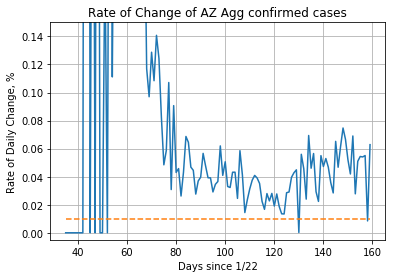

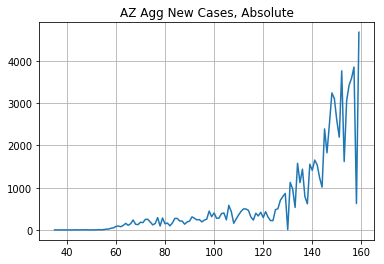

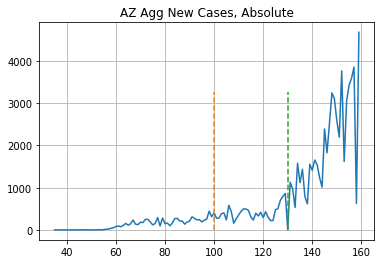

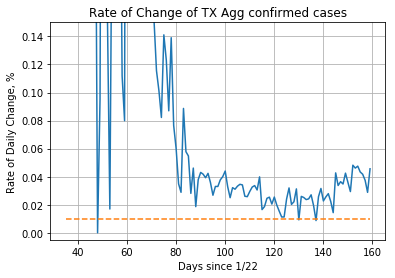

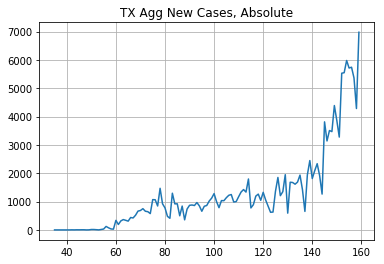

...

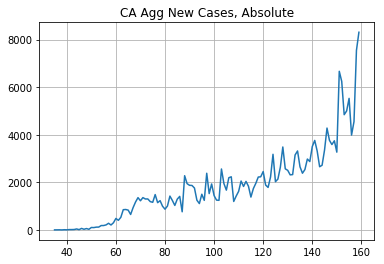

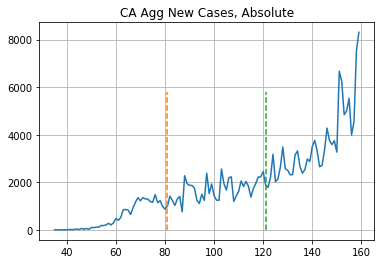

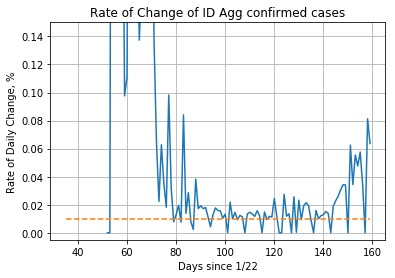

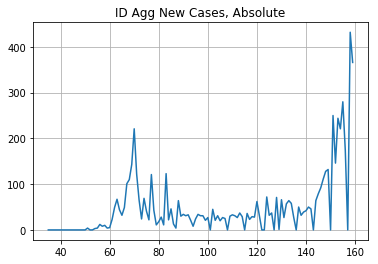

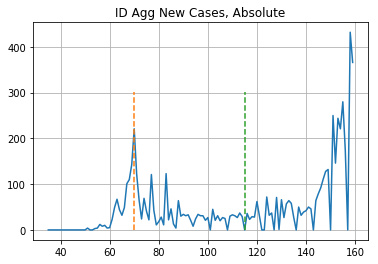

In [201]:

for state in d1['bad'][:5]:
    plt.close()
    y = single_state(state)
    new_col = [x[1].sum() for x in y.iterrows()]
    df['{}_agg'.format(state)] = new_col
    x = create_roc_and_new_case_numbers(df['{}_agg'.format(state)], '{} Agg'.format(state))
    initial_pptn = 0.1
    thresh_date = x[0]['{}_agg'.format(state)][x[0]['{}_agg'.format(state)] > x[0]['{}_agg'.format(state)].iloc[-1] * initial_pptn].index[0]
    thresh_idx = list(df.index).index(thresh_date)
    mid = thresh_idx + (df.shape[0] - thresh_idx) // 2
    mid
    lHalf = x[1][thresh_idx:mid].sum()
    rHalf = x[1][mid:].sum()
    # print(rHalf)
    # print(lHalf)
    create_new_case_graphs(df['{}_agg'.format(state)], '{} Agg'.format(state))
    plt.plot([thresh_idx, thresh_idx], [0, np.max(x[1])*.7], linestyle='dashed')
    plt.plot([mid, mid], [0, np.max(x[1])*.7], linestyle='dashed')
    plt.show()

['IL', 'MI', 'CT', 'DC', 'DE', 'MA', 'NJ', 'NY', 'PA', 'RI', 'VT']


c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


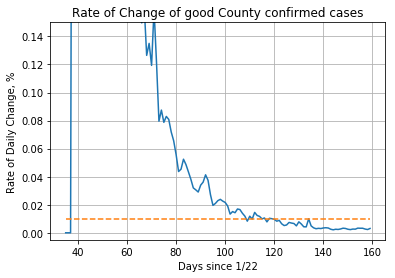

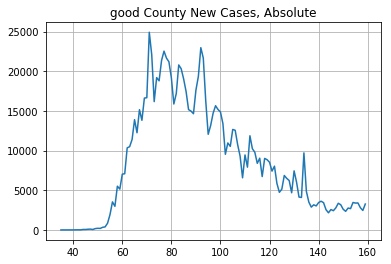


['AZ', 'TX', 'OK', 'CA', 'ID', 'UT', 'WY', 'NV', 'FL', 'AR', 'AL', 'SC', 'NC']


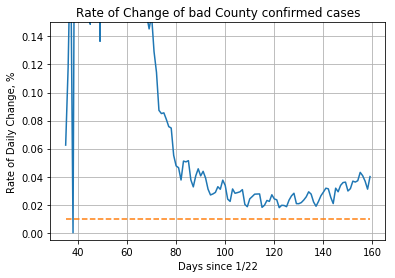

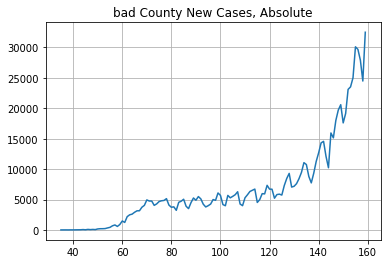


['NM', 'WA', 'OH', 'KY', 'VA']


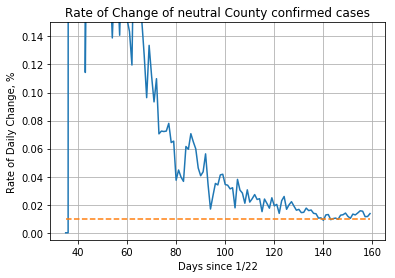

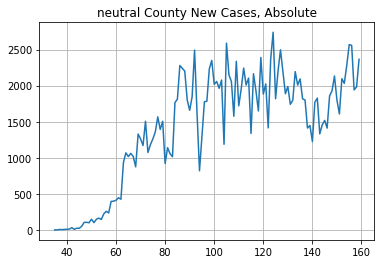


['CO', 'MN', 'ND', 'SD', 'NE', 'KS', 'IA', 'IN', 'LA', 'WV', 'MD', 'NH']


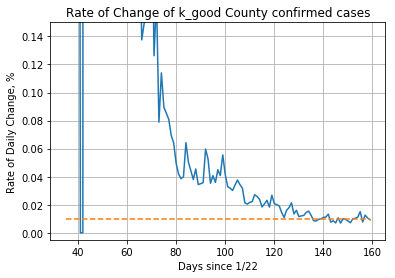

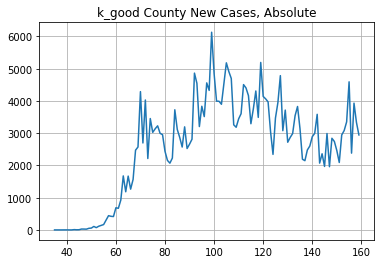


['OR', 'MT', 'WI', 'MO', 'MS', 'GA', 'TN', 'ME']


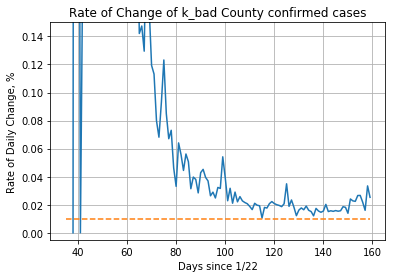

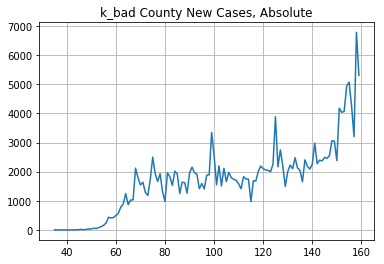

In [88]:
for i, who in enumerate(d1.keys()):
    who = d1[who]
    y = aggregate_region(who)
    new_col = [x[1].sum() for x in y.iterrows()]
    name = list(d1.keys())[i]
    df[name] = new_col
    print(who)
    create_roc_and_new_case_numbers(df[name], name)
    print()

### Categories are based on data from late June
### 'mandatory' - masks are mandatory in public areas
### 'emp_ptn' - masks are required for employees and patrons of certain businesses
### 'emp' - masks are required for employees of certain businesses
### 'none' - no mask requirements

['CA', 'NM', 'IL', 'MI', 'VA', 'MD', 'DE', 'NY', 'MA', 'RI', 'ME']


c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


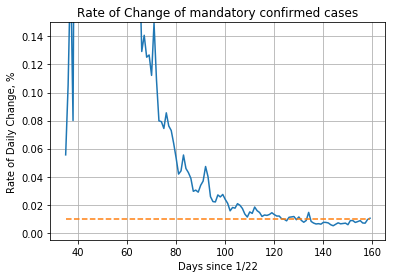

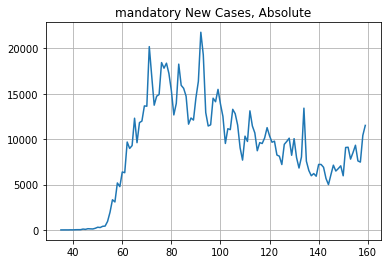


['AR', 'MS', 'TN', 'IN', 'NE', 'PA', 'NJ', 'CT', 'NH', 'WA', 'WY', 'DC']


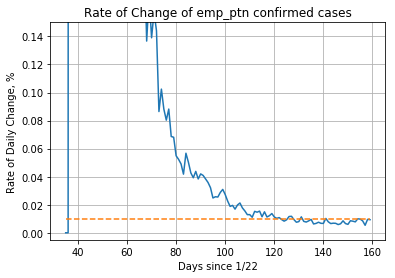

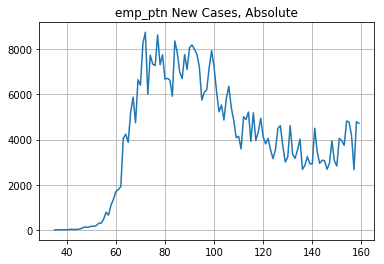


['OR', 'NV', 'CO', 'MN', 'LA', 'OH', 'KY', 'AL', 'GA', 'FL', 'VT']


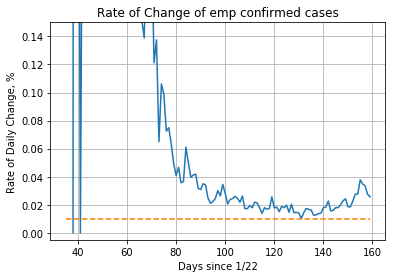

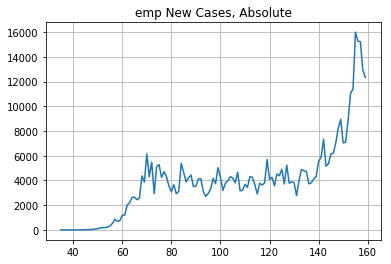


['ID', 'MT', 'UT', 'AZ', 'ND', 'SD', 'IA', 'WI', 'MO', 'KS', 'OK', 'TX', 'WV', 'NC', 'SC']


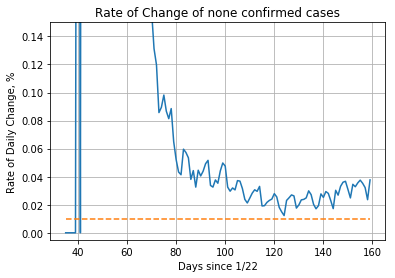

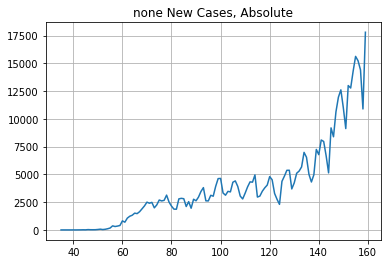

In [205]:
masks = {"mandatory": ["CA", "NM", "IL", "MI", "VA", "MD", "DE", "NY", "MA", "RI", "ME"],
    "emp_ptn": ['AR', 'MS', 'TN', 'IN', 'NE', 'PA', 'NJ', 'CT', 'NH', 'WA', 'WY', 'DC'],
    "emp": ['OR', 'NV', 'CO', 'MN', 'LA', 'OH', 'KY', 'AL', 'GA', 'FL', 'VT'],
    "none": ["ID", 'MT', 'UT', 'AZ', 'ND', 'SD', 'IA', 'WI', 'MO', 'KS', 'OK', 'TX', 'WV', 'NC', 'SC'] }

for i, who in enumerate(masks.keys()):
    who = masks[who]
    y = aggregate_region(who)
    new_col = [x[1].sum() for x in y.iterrows()]
    name = list(masks.keys())[i]
    df[name] = new_col
    print(who)
    create_roc_and_new_case_numbers(df[name], name)
    print()

mandatory: ['CA', 'NM', 'IL', 'MI', 'VA', 'MD', 'DE', 'NY', 'MA', 'RI', 'ME']
emp_ptn: ['AR', 'MS', 'TN', 'IN', 'NE', 'PA', 'NJ', 'CT', 'NH', 'WA', 'WY', 'DC']
emp: ['OR', 'NV', 'CO', 'MN', 'LA', 'OH', 'KY', 'AL', 'GA', 'FL', 'VT']
none: ['ID', 'MT', 'UT', 'AZ', 'ND', 'SD', 'IA', 'WI', 'MO', 'KS', 'OK', 'TX', 'WV', 'NC', 'SC']


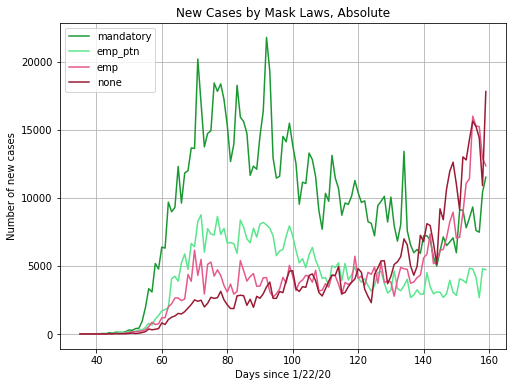

In [208]:
colors = [(0.1, 0.6, 0.2), (0.35, 0.9, 0.55), (0.9, 0.35, 0.55), (0.6, 0.1, 0.2)]

for who in masks.keys():
    print(who, masks[who], sep=": ")

plt.figure(figsize=(8, 6))
    
for i, who in enumerate(masks.keys()):
    create_new_case_graphs_colored(df[who], who, colors[i], smoothing_factor=1)
    
plt.grid()
plt.legend(loc=2)
plt.title("New Cases by Mask Laws, Absolute")
plt.ylabel("Number of new cases")
plt.xlabel("Days since 1/22/20")
plt.show()

mandatory: ['CA', 'NM', 'IL', 'MI', 'VA', 'MD', 'DE', 'NY', 'MA', 'RI', 'ME']
emp_ptn: ['AR', 'MS', 'TN', 'IN', 'NE', 'PA', 'NJ', 'CT', 'NH', 'WA', 'WY', 'DC']
emp: ['OR', 'NV', 'CO', 'MN', 'LA', 'OH', 'KY', 'AL', 'GA', 'FL', 'VT']
none: ['ID', 'MT', 'UT', 'AZ', 'ND', 'SD', 'IA', 'WI', 'MO', 'KS', 'OK', 'TX', 'WV', 'NC', 'SC']


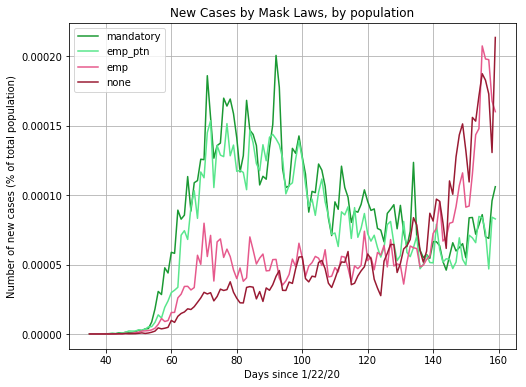

In [211]:
colors = [(0.1, 0.6, 0.2), (0.35, 0.9, 0.55), (0.9, 0.35, 0.55), (0.6, 0.1, 0.2)]

for who in masks.keys():
    print(who, masks[who], sep=": ")

plt.figure(figsize=(8, 6))
    
for i, who in enumerate(masks.keys()):
    create_new_case_graphs_colored(df[who] / state_pops.loc[masks[who]].sum(), who, colors[i], smoothing_factor=1)
    
plt.grid()
plt.legend(loc=2)
plt.title("New Cases by Mask Laws, by population")
plt.ylabel("Number of new cases (% of total population)")
plt.xlabel("Days since 1/22/20")
plt.show()

mandatory: ['CA', 'NM', 'IL', 'MI', 'VA', 'MD', 'DE', 'NY', 'MA', 'RI', 'ME']
emp_ptn: ['AR', 'MS', 'TN', 'IN', 'NE', 'PA', 'NJ', 'CT', 'NH', 'WA', 'WY', 'DC']
emp: ['OR', 'NV', 'CO', 'MN', 'LA', 'OH', 'KY', 'AL', 'GA', 'FL', 'VT']
none: ['ID', 'MT', 'UT', 'AZ', 'ND', 'SD', 'IA', 'WI', 'MO', 'KS', 'OK', 'TX', 'WV', 'NC', 'SC']


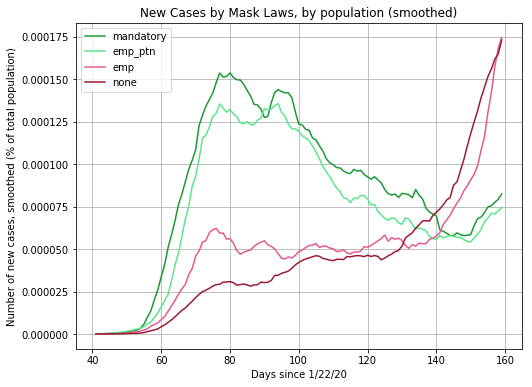

In [212]:
colors = [(0.1, 0.6, 0.2), (0.35, 0.9, 0.55), (0.9, 0.35, 0.55), (0.6, 0.1, 0.2)]

for who in masks.keys():
    print(who, masks[who], sep=": ")

plt.figure(figsize=(8, 6))
    
for i, who in enumerate(masks.keys()):
    create_new_case_graphs_colored(df[who] / state_pops.loc[masks[who]].sum(), who, colors[i], smoothing_factor=7)
    
plt.grid()
plt.legend(loc=2)
plt.title("New Cases by Mask Laws, by population (smoothed)")
plt.ylabel("Number of new cases, smoothed (% of total population)")
plt.xlabel("Days since 1/22/20")
plt.show()

c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in longlong_scalars
  import sys
c:\users\thalo\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in longlong_scalars
  import sys


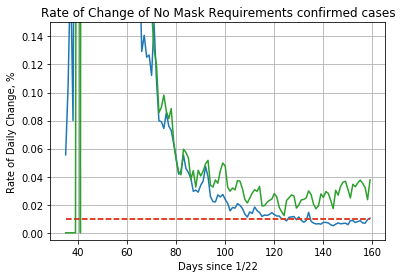

In [215]:
create_roc_graphs(df['mandatory'], 'Mandatory Masks')
create_roc_graphs(df['none'], 'No Mask Requirements')
plt.grid()

In [90]:
cross_dict = {
    "good_strict": [], "bad_strict": [], "good_loose": [], "bad_loose": []
             }

for dk in d1.keys():
    for m1 in masks.keys():
        match = False
        cross_section = set(d1[dk]) & set(masks[m1])
        if dk in ['good', 'k_good'] and m1 in ['mandatory', 'emp_ptn']:
            match = True
            cross_dict['good_strict'].extend([state for state in cross_section])
        elif dk in ['bad', 'k_bad'] and m1 in ['emp', 'none']:
            match = True
            cross_dict['bad_loose'].extend([state for state in cross_section])
        elif dk == 'neutral':
            match = True
        elif dk in ['good', 'k_good']:
            cross_dict['good_loose'].extend([state for state in cross_section])
        elif dk in ['bad', 'k_bad']:
            cross_dict['bad_strict'].extend([state for state in cross_section])
        print("Intersection:", match, dk, m1, cross_section )

print()
print(cross_dict)

Intersection: True good mandatory {'MI', 'DE', 'IL', 'MA', 'RI', 'NY'}
Intersection: True good emp_ptn {'DC', 'CT', 'NJ', 'PA'}
Intersection: False good emp {'VT'}
Intersection: False good none set()
Intersection: False bad mandatory {'CA'}
Intersection: False bad emp_ptn {'WY', 'AR'}
Intersection: True bad emp {'FL', 'AL', 'NV'}
Intersection: True bad none {'ID', 'UT', 'AZ', 'SC', 'TX', 'NC', 'OK'}
Intersection: True neutral mandatory {'NM', 'VA'}
Intersection: True neutral emp_ptn {'WA'}
Intersection: True neutral emp {'KY', 'OH'}
Intersection: True neutral none set()
Intersection: True k_good mandatory {'MD'}
Intersection: True k_good emp_ptn {'NE', 'IN', 'NH'}
Intersection: False k_good emp {'MN', 'CO', 'LA'}
Intersection: False k_good none {'IA', 'SD', 'WV', 'ND', 'KS'}
Intersection: False k_bad mandatory {'ME'}
Intersection: False k_bad emp_ptn {'MS', 'TN'}
Intersection: True k_bad emp {'OR', 'GA'}
Intersection: True k_bad none {'WI', 'MO', 'MT'}

{'good_strict': ['MI', 'DE', 'IL

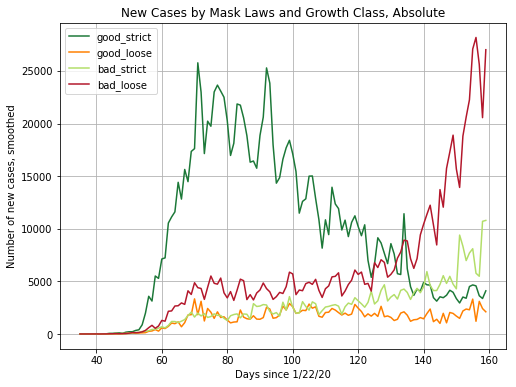

In [216]:

plt.figure(figsize=(8, 6))
    
y = aggregate_region(cross_dict['good_strict'])
new_col = [x[1].sum() for x in y.iterrows()]
df['good_strict'] = new_col
create_new_case_graphs_colored(df['good_strict'], 'good_strict', (0.11, 0.47, 0.22), smoothing_factor=1)

y = aggregate_region(cross_dict['good_loose'])
new_col = [x[1].sum() for x in y.iterrows()]
df['good_loose'] = new_col
create_new_case_graphs_colored(df['good_loose'], 'good_loose', (1.0, 0.5, 0.0), smoothing_factor=1)

y = aggregate_region(cross_dict['bad_strict'])
new_col = [x[1].sum() for x in y.iterrows()]
df['bad_strict'] = new_col
create_new_case_graphs_colored(df['bad_strict'], 'bad_strict', (0.7, 0.87, 0.41), smoothing_factor=1)

y = aggregate_region(cross_dict['bad_loose'])
new_col = [x[1].sum() for x in y.iterrows()]
df['bad_loose'] = new_col
create_new_case_graphs_colored(df['bad_loose'], 'bad_loose', (0.7, 0.09, 0.17), smoothing_factor=1)

plt.grid()
plt.legend(loc=2)
plt.title("New Cases by Mask Laws and Growth Class, Absolute")
plt.ylabel("Number of new cases")
plt.xlabel("Days since 1/22/20")
plt.show()

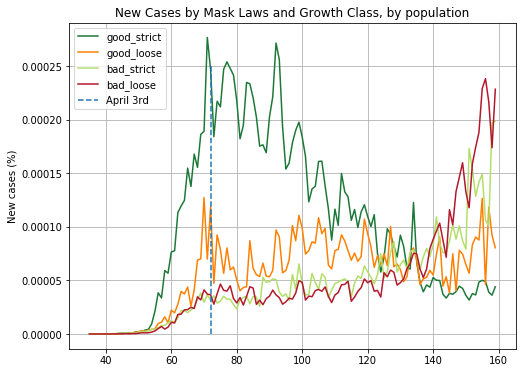

In [220]:
state_pops.loc[cross_dict['good_strict']].sum()

plt.figure(figsize=(8, 6))
    
y = aggregate_region(cross_dict['good_strict'])
new_col = [x[1].sum() / state_pops.loc[cross_dict['good_strict']].sum() for x in y.iterrows()]
df['good_strict'] = new_col
create_new_case_graphs_colored(df['good_strict'], 'good_strict', (0.11, 0.47, 0.22), smoothing_factor=1)

y = aggregate_region(cross_dict['good_loose'])
new_col = [x[1].sum() / state_pops.loc[cross_dict['good_loose']].sum() for x in y.iterrows()]
df['good_loose'] = new_col
create_new_case_graphs_colored(df['good_loose'], 'good_loose', (1.0, 0.5, 0.0), smoothing_factor=1)

y = aggregate_region(cross_dict['bad_strict'])
new_col = [x[1].sum() / state_pops.loc[cross_dict['bad_strict']].sum() for x in y.iterrows()]
df['bad_strict'] = new_col
create_new_case_graphs_colored(df['bad_strict'], 'bad_strict', (0.7, 0.87, 0.41), smoothing_factor=1)

y = aggregate_region(cross_dict['bad_loose'])
new_col = [x[1].sum() / state_pops.loc[cross_dict['bad_loose']].sum() for x in y.iterrows()]
df['bad_loose'] = new_col
create_new_case_graphs_colored(df['bad_loose'], 'bad_loose', (0.7, 0.09, 0.17), smoothing_factor=1)

plt.grid()
plt.title("New Cases by Mask Laws and Growth Class, by population")
plt.ylabel("Number of new cases")
plt.ylabel("New cases (%)")
plt.plot([np.where(df.index == '4/3/20')[0][0], np.where(df.index == '4/3/20')[0][0]], [0, 0.00025], \
         linestyle='dashed', label="April 3rd")
plt.legend(loc=2)


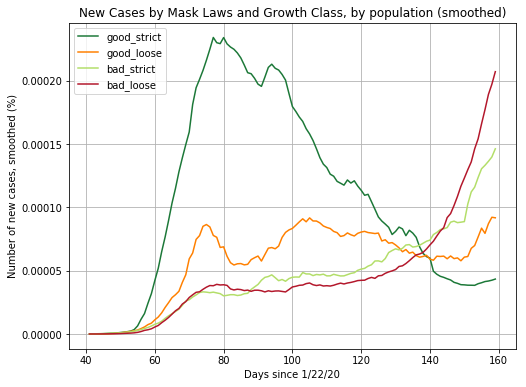

In [219]:

plt.figure(figsize=(8, 6))
    
y = aggregate_region(cross_dict['good_strict'])
new_col = [x[1].sum() for x in y.iterrows()]
df['good_strict'] = new_col
create_new_case_graphs_colored(df['good_strict'] / state_pops.loc[cross_dict['good_strict']].sum(), 'good_strict', (0.11, 0.47, 0.22))

y = aggregate_region(cross_dict['good_loose'])
new_col = [x[1].sum() for x in y.iterrows()]
df['good_loose'] = new_col
create_new_case_graphs_colored(df['good_loose'] / state_pops.loc[cross_dict['good_loose']].sum(), 'good_loose', (1.0, 0.5, 0.0))

y = aggregate_region(cross_dict['bad_strict'])
new_col = [x[1].sum() for x in y.iterrows()]
df['bad_strict'] = new_col
create_new_case_graphs_colored(df['bad_strict'] / state_pops.loc[cross_dict['bad_strict']].sum(), 'bad_strict', (0.7, 0.87, 0.41))

y = aggregate_region(cross_dict['bad_loose'])
new_col = [x[1].sum() for x in y.iterrows()]
df['bad_loose'] = new_col
create_new_case_graphs_colored(df['bad_loose'] / state_pops.loc[cross_dict['bad_loose']].sum(), 'bad_loose', (0.7, 0.09, 0.17))

plt.grid()
plt.legend(loc=2)
plt.title("New Cases by Mask Laws and Growth Class, by population (smoothed)")
plt.ylabel("Number of new cases, smoothed (%)")
plt.xlabel("Days since 1/22/20")
plt.show()

## Recreate graphs based on population

In [159]:
filepath = "C:/Users/Thalo/Downloads/covid_county_population_usafacts.csv"
df3 = pd.read_csv(filepath)

df3 = df3.set_index("County Name").T
df3.drop(["countyFIPS"], inplace=True)

df3.drop("Statewide Unallocated", axis=1, inplace=True)

# df / df3
# Wade Hampton Census Area
# Grand Princess Cruise Ship
# New York City Unallocated
unpopulated = ["Wade Hampton Census Area", "Grand Princess Cruise Ship", "New York City Unallocated"]
df3.drop(unpopulated, axis=1, inplace=True)

df5 = df3.T
for key in cross_dict.keys():
    df5[key] = df5['State'].isin(cross_dict[key])

# df5[df5.good_loose]
state_pops = df5.groupby('State')['population'].sum()


good ['IL', 'MI', 'CT', 'DC', 'DE', 'MA', 'NJ', 'NY', 'PA', 'RI', 'VT']
bad ['AZ', 'TX', 'OK', 'CA', 'ID', 'UT', 'WY', 'NV', 'FL', 'AR', 'AL', 'SC', 'NC']
neutral ['NM', 'WA', 'OH', 'KY', 'VA']
k_good ['CO', 'MN', 'ND', 'SD', 'NE', 'KS', 'IA', 'IN', 'LA', 'WV', 'MD', 'NH']
k_bad ['OR', 'MT', 'WI', 'MO', 'MS', 'GA', 'TN', 'ME']



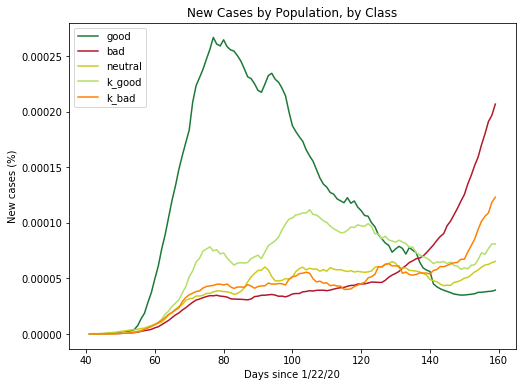

In [118]:
color_list = [(0.11, 0.47, 0.22), (0.7, 0.09, 0.17), (0.8, 0.8, 0.1), (0.7, 0.87, 0.41), (1.0, 0.5, 0.0)]
plt.figure(figsize=(8, 6))

for i, who in enumerate(d1.keys()):
    who = d1[who]
    y = aggregate_region(who)
    new_col = [x[1].sum() / state_pops.loc[who].sum() for x in y.iterrows()]
    name = list(d1.keys())[i]
    df[name] = new_col
    print(name, who)
    create_new_case_graphs_colored(df[name], name, color_list[i])
print()



plt.grid()
plt.title("New Cases by Population, by Class")
plt.xlabel("Days since 1/22/20")
plt.ylabel("New cases (%)")
# plt.plot([np.where(df.index == '4/3/2020')[0][0], np.where(df.index == '4/3/2020')[0][0]], [0, 0.00025], \
#          linestyle='dashed', label="April 3rd")
plt.legend(loc=2)


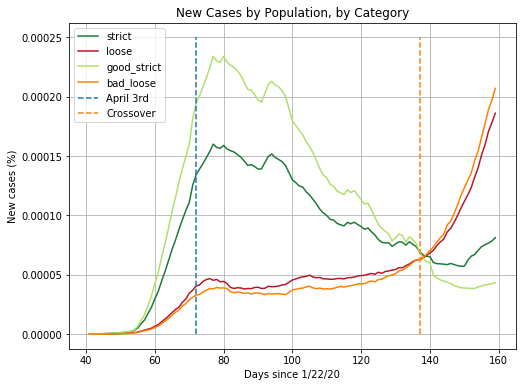

In [119]:
state_pops.loc[cross_dict['good_strict']].sum()

plt.figure(figsize=(8, 6))
    
y = aggregate_region(cross_dict['good_strict'] + cross_dict['bad_strict'])
new_col = [x[1].sum() / state_pops.loc[cross_dict['good_strict'] + cross_dict['bad_strict']].sum() for x in y.iterrows()]
df['strict'] = new_col
create_new_case_graphs_colored(df['strict'], 'strict', (0.11, 0.47, 0.22))

y = aggregate_region(cross_dict['bad_loose'] + cross_dict['good_loose'])
new_col = [x[1].sum() / state_pops.loc[cross_dict['bad_loose'] + cross_dict['good_loose']].sum() for x in y.iterrows()]
df['loose'] = new_col
create_new_case_graphs_colored(df['loose'], 'loose', (0.7, 0.09, 0.17))

y = aggregate_region(cross_dict['good_strict'])
new_col = [x[1].sum() / state_pops.loc[cross_dict['good_strict']].sum() for x in y.iterrows()]
df['good_strict'] = new_col
create_new_case_graphs_colored(df['good_strict'], 'good_strict', (0.7, 0.87, 0.41))

y = aggregate_region(cross_dict['bad_loose'])
new_col = [x[1].sum() / state_pops.loc[cross_dict['bad_loose']].sum() for x in y.iterrows()]
df['bad_loose'] = new_col
create_new_case_graphs_colored(df['bad_loose'], 'bad_loose', (1.0, 0.5, 0.0))


plt.grid()
plt.title("New Cases by Population, by Category")
plt.xlabel("Days since 1/22/20")
plt.ylabel("New cases (%)")
plt.plot([np.where(df.index == '4/3/20')[0][0], np.where(df.index == '4/3/20')[0][0]], [0, 0.00025], \
         linestyle='dashed', label="April 3rd")
plt.plot([np.where(df.index == '6/7/20')[0][0], np.where(df.index == '6/7/20')[0][0]], [0, 0.00025], \
         linestyle='dashed', label="Crossover")

plt.legend(loc=2)


In [98]:
state_col2 = state_col.copy()
state_col2 = state_col2[state_col2.index != "Statewide Unallocated"]
state_col2 = state_col2[state_col2.index != "New York City Unallocated/Probable"]
state_col2 = state_col2[state_col2.index != "Grand Princess Cruise Ship"]


In [ ]:
### Find intersection of strict states and loose states

strict = df['strict'].values[1:] - df['strict'].values[:-1]
loose = df['loose'].values[1:] - df['loose'].values[:-1]

# print(strict)
# print()
# print(loose)

df.iloc[ (strict < loose).argmax() ]
(strict < loose).argmax()

# new_col = [x[1].sum() / state_pops.loc[cross_dict['good_strict'] + cross_dict['bad_strict']].sum() for x in y.iterrows()]
# df['strict'] = new_col
# create_new_case_graphs_colored(df['strict'], 'strict', (0.11, 0.47, 0.22))

# y = aggregate_region(cross_dict['bad_loose'] + cross_dict['good_loose'])
# new_col = [x[1].sum() / state_pops.loc[cross_dict['bad_loose'] + cross_dict['good_loose']].sum() for x in y.iterrows()]
